In [61]:
import os
from PIL import Image
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from tensorflow.keras.models import load_model

In [62]:
user = 'fmantecam'

In [63]:

model = load_model('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\trained_models\\definitivo\\multichannel_model_simple_WITHOUTOUTLIERS_V291124_2_percentilesmahalanobis_5\\model_backup.h5')

In [64]:

# Load the model only once at the beginning
model = load_model('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\trained_models\\definitivo\\multichannel_model_simple_WITHOUTOUTLIERS_V291124_2_percentilesmahalanobis_5\\model_backup.h5')

# Define file paths and class colors
base_path = "C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\"
ruta_infomapas = r'C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\infomapas.CSV'
colores = {0: [255, 0, 255], 1: [0, 0, 255], 2: [0, 255, 0], 3: [255, 255, 0]}

# Function to load data and drop unnecessary columns
def cargar_datos(ruta_csv):
    df = pd.read_csv(ruta_csv, low_memory=False)
    df_coords = df[['X', 'Y', 'name']]  # Save coordinate and name columns
    df_features = df.drop(columns=['X', 'Y', 'name', 't_exp', 'date', 'medium', 'especie'])  # Drop unnecessary columns
    return df_coords, df_features

# Load trainval and test datasets
X_Y_name_corrected_trainval, X_trainval_corrected = cargar_datos(base_path + "species_CORRECTED_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_kmeans_percentile_281124.csv")
X_Y_name_baselines_trainval, X_trainval_baselines = cargar_datos(base_path + "species_BASELINES_normSPECTRUM_SNR30_V271124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv")
X_Y_name_originals_trainval, X_trainval_originals = cargar_datos(base_path + "RAW_CyanobacteriaSpecies_RamanSpectra.csv")

X_Y_name_corrected_test, X_test_corrected = cargar_datos(base_path + "especiesUAM_UNSEENS_CORRECTED_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv")
X_Y_name_baselines_test, X_test_baselines = cargar_datos(base_path + "especiesUAM_UNSEENS_BASELINES_normSPECTRUM_SNR30_V171124_FILTRADOPLASTICO2percent_withCOORDINATES_WITHOUTOUTLIERS_percentile_281124.csv")
X_Y_name_originals_test, X_test_originals = cargar_datos(base_path + "RAW_CyanobacteriaSpecies_RamanSpectra_UNSEENS.csv")

# Function to predict classes from the model
def obtener_predicciones(model, data):
    predicciones = model.predict(data)  # Predict the class probabilities
    return np.argmax(predicciones, axis=1)  # Convert to class labels

predicciones_trainval = obtener_predicciones(model, [X_trainval_corrected, X_trainval_baselines, X_trainval_originals])
predicciones_test = obtener_predicciones(model, [X_test_corrected, X_test_baselines, X_test_originals])

# Load the infomapas file once
df_infomapas = pd.read_csv(ruta_infomapas)

# Function to search for a JPG image file containing the specified name
def buscar_imagen_jpg(name, base_path='C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\mix\\'):
    for root, _, files in os.walk(base_path):
        for archivo in files:
            if name in archivo and archivo.endswith('.jpg'):  # If name is in the file name and ends with '.jpg'
                return Image.open(os.path.join(root, archivo)).convert('RGB')
    return None

# Function to plot the coordinate map with predictions
def plot_coordinate_map_with_predictions(group, predicciones, df_infomapas, name, colores):
    group_infomapas = df_infomapas[df_infomapas['filename'] == name]
    if group_infomapas.empty:  # Skip if there is no info for this file
        print(f"No data in infomapas for file: {name}")
        return
    
    # Retrieve coordinate limits and steps
    X_min, X_max, Y_min, Y_max = group_infomapas[['X_min', 'X_max', 'Y_min', 'Y_max']].values[0]
    X_step, Y_step = group_infomapas[['X_step', 'Y_step']].values[0]
    x_range, y_range = np.arange(X_min, X_max + X_step, X_step), np.arange(Y_min, Y_max + Y_step, Y_step)
    mapa_clasificacion = np.full((len(y_range), len(x_range), 3), [0, 0, 0])  # Initialize as black (RGB)

    # Map each prediction to a color in the classification map
    for i, (index, row) in enumerate(group.iterrows()):
        x_idx, y_idx = np.argmin(np.abs(x_range - row['X'])), np.argmin(np.abs(y_range + row['Y']))  # Get pixel location
        mapa_clasificacion[y_idx, x_idx] = colores[predicciones[i]]

    imagen_jpg = buscar_imagen_jpg(name)  # Search for JPG image
    fig, ax = plt.subplots(1, 2, figsize=(15, 7)) if imagen_jpg else plt.subplots(figsize=(8, 8))

    # Plot the JPG image if found
    if imagen_jpg:
        ax[0].imshow(imagen_jpg)
        ax[0].axis('off')
    ax_main = ax[1] if isinstance(ax, np.ndarray) else ax  # Use correct axis
    ax_main.imshow(mapa_clasificacion, origin='lower', extent=[X_min, X_max, Y_min, Y_max])
    ax_main.set_xlabel('X ($\\mu$m)')
    ax_main.set_ylabel('Y ($\\mu$m)')
    ax_main.set_title(f"{name}")
    
    # Create legend for the classes
    patches = [mpatches.Patch(color=np.array(color)/255, label=clase) for clase, color in zip(['UAM253', 'UAM502', 'UAM565', 'UAM588'], colores.values())]
    ax_main.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

    # Calculate and print the percentage of pixels for each class
    total_pixels = np.count_nonzero(mapa_clasificacion.any(axis=2))  # Total non-black pixels
    class_percentages = {}
    for class_id, color in colores.items():
        class_pixels = np.sum((mapa_clasificacion == color).all(axis=2))
        percentage = (class_pixels / total_pixels) * 100 if total_pixels > 0 else 0
        class_percentages[class_id] = percentage
        print(f"Class {class_id} ({['UAM253', 'UAM502', 'UAM565', 'UAM588'][class_id]}): {percentage:.2f}%")

    plt.show()


1211/1211 ━━━━━━━━━━━━━━━━━━━━ 32s 26ms/step
225/225 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step


Class 0 (UAM253): 95.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 5.00%
Class 3 (UAM588): 0.00%


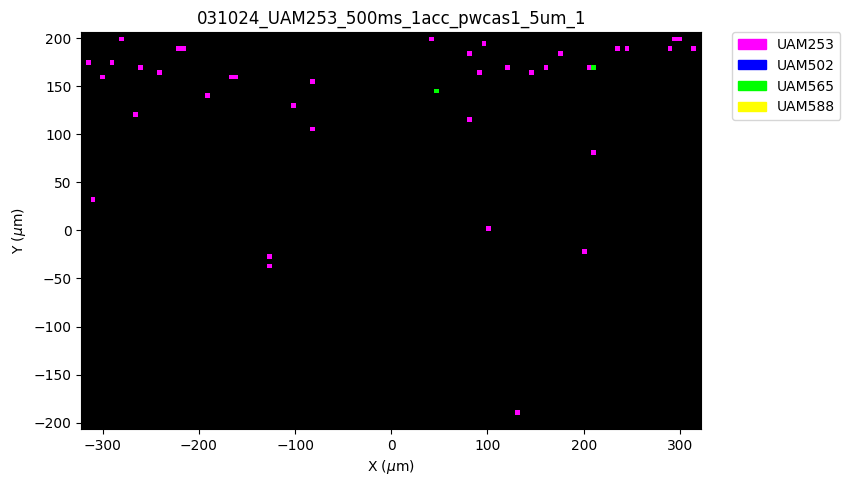

Class 0 (UAM253): 100.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


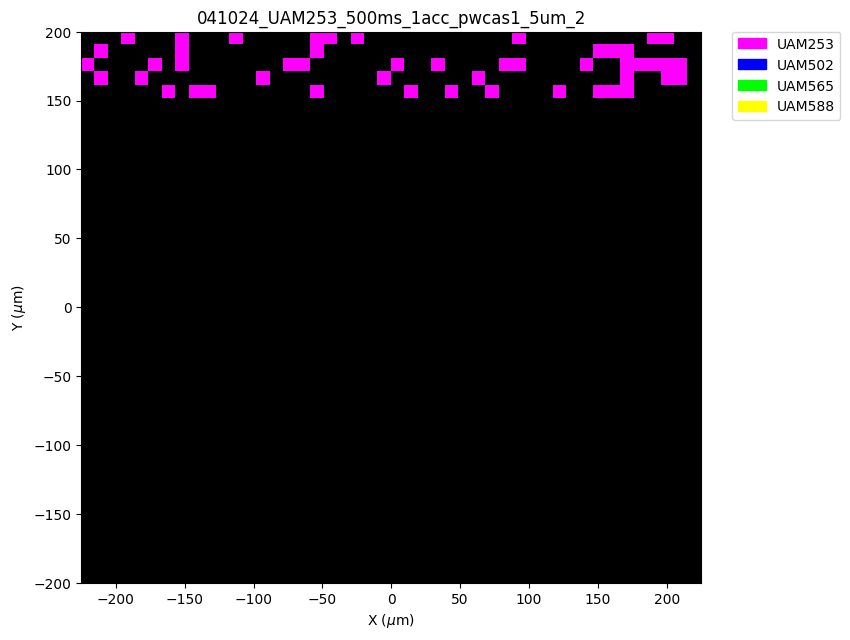

Class 0 (UAM253): 99.26%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.74%


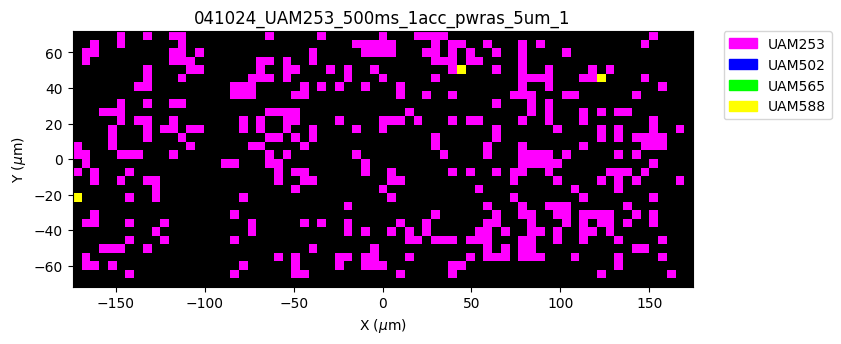

Class 0 (UAM253): 98.66%
Class 1 (UAM502): 0.10%
Class 2 (UAM565): 0.30%
Class 3 (UAM588): 0.95%


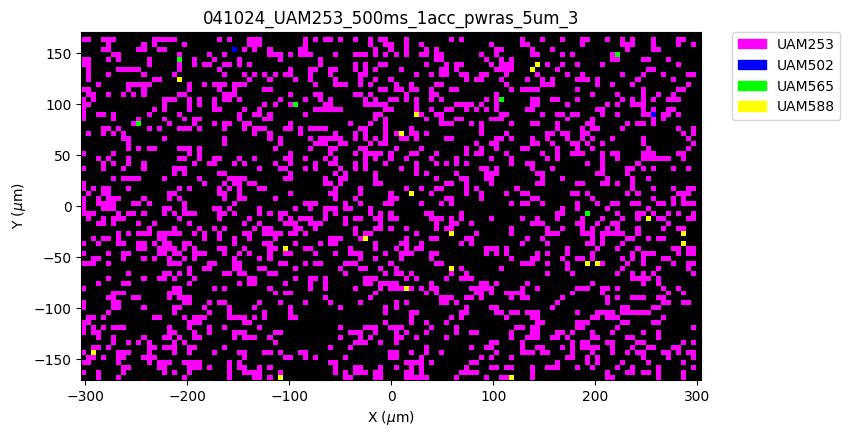

Class 0 (UAM253): 0.66%
Class 1 (UAM502): 74.34%
Class 2 (UAM565): 3.29%
Class 3 (UAM588): 21.71%


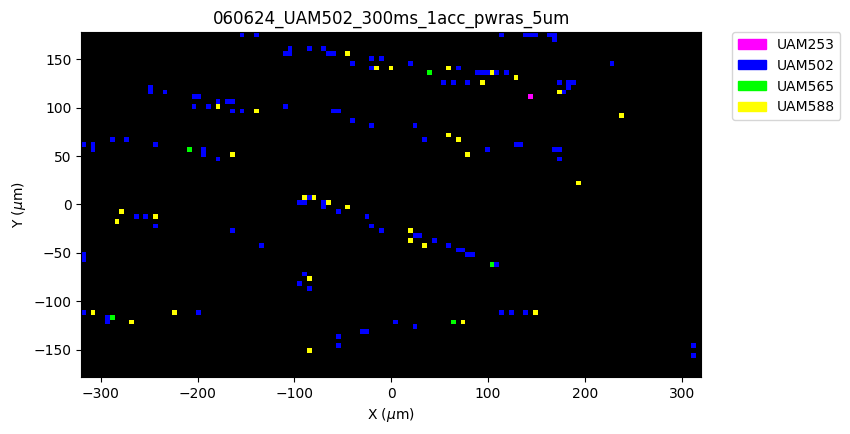

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 31.41%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 68.59%


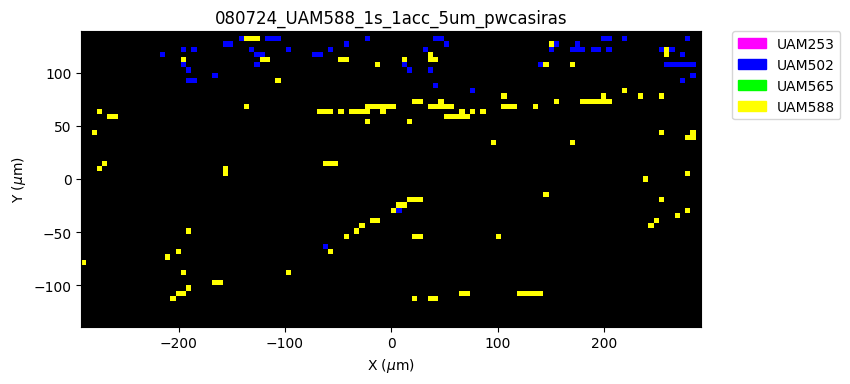

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.10%
Class 2 (UAM565): 99.90%
Class 3 (UAM588): 0.00%


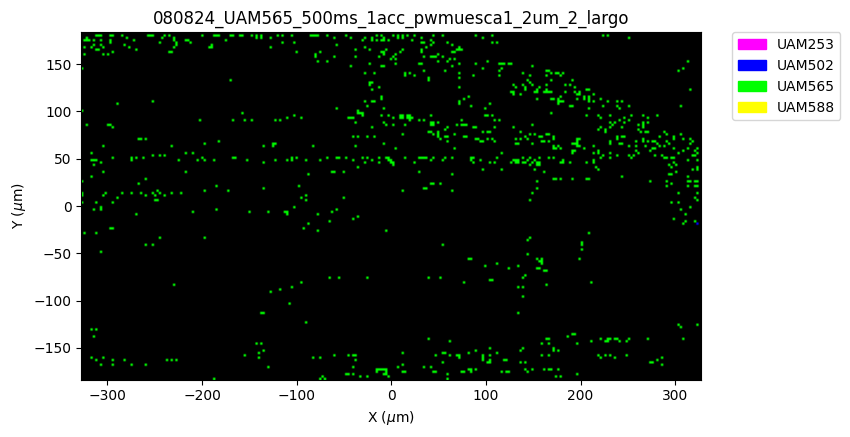

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 2.08%
Class 2 (UAM565): 97.92%
Class 3 (UAM588): 0.00%


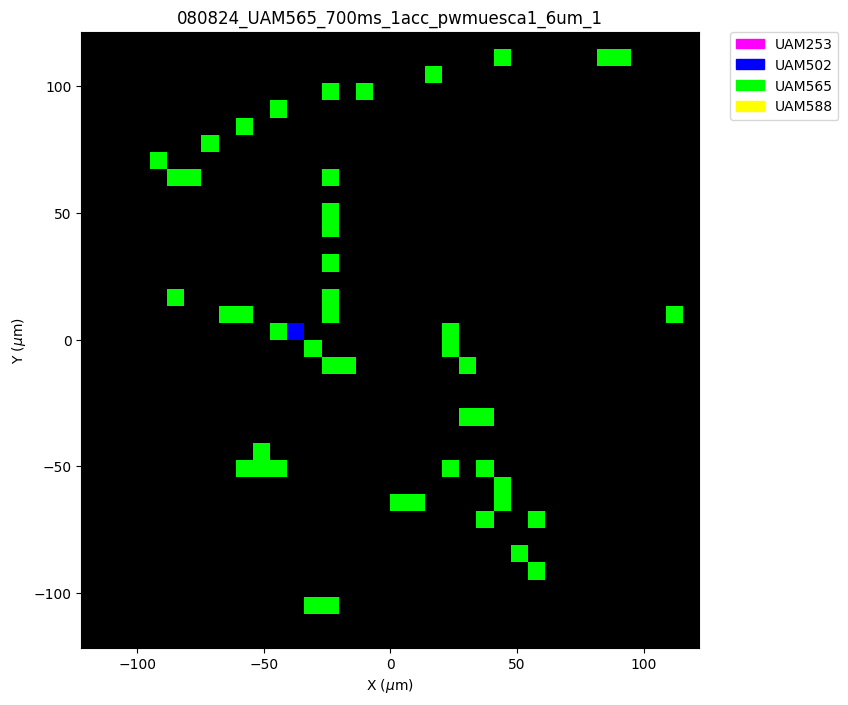

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


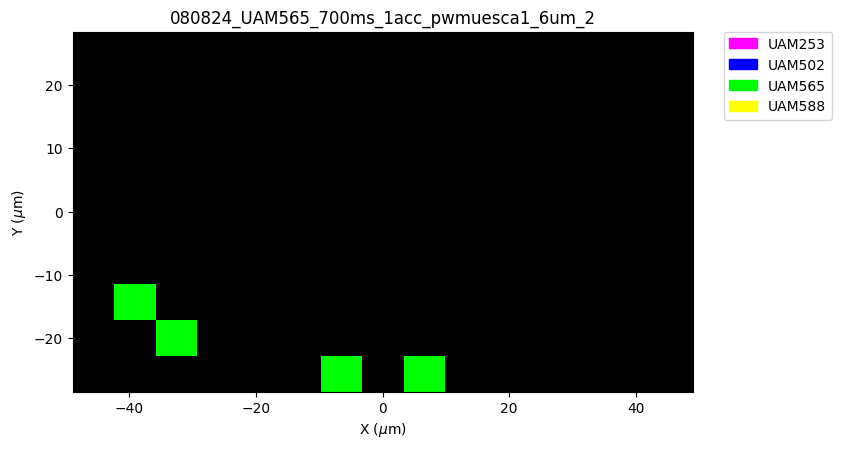

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 2.44%
Class 2 (UAM565): 97.56%
Class 3 (UAM588): 0.00%


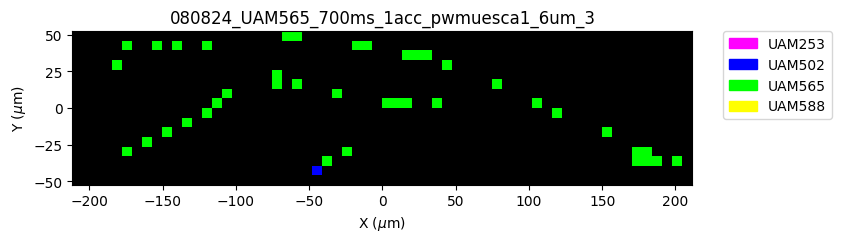

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


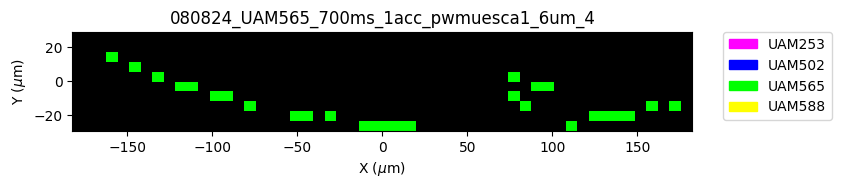

Class 0 (UAM253): 1.11%
Class 1 (UAM502): 9.82%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 89.07%


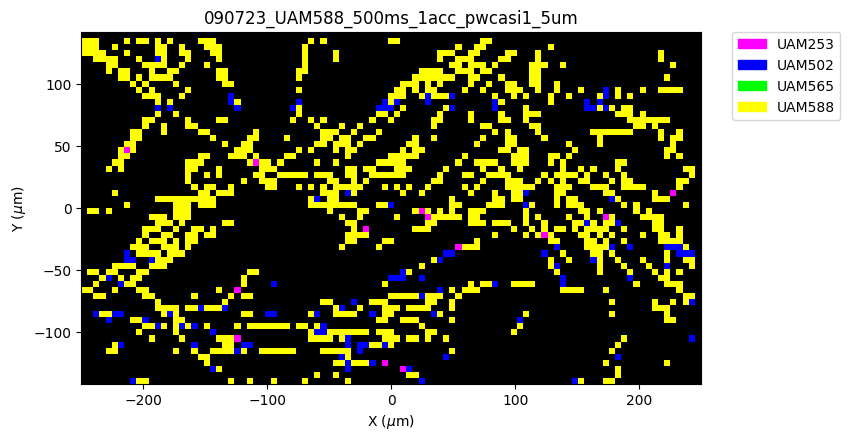

Class 0 (UAM253): 0.44%
Class 1 (UAM502): 11.79%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 87.77%


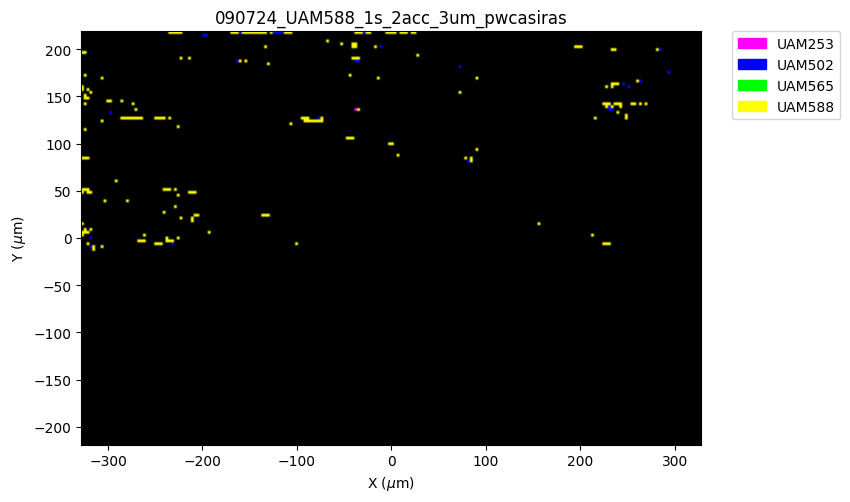

Class 0 (UAM253): 3.64%
Class 1 (UAM502): 7.56%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 88.80%


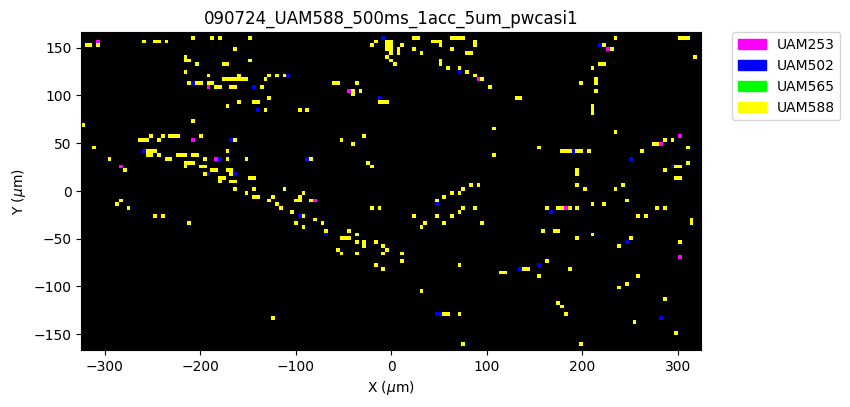

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.42%
Class 2 (UAM565): 99.58%
Class 3 (UAM588): 0.00%


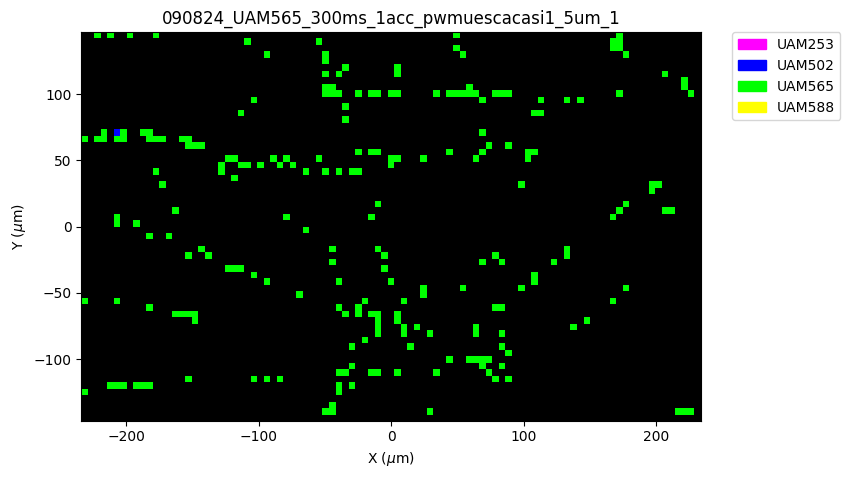

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


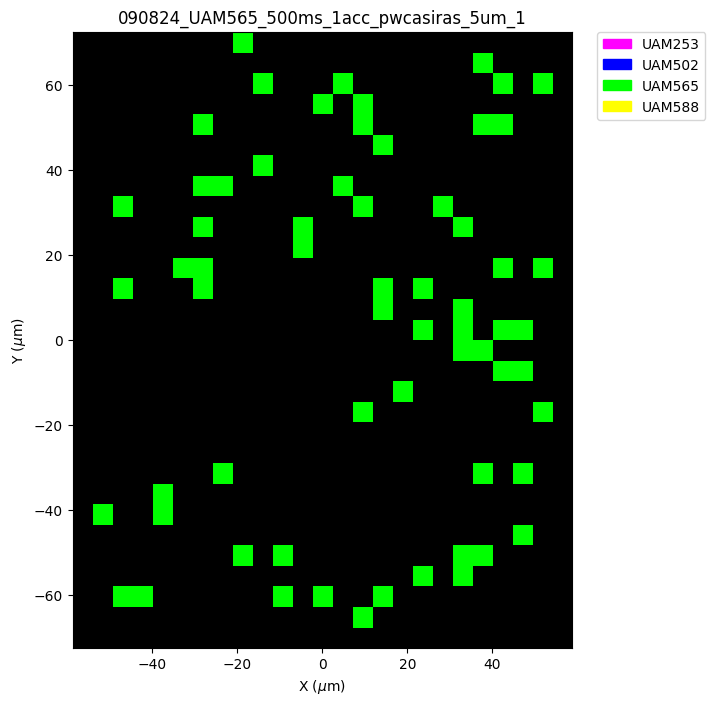

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.90%
Class 2 (UAM565): 99.10%
Class 3 (UAM588): 0.00%


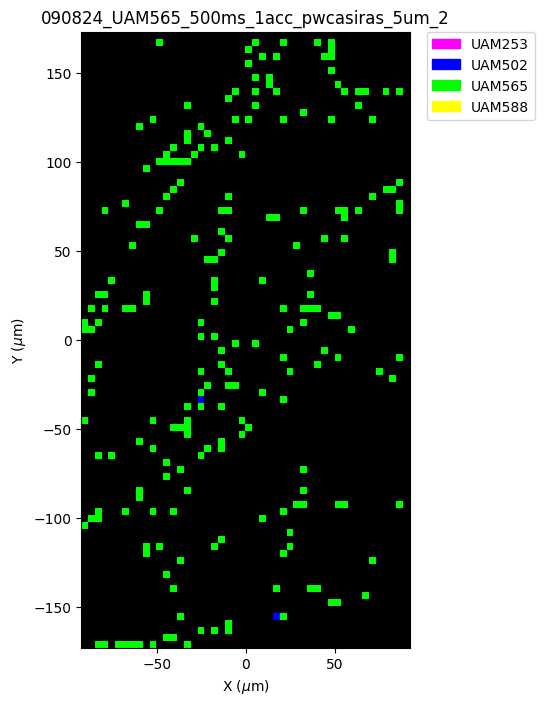

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


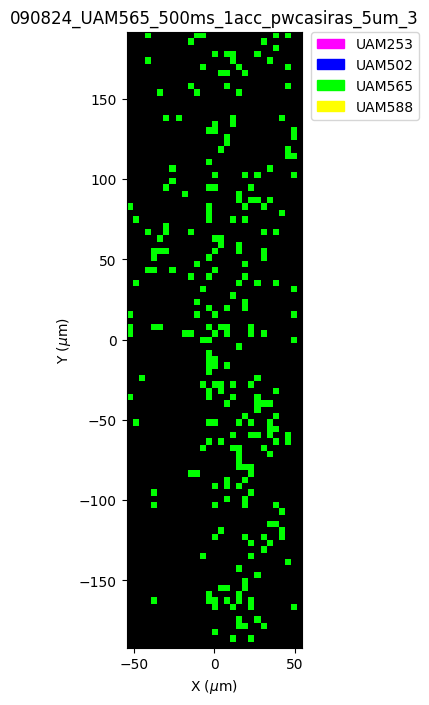

Class 0 (UAM253): 0.58%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 99.42%
Class 3 (UAM588): 0.00%


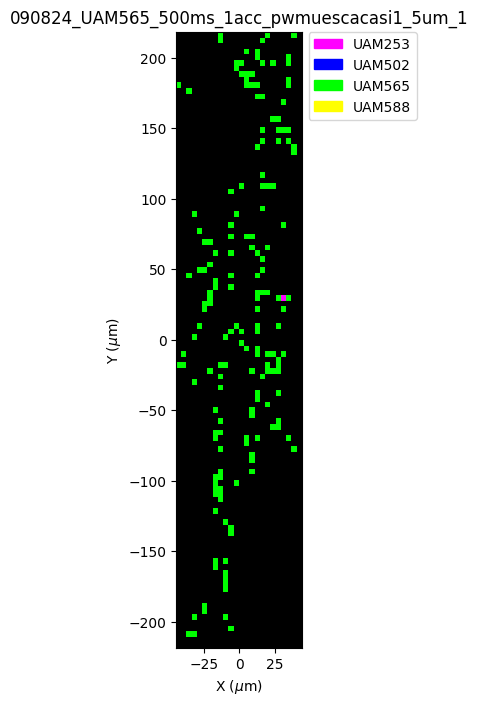

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.72%
Class 2 (UAM565): 99.28%
Class 3 (UAM588): 0.00%


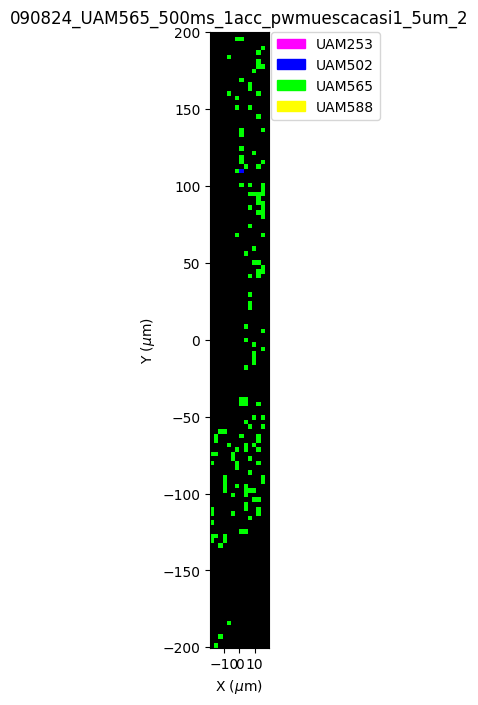

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.44%
Class 2 (UAM565): 99.56%
Class 3 (UAM588): 0.00%


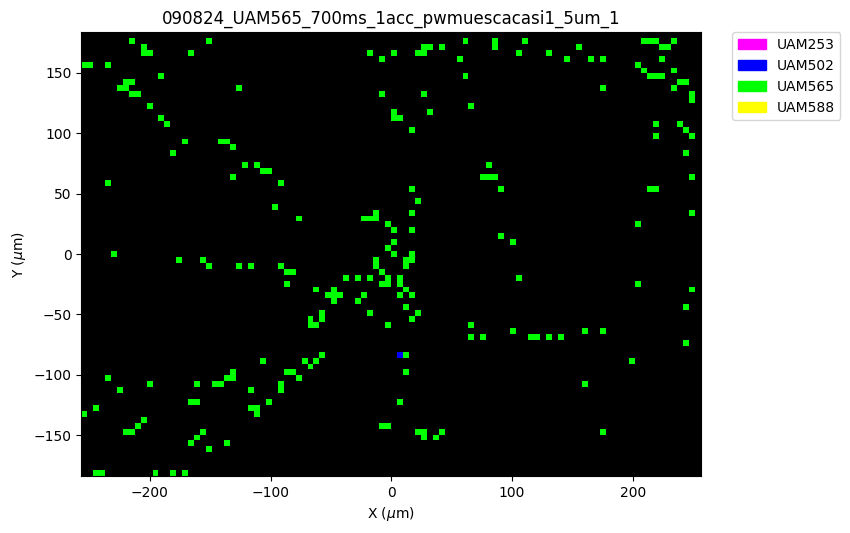

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


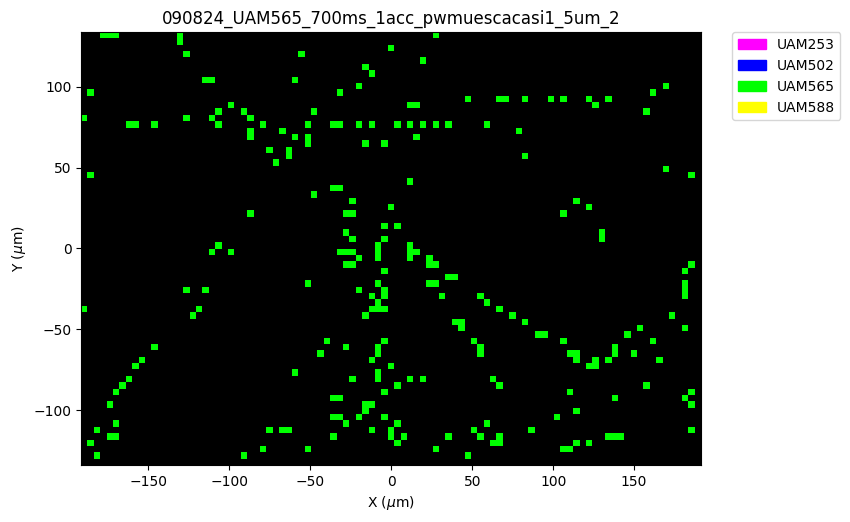

Class 0 (UAM253): 100.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


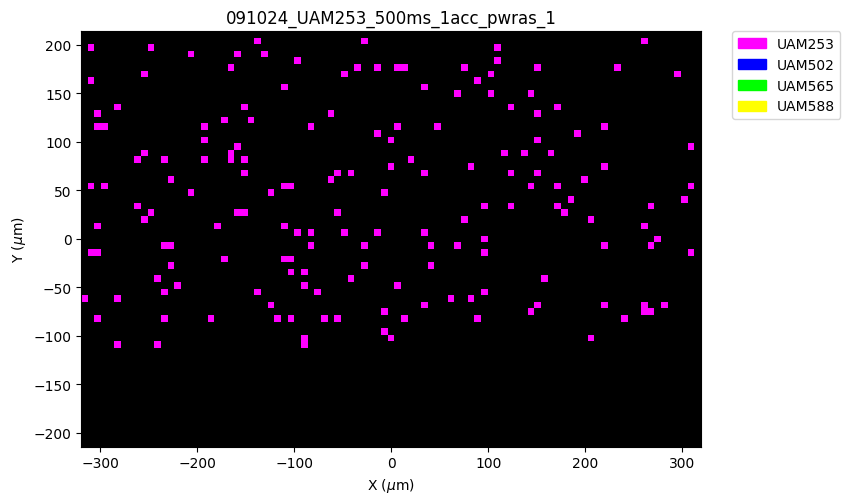

Class 0 (UAM253): 98.15%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 1.85%


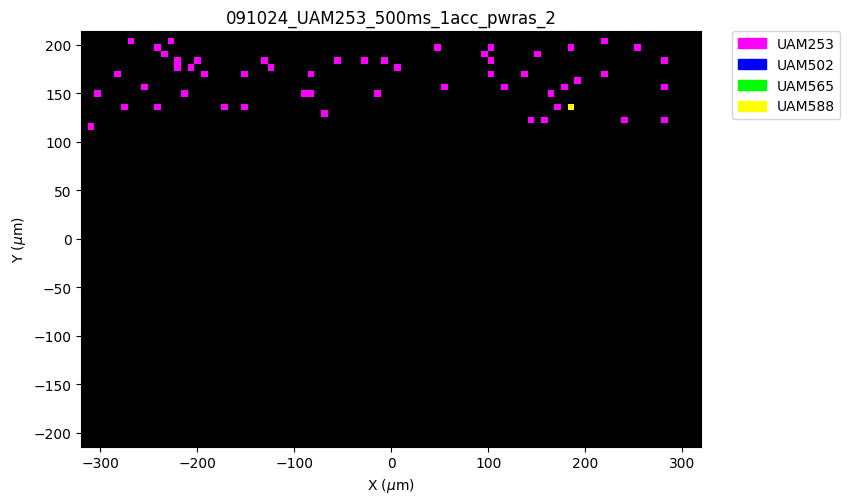

Class 0 (UAM253): 93.40%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.60%


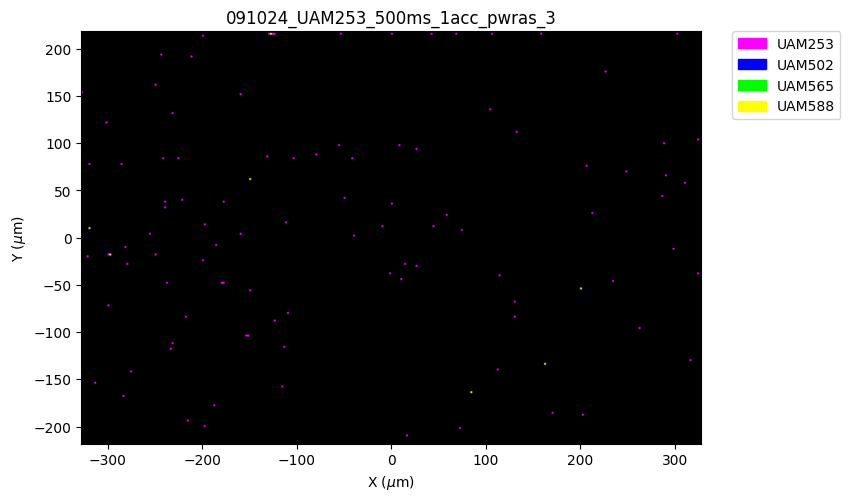

Class 0 (UAM253): 95.18%
Class 1 (UAM502): 1.20%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 3.61%


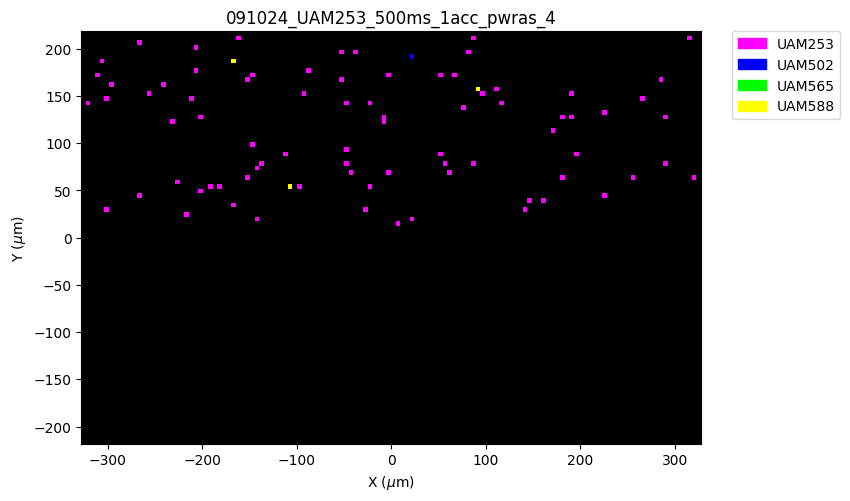

Class 0 (UAM253): 97.47%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 2.53%


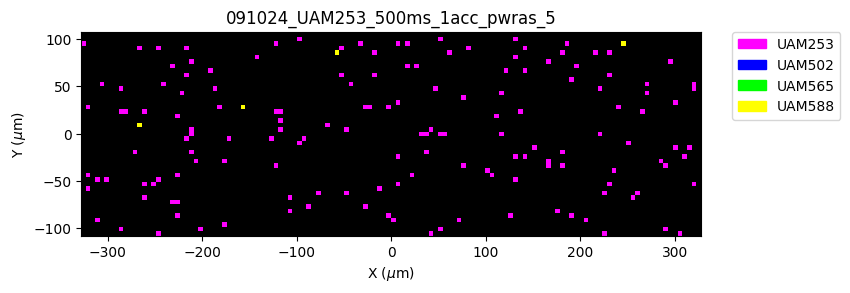

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 91.30%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 8.70%


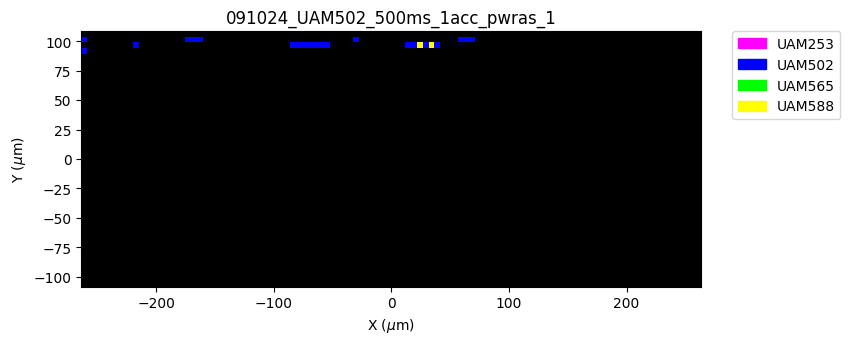

Class 0 (UAM253): 1.75%
Class 1 (UAM502): 91.23%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 7.02%


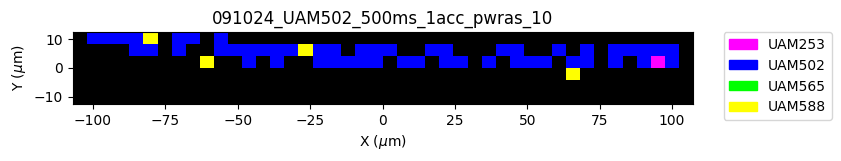

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 76.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 24.00%


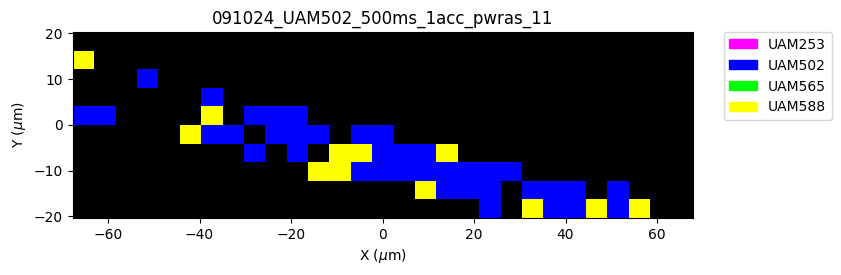

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 91.30%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 8.70%


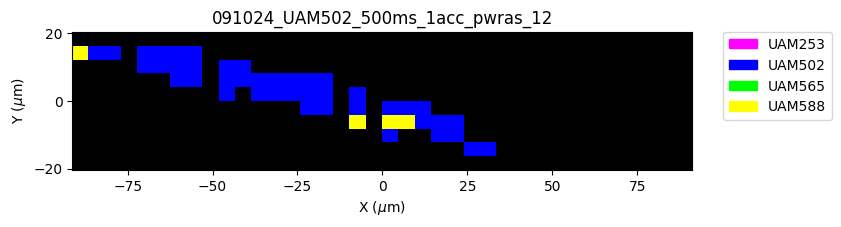

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 73.91%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 26.09%


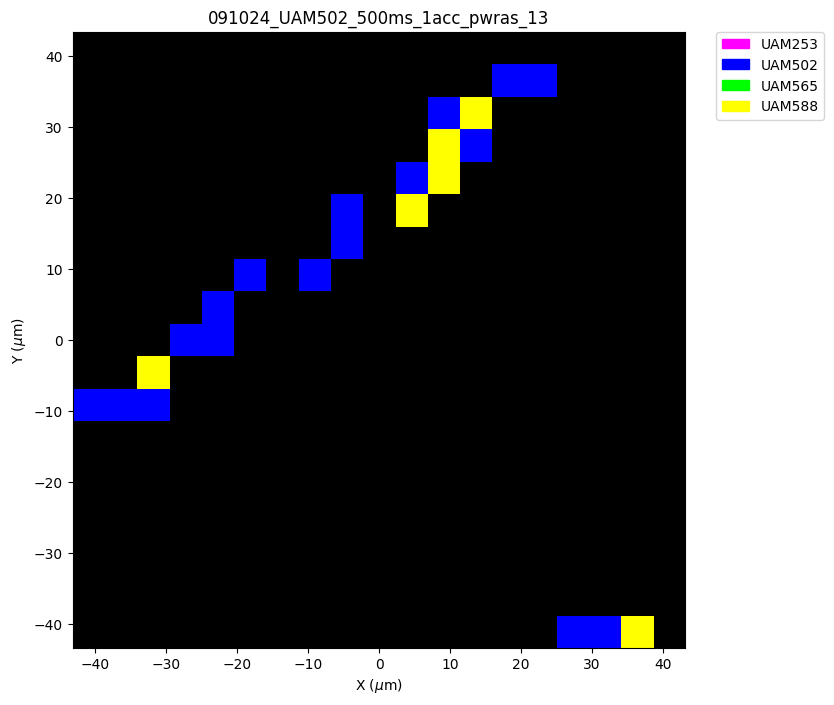

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


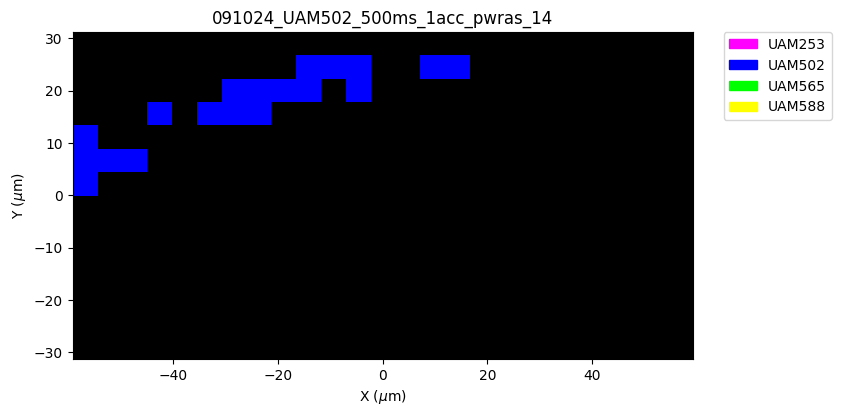

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.75%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.25%


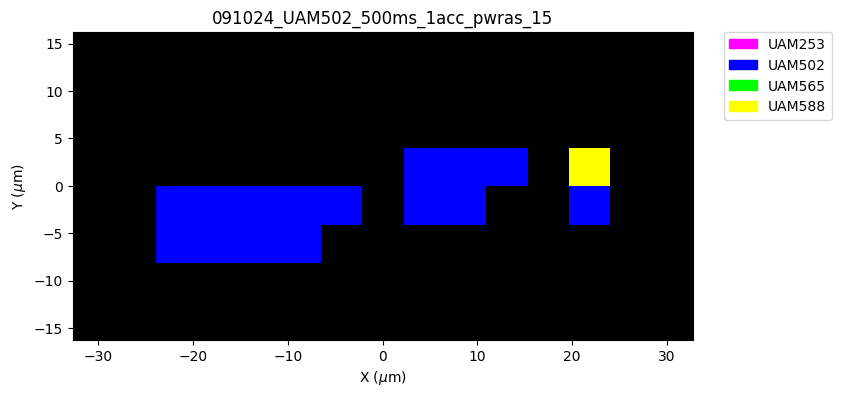

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 84.21%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 15.79%


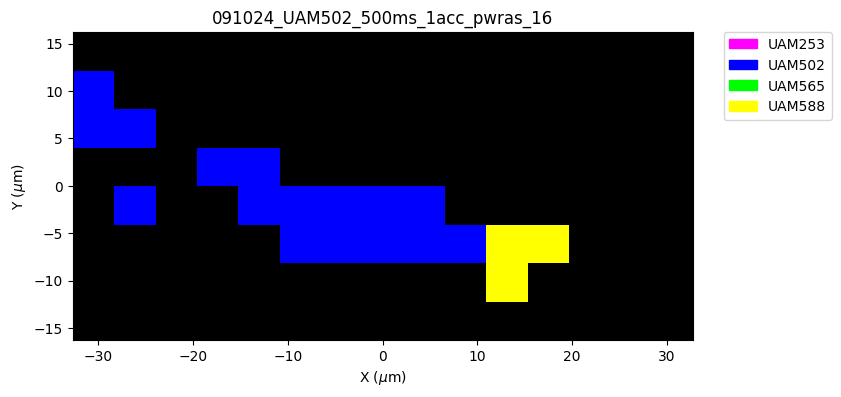

Class 0 (UAM253): 1.72%
Class 1 (UAM502): 41.38%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 56.90%


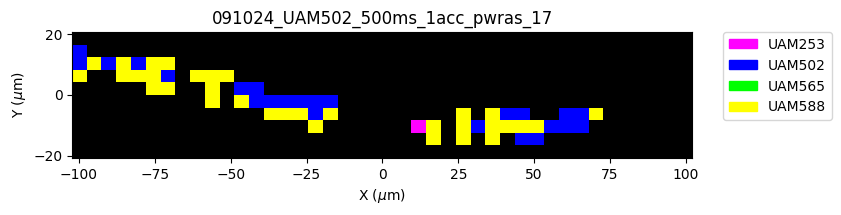

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 94.90%
Class 2 (UAM565): 2.04%
Class 3 (UAM588): 3.06%


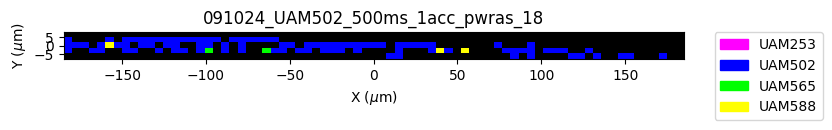

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 95.24%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 4.76%


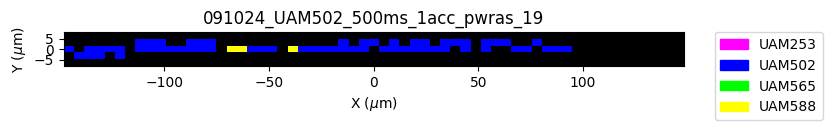

Class 0 (UAM253): 0.92%
Class 1 (UAM502): 89.91%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 9.17%


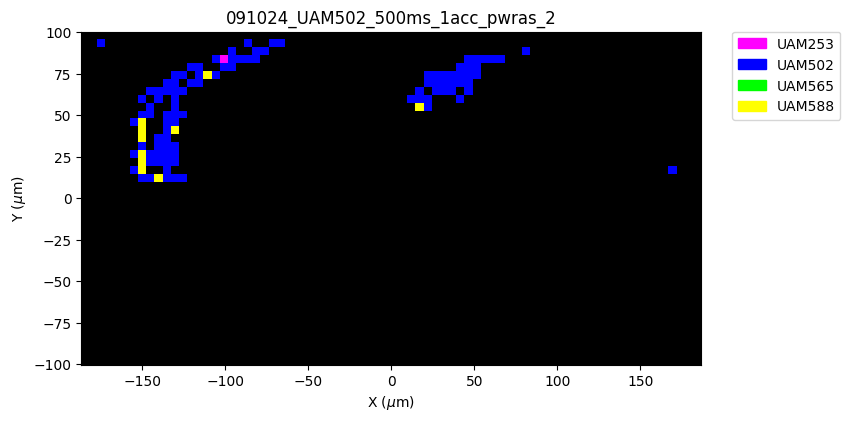

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 88.06%
Class 2 (UAM565): 2.99%
Class 3 (UAM588): 8.96%


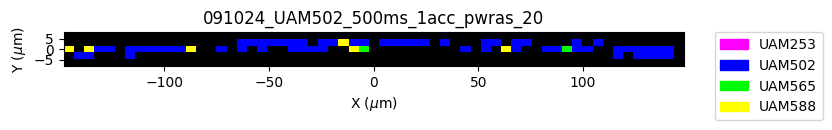

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 90.91%
Class 2 (UAM565): 9.09%
Class 3 (UAM588): 0.00%


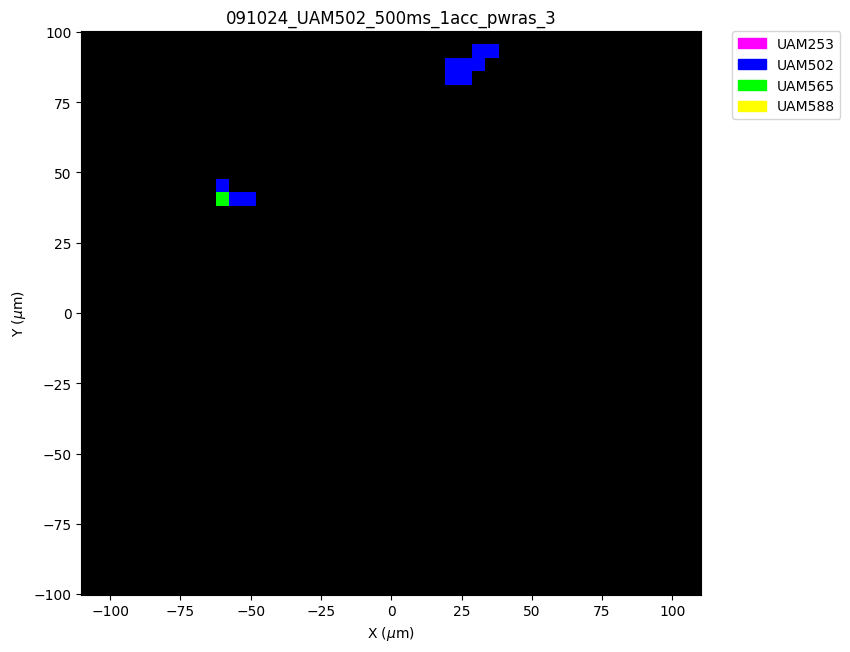

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 74.07%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 25.93%


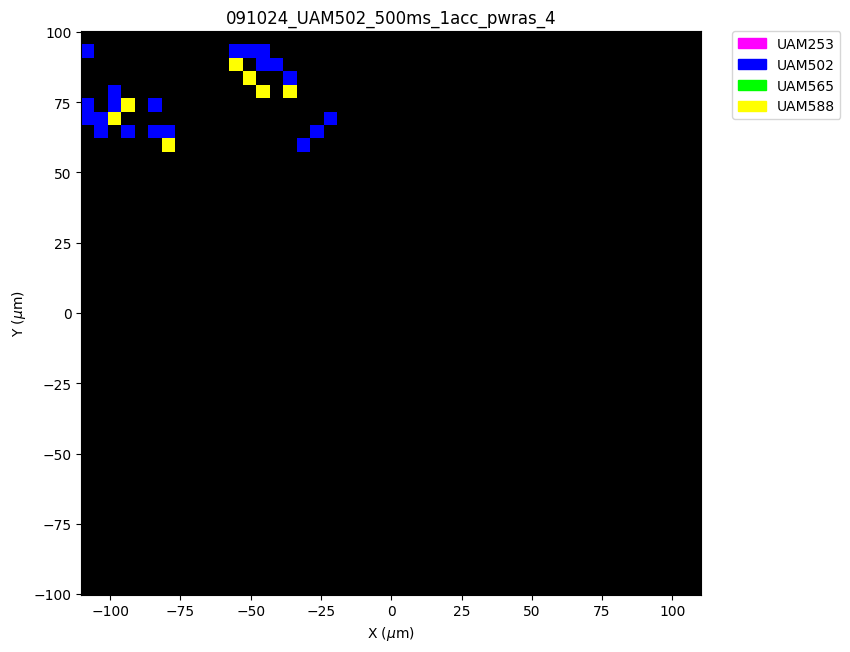

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 86.67%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 13.33%


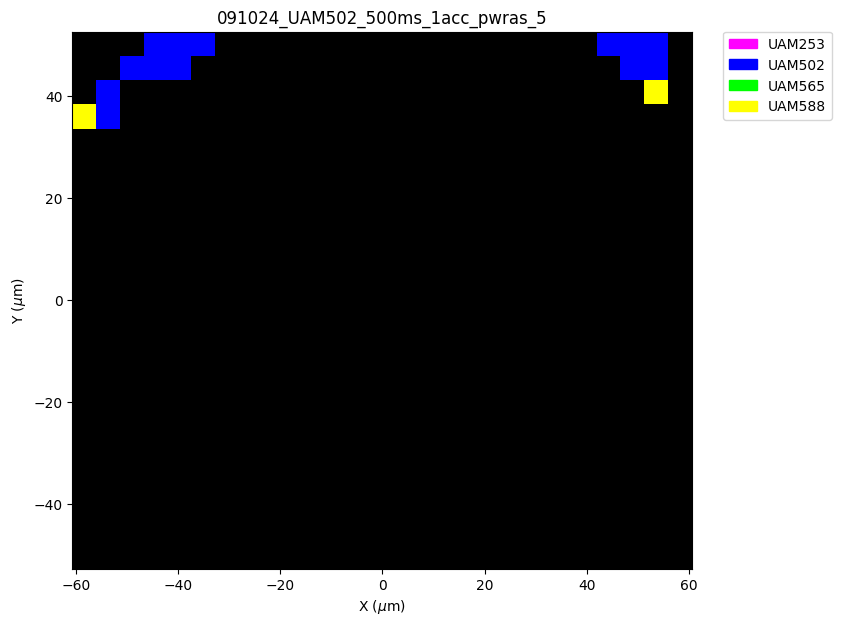

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


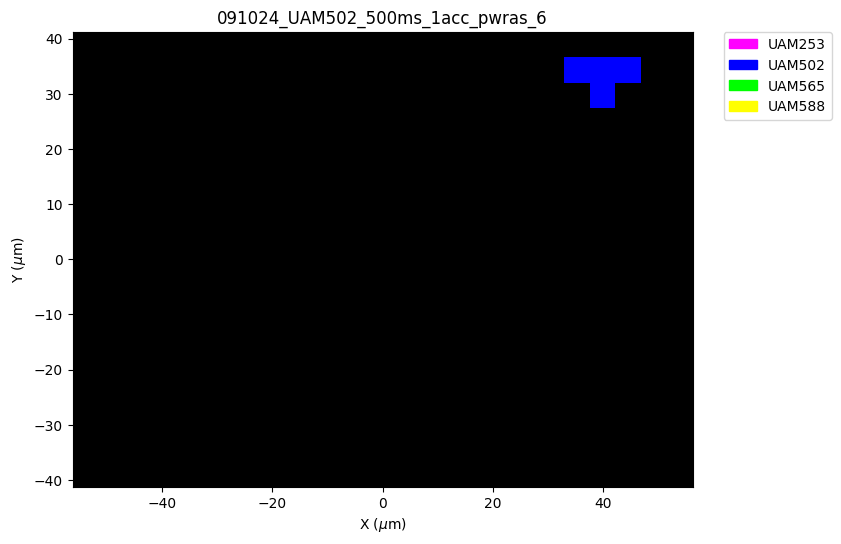

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 96.88%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 3.12%


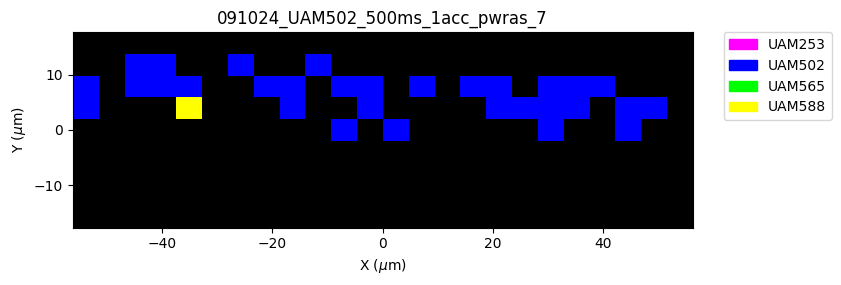

Class 0 (UAM253): 1.02%
Class 1 (UAM502): 90.82%
Class 2 (UAM565): 3.06%
Class 3 (UAM588): 5.10%


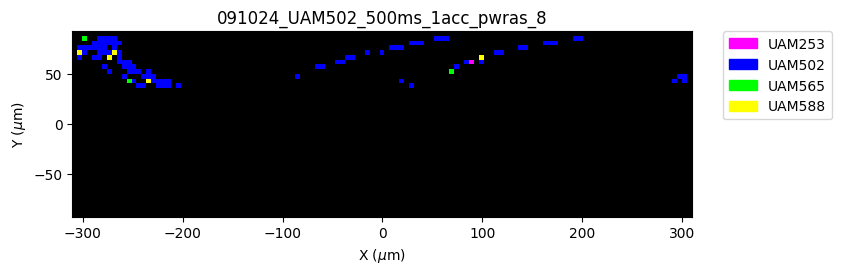

Class 0 (UAM253): 1.60%
Class 1 (UAM502): 96.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 2.40%


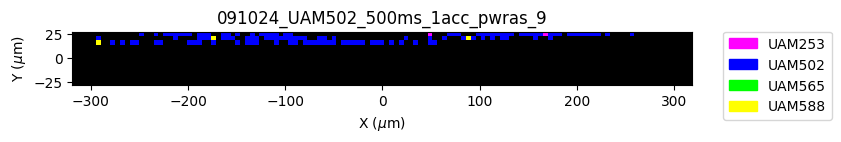

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


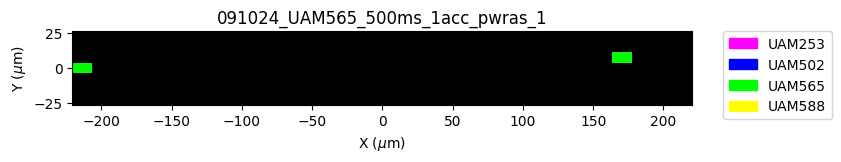

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


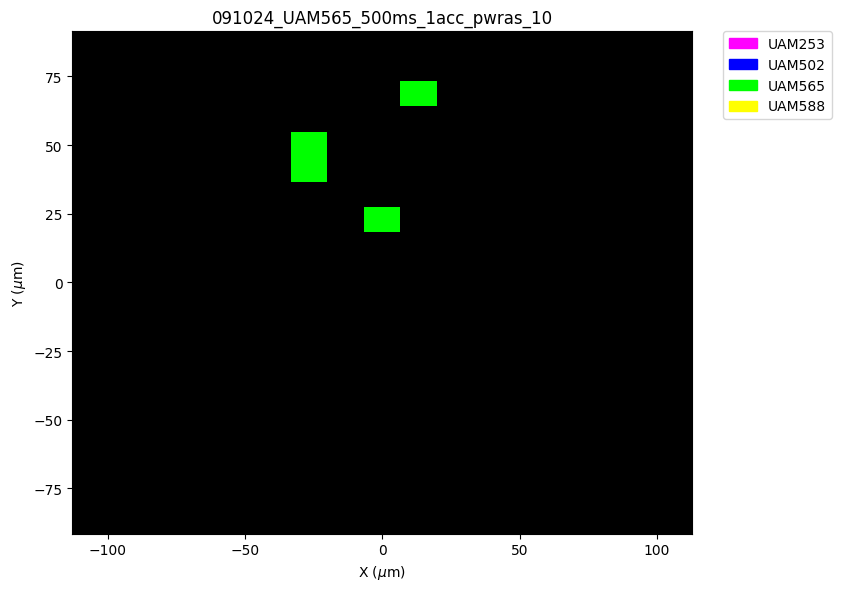

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


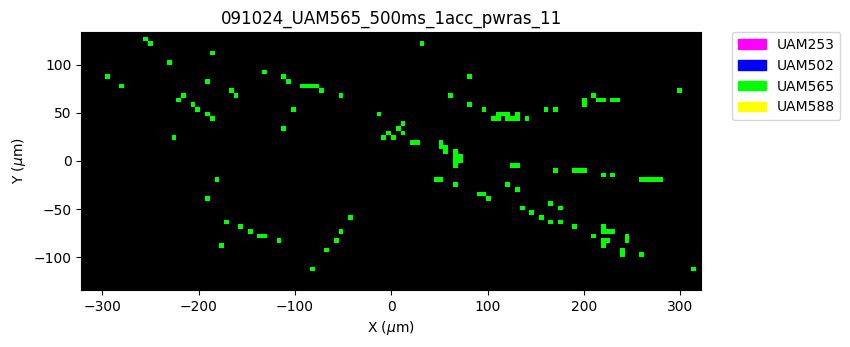

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


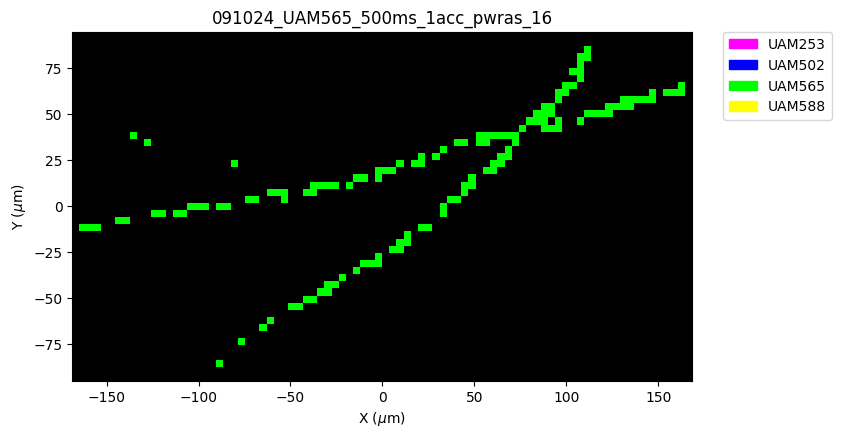

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


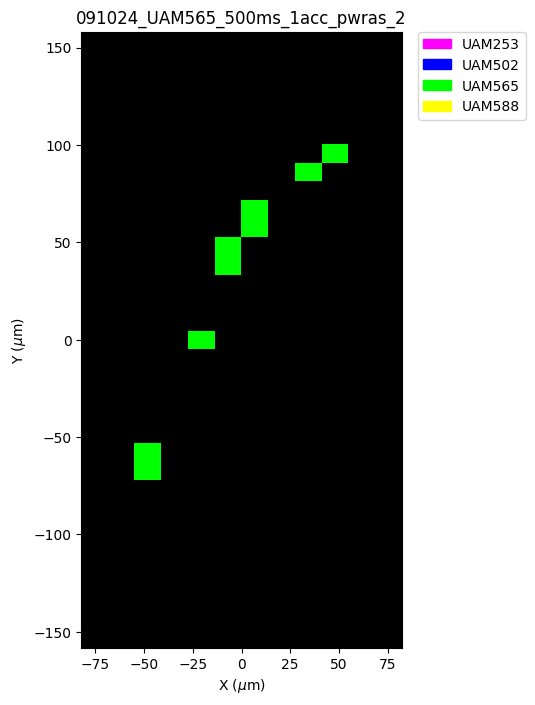

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


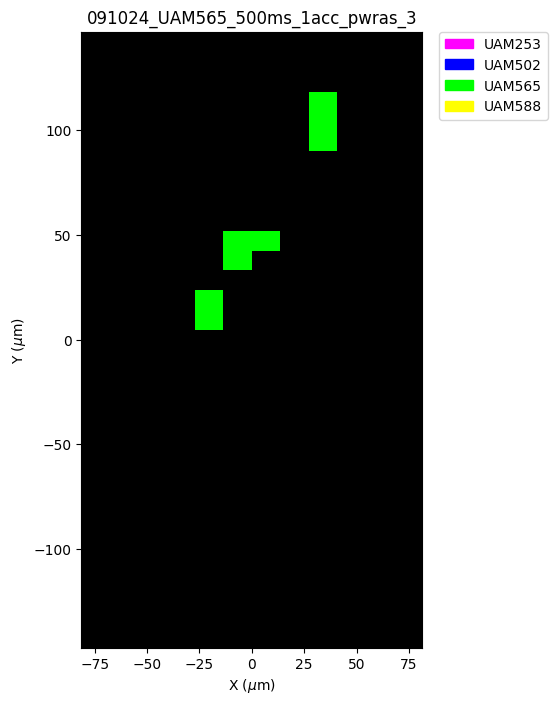

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


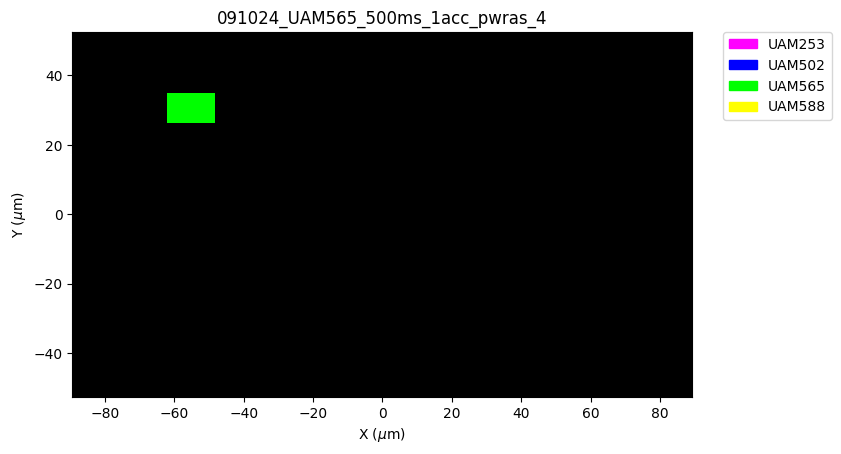

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


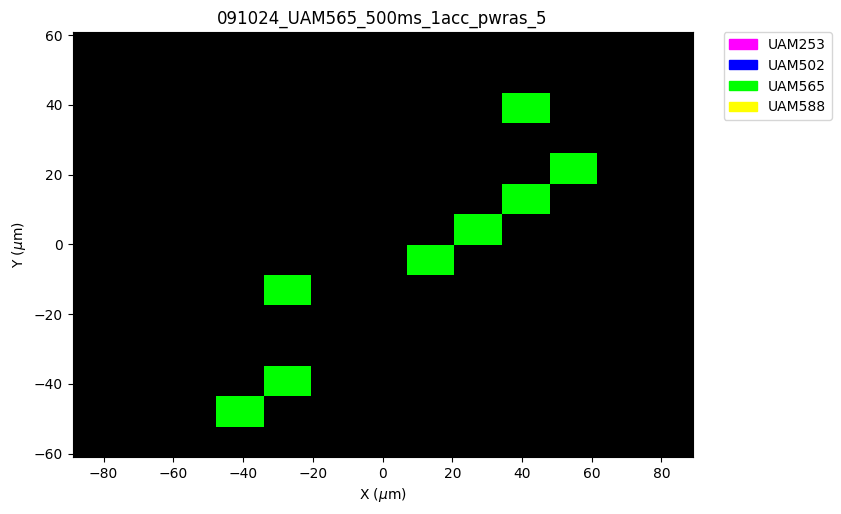

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


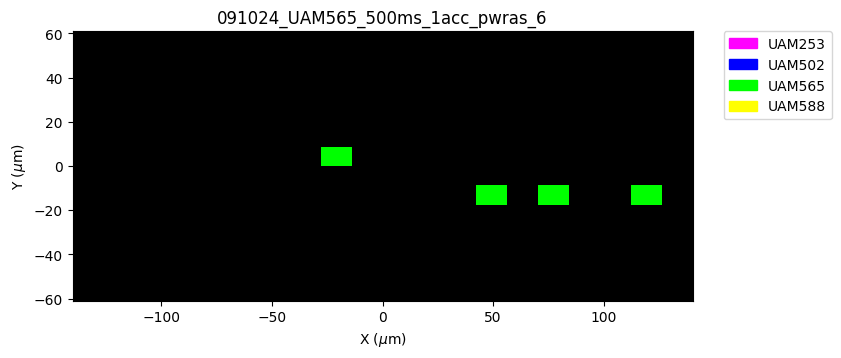

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


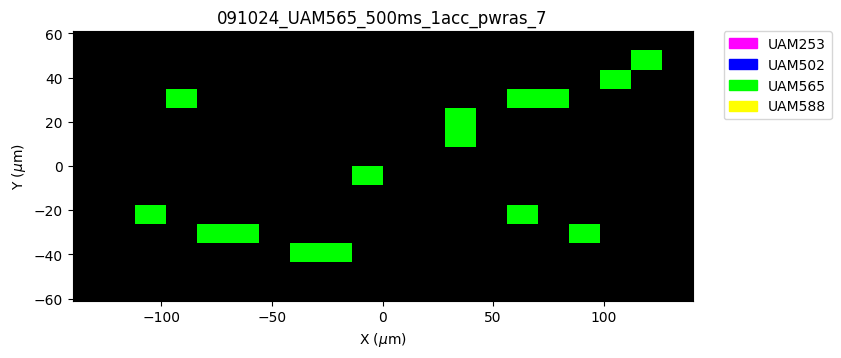

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


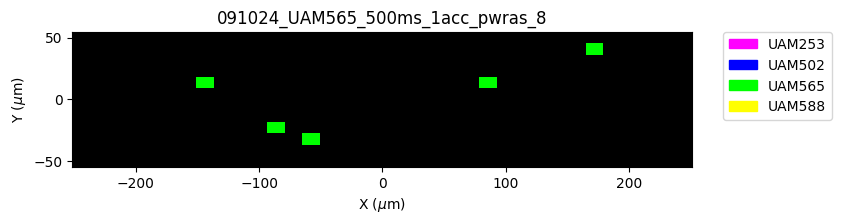

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


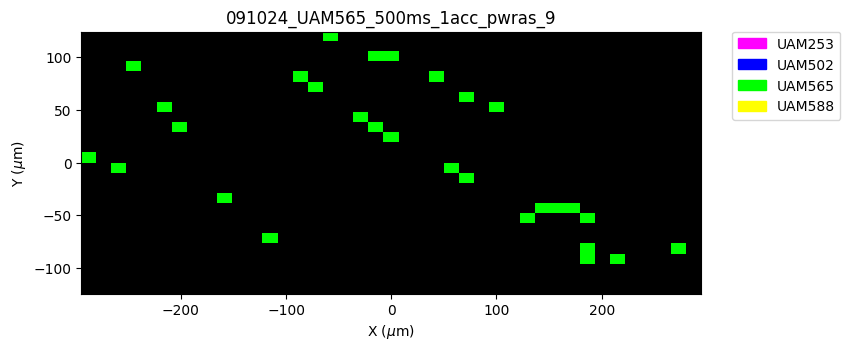

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


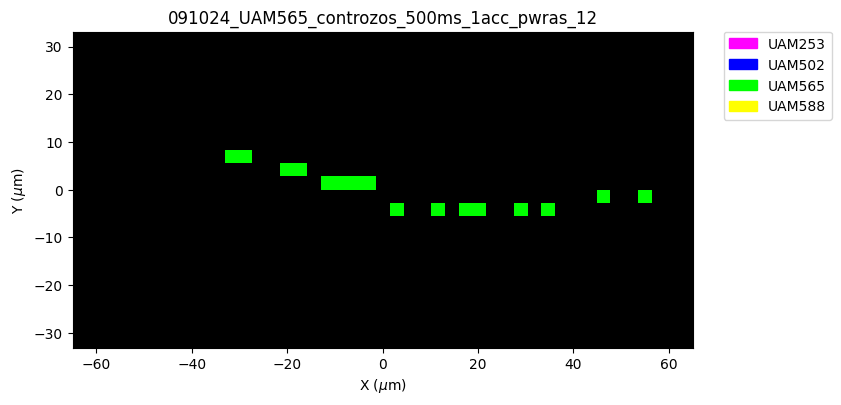

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


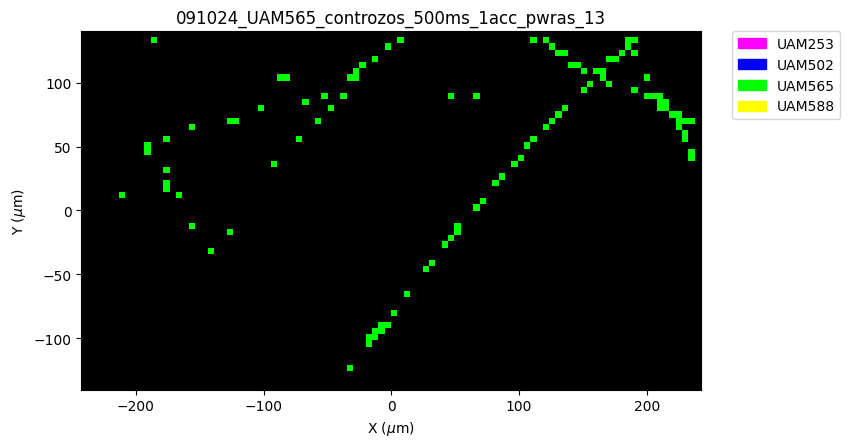

Class 0 (UAM253): 0.96%
Class 1 (UAM502): 0.96%
Class 2 (UAM565): 98.08%
Class 3 (UAM588): 0.00%


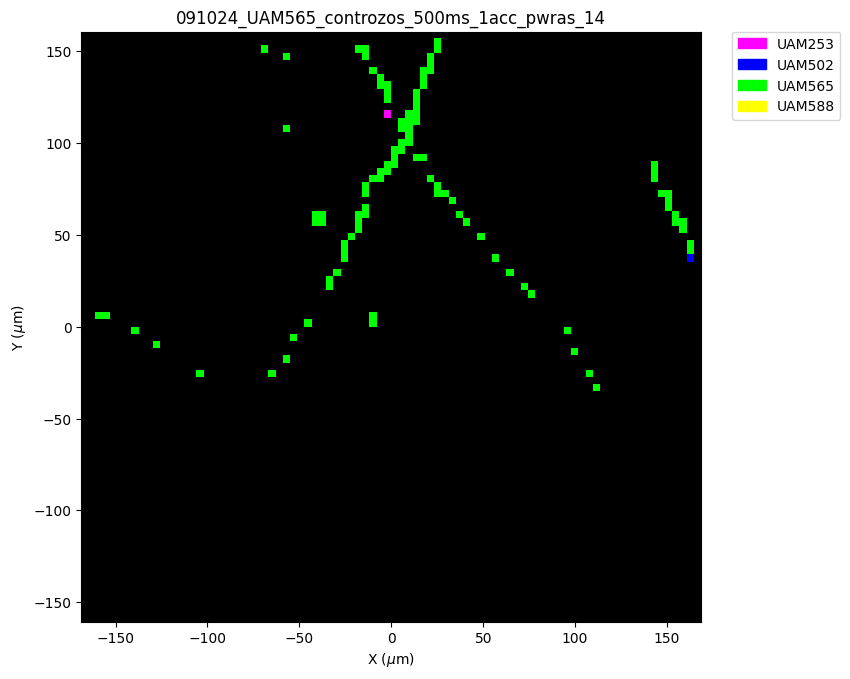

Class 0 (UAM253): 7.32%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 92.68%
Class 3 (UAM588): 0.00%


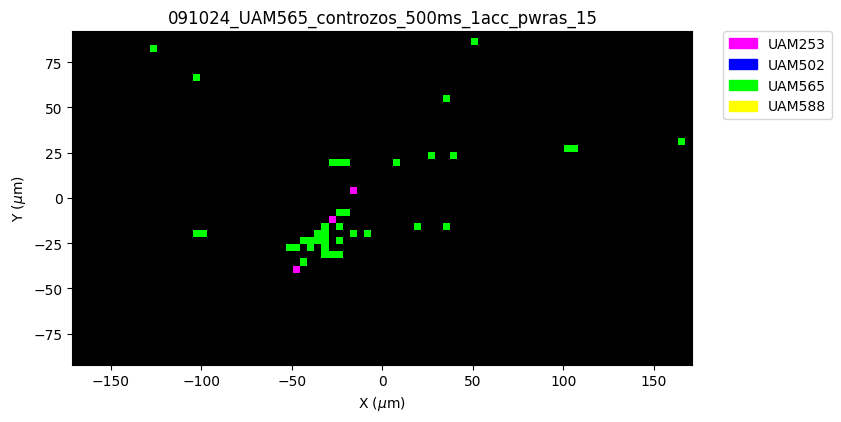

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


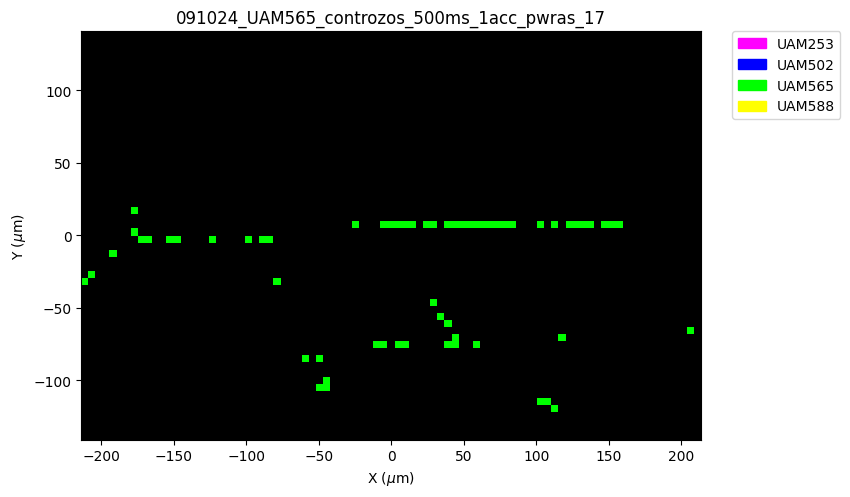

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 12.82%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 87.18%


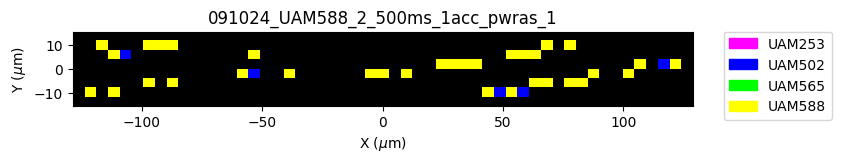

Class 0 (UAM253): 10.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 90.00%


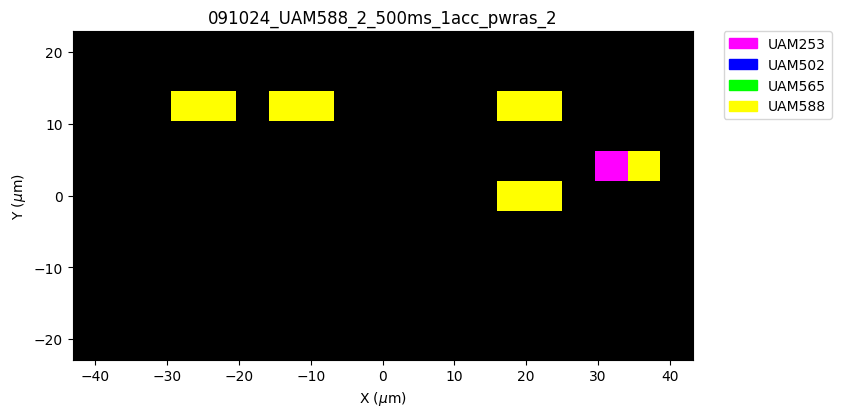

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 9.62%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 90.38%


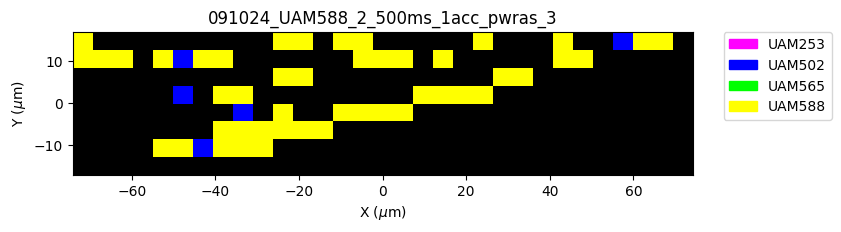

Class 0 (UAM253): 7.41%
Class 1 (UAM502): 7.41%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 85.19%


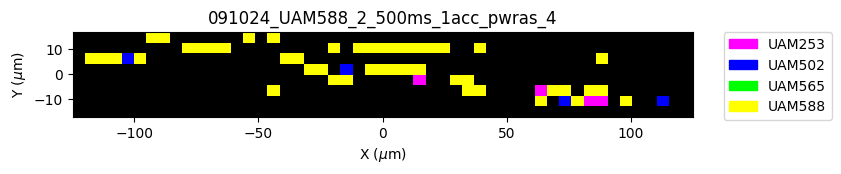

Class 0 (UAM253): 1.80%
Class 1 (UAM502): 1.80%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 96.40%


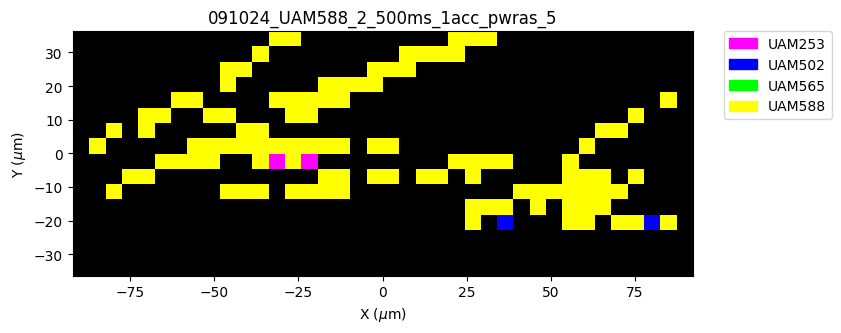

Class 0 (UAM253): 4.35%
Class 1 (UAM502): 4.35%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 91.30%


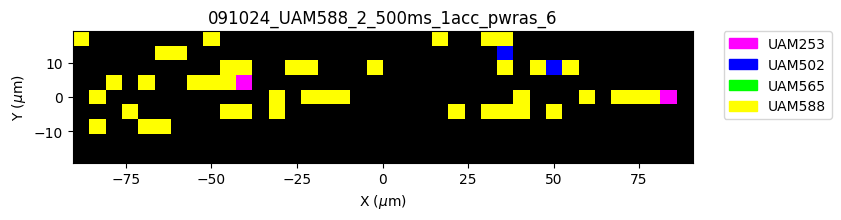

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 8.70%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 91.30%


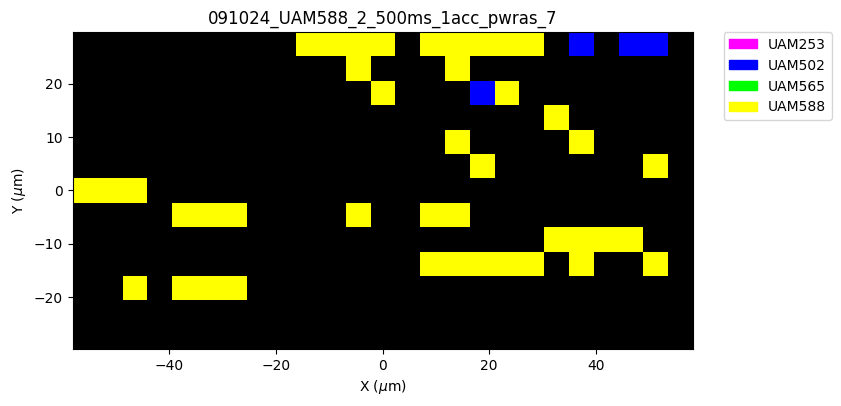

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 8.33%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 91.67%


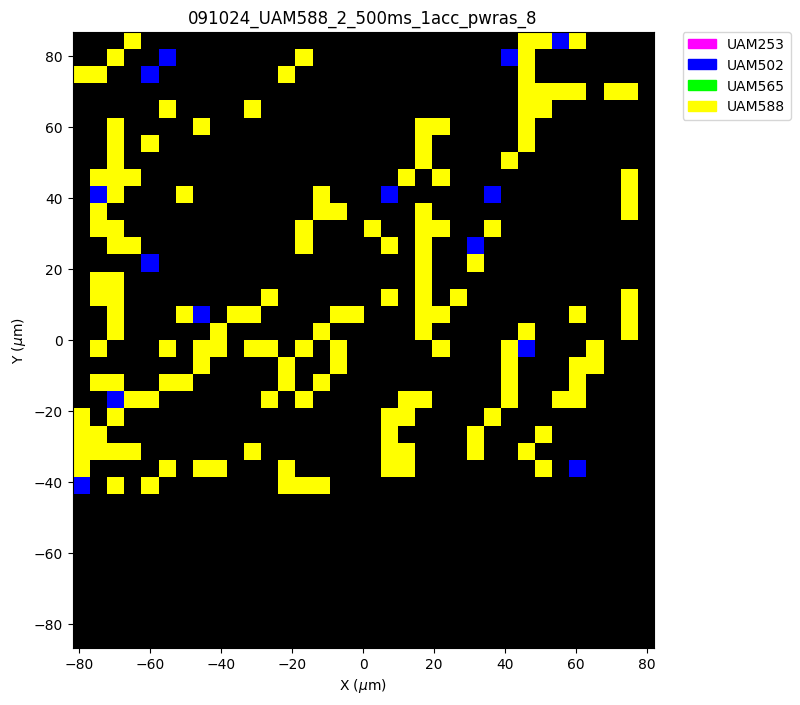

Class 0 (UAM253): 6.01%
Class 1 (UAM502): 7.69%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 86.30%


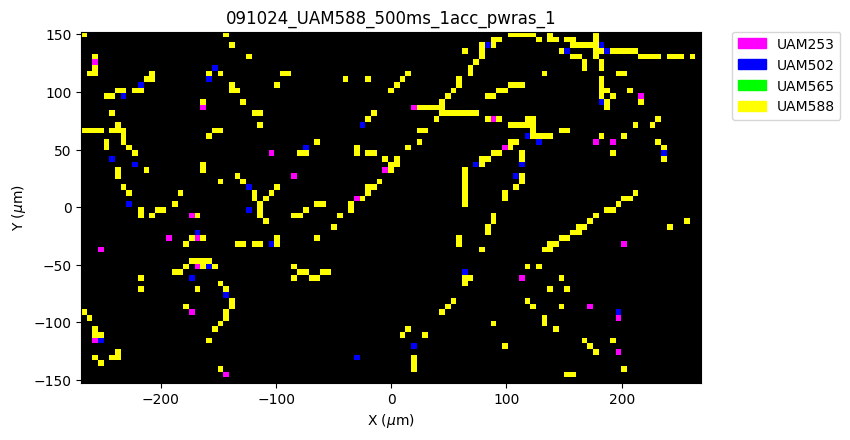

Class 0 (UAM253): 0.55%
Class 1 (UAM502): 2.21%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 97.24%


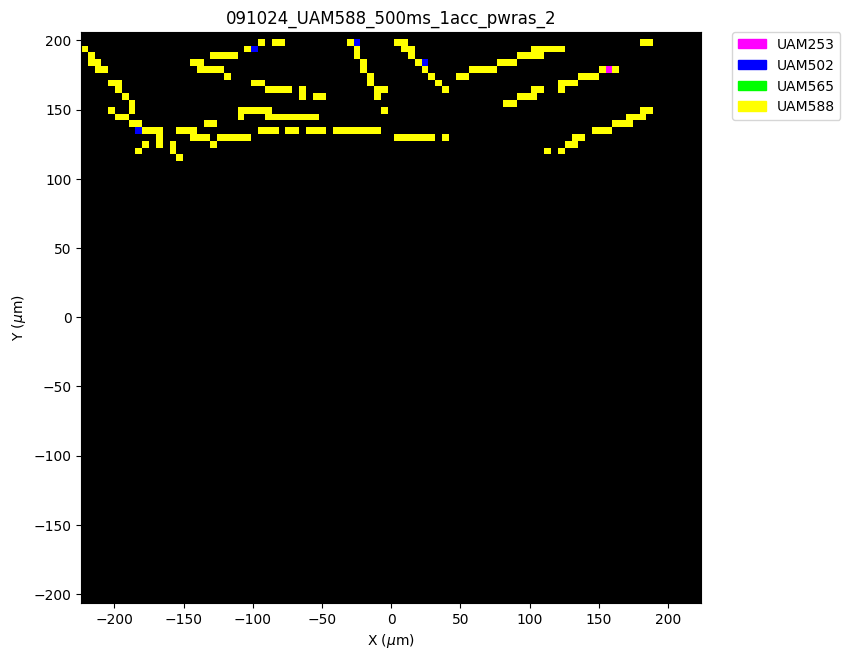

Class 0 (UAM253): 1.15%
Class 1 (UAM502): 1.72%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 97.13%


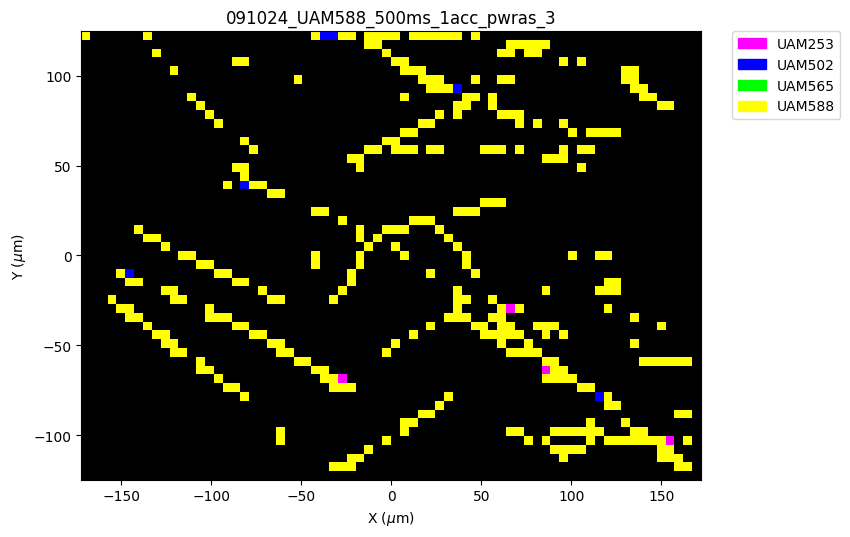

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


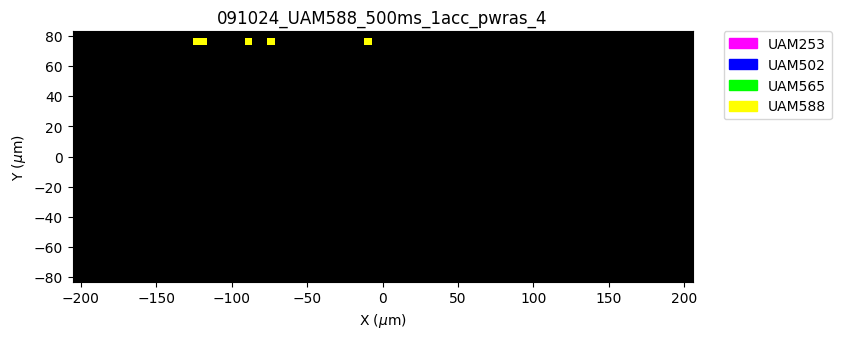

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


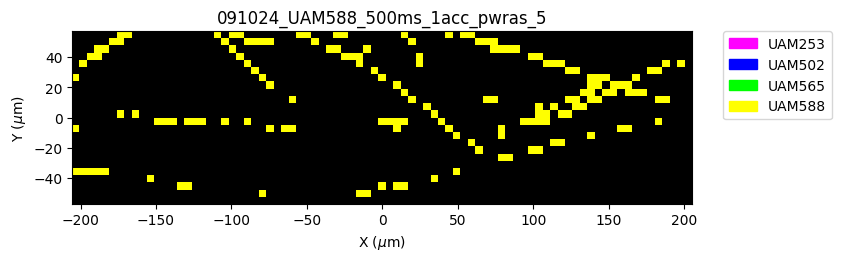

Class 0 (UAM253): 0.84%
Class 1 (UAM502): 91.64%
Class 2 (UAM565): 0.28%
Class 3 (UAM588): 7.24%


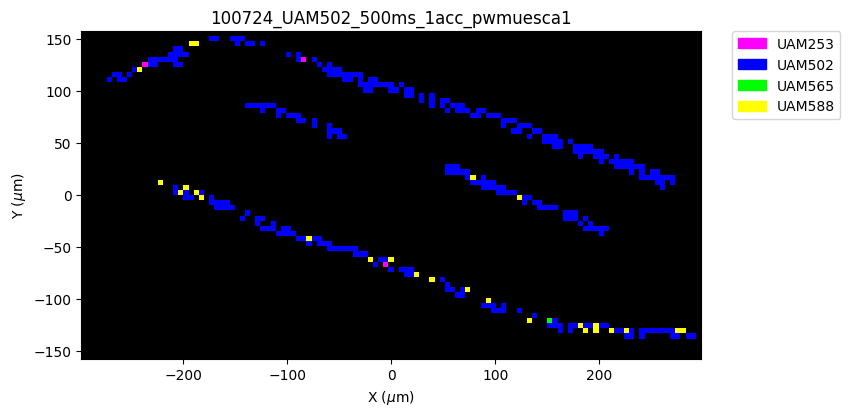

Class 0 (UAM253): 1.06%
Class 1 (UAM502): 94.68%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 4.26%


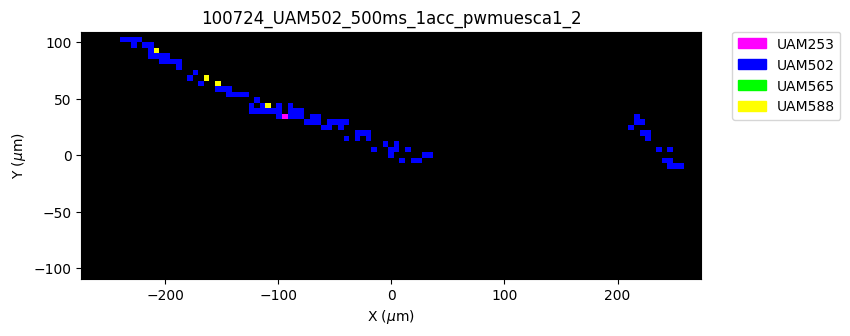

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


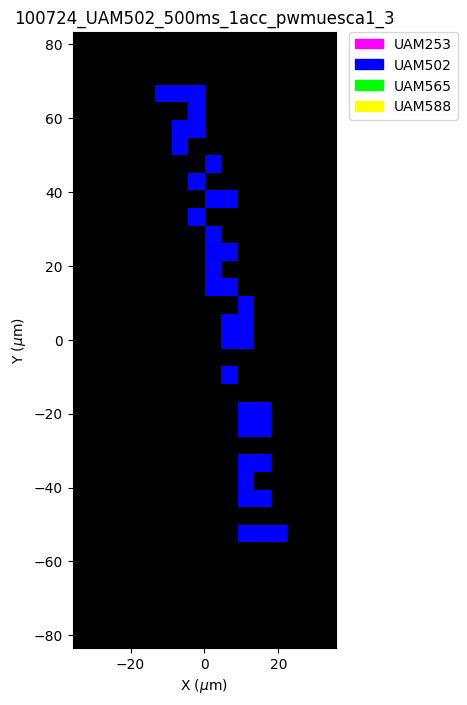

Class 0 (UAM253): 0.66%
Class 1 (UAM502): 4.10%
Class 2 (UAM565): 0.13%
Class 3 (UAM588): 95.11%


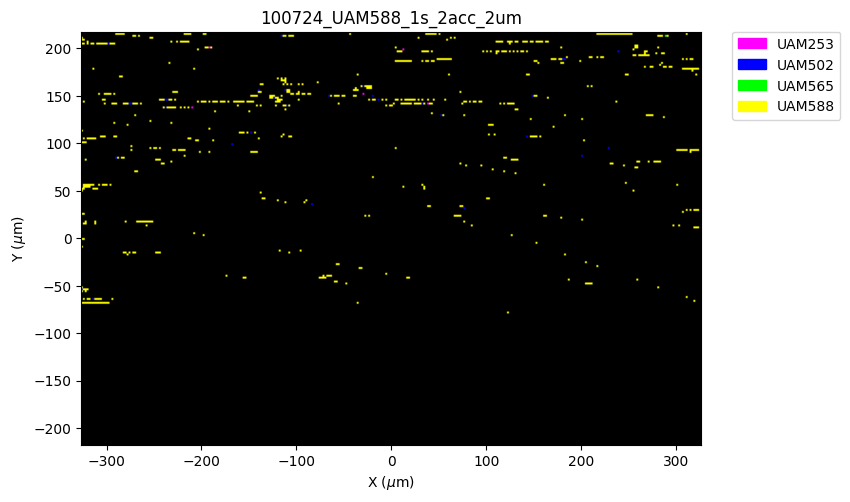

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 2.25%
Class 2 (UAM565): 97.75%
Class 3 (UAM588): 0.00%


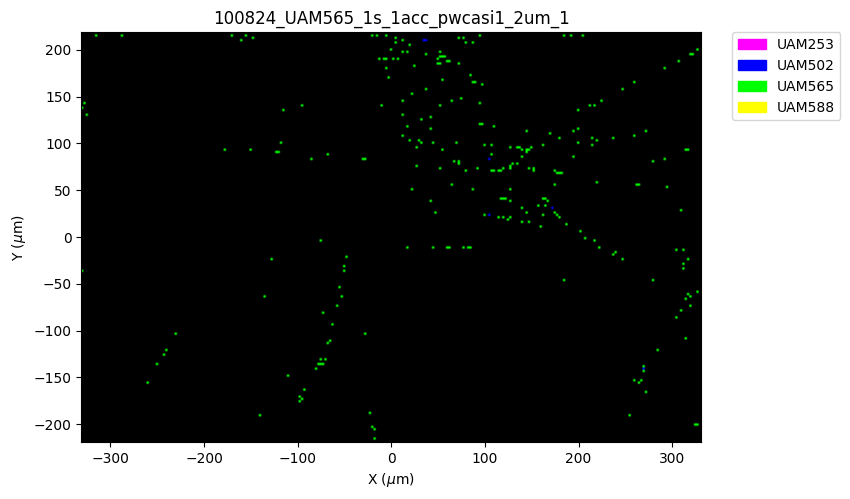

No data in infomapas for file: 110624_UAM253_1s_1acc_pwmuesca1_10um_3
Class 0 (UAM253): 96.49%
Class 1 (UAM502): 0.82%
Class 2 (UAM565): 0.70%
Class 3 (UAM588): 1.99%


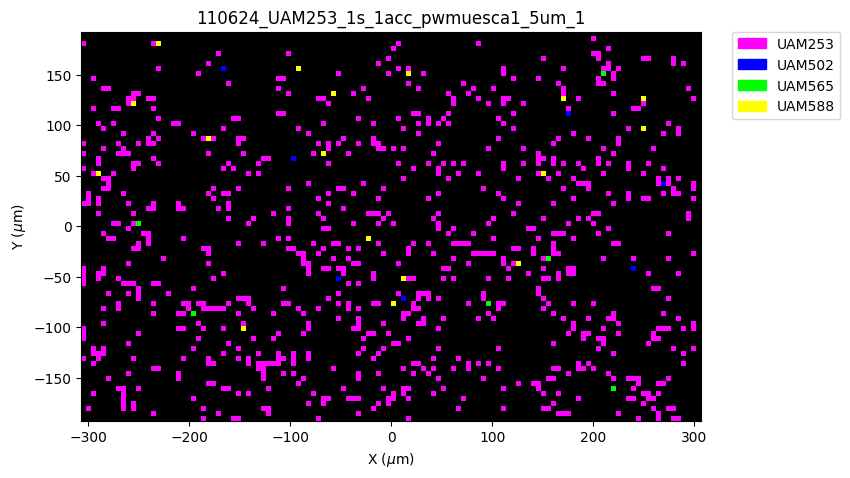

Class 0 (UAM253): 99.74%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.26%


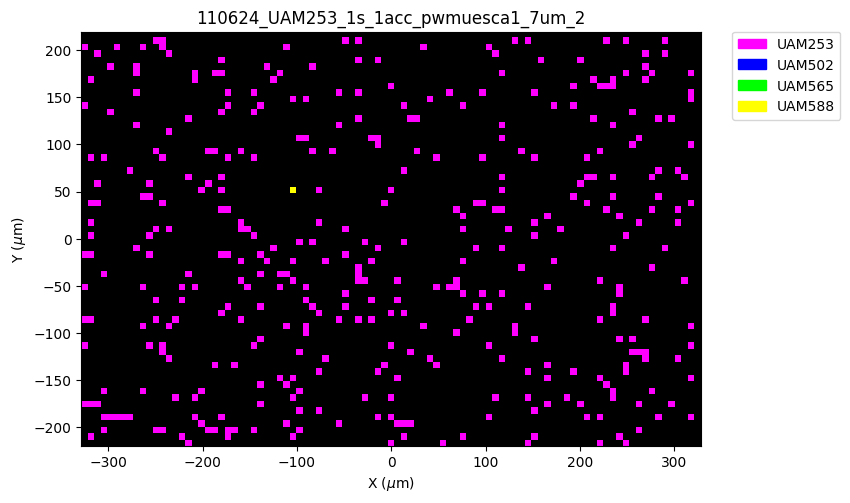

Class 0 (UAM253): 99.63%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.37%
Class 3 (UAM588): 0.00%


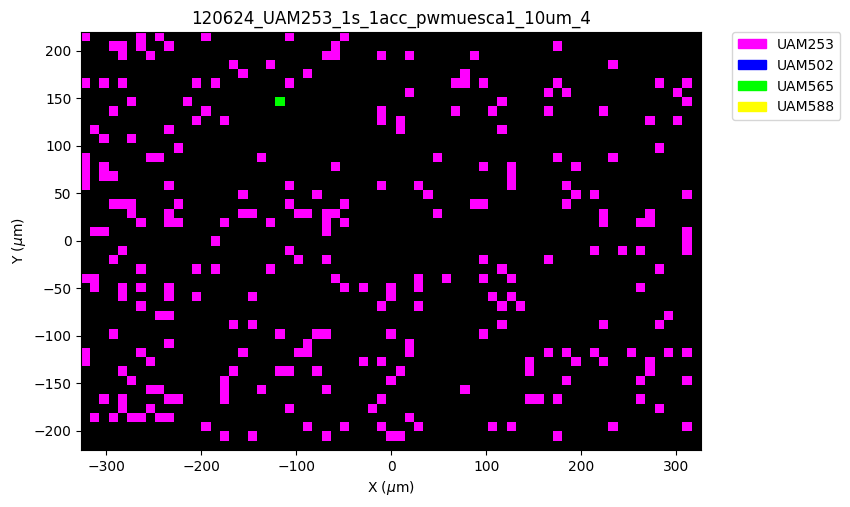

Class 0 (UAM253): 100.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


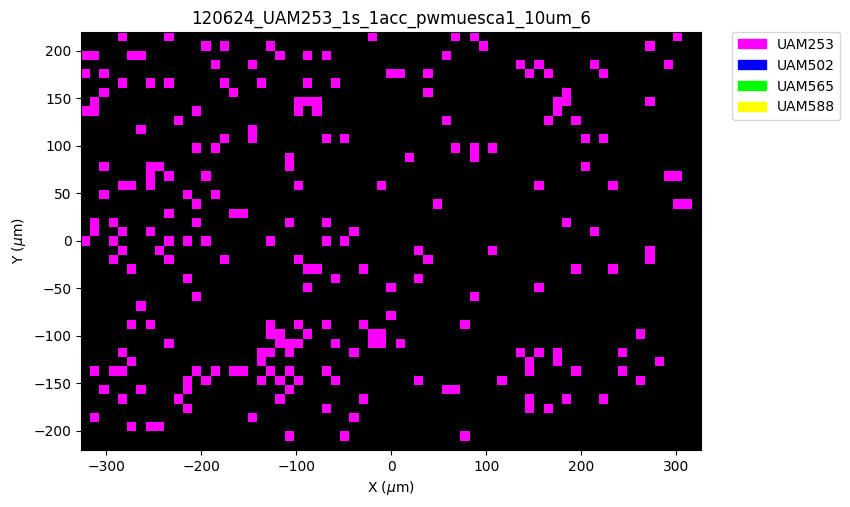

Class 0 (UAM253): 99.21%
Class 1 (UAM502): 0.16%
Class 2 (UAM565): 0.16%
Class 3 (UAM588): 0.47%


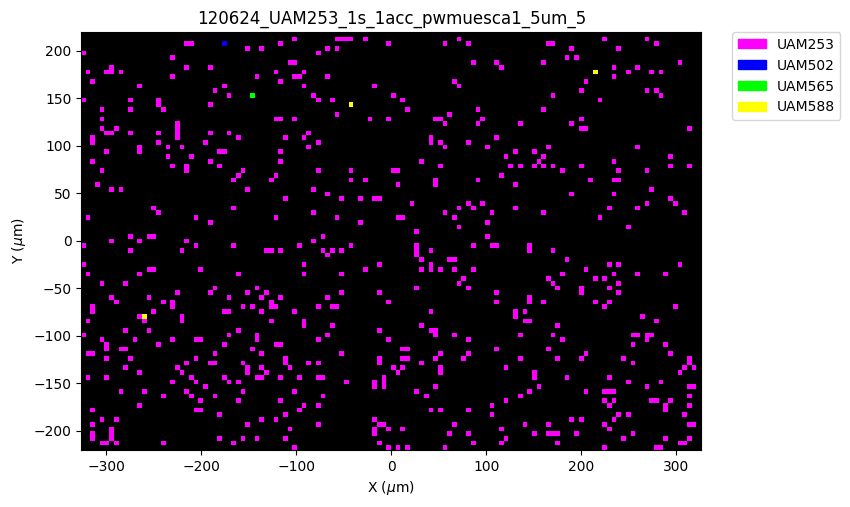

Class 0 (UAM253): 99.37%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.63%
Class 3 (UAM588): 0.00%


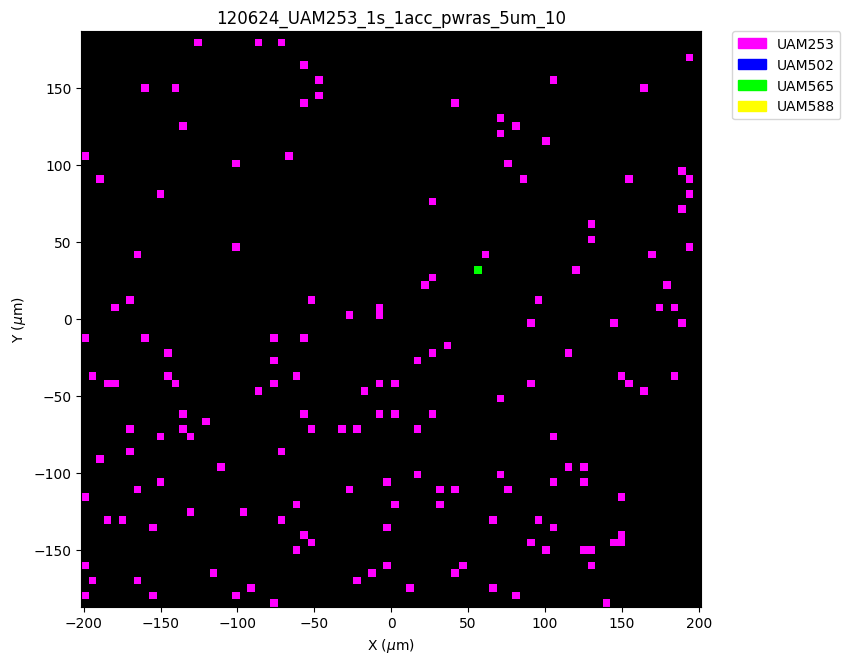

Class 0 (UAM253): 99.39%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.61%


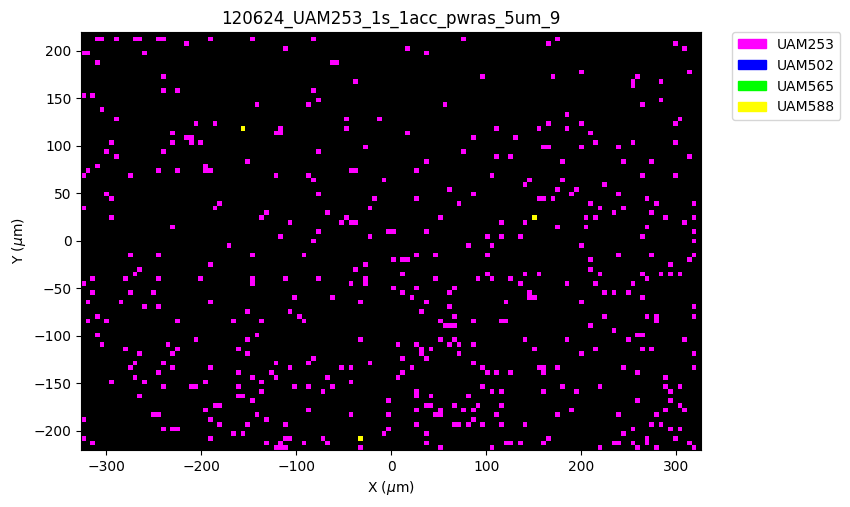

Class 0 (UAM253): 99.71%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.29%


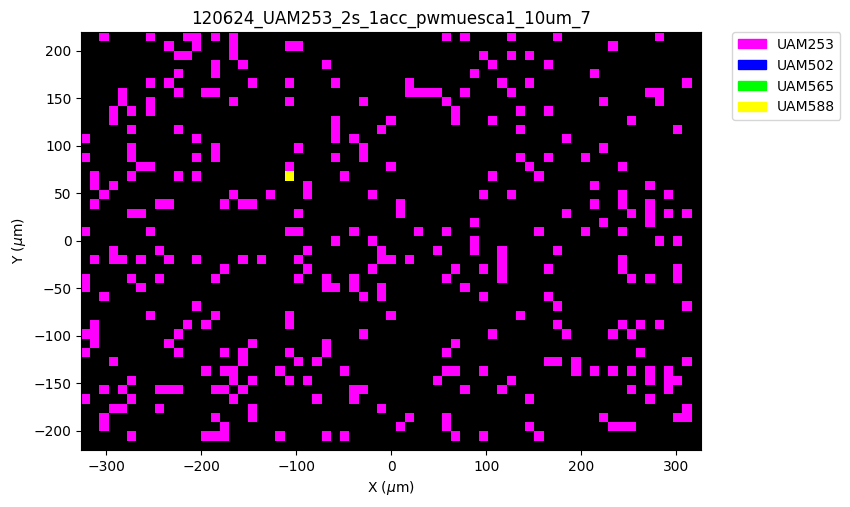

Class 0 (UAM253): 99.51%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.49%


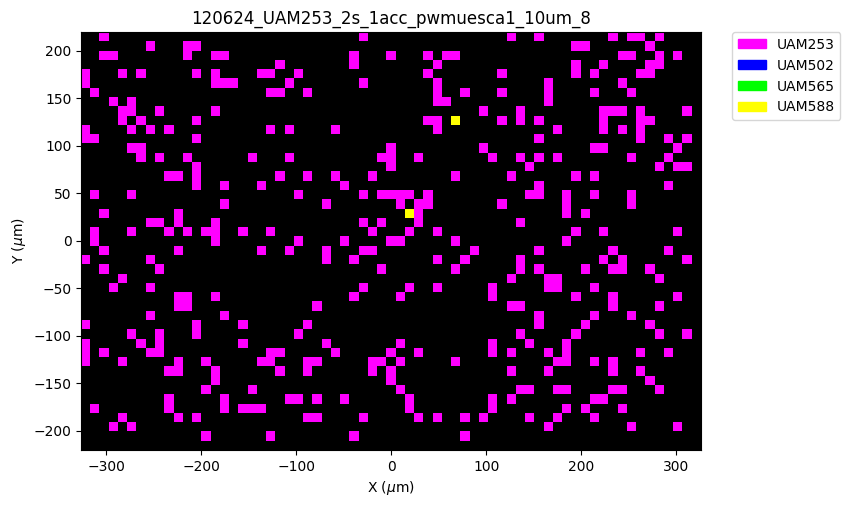

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


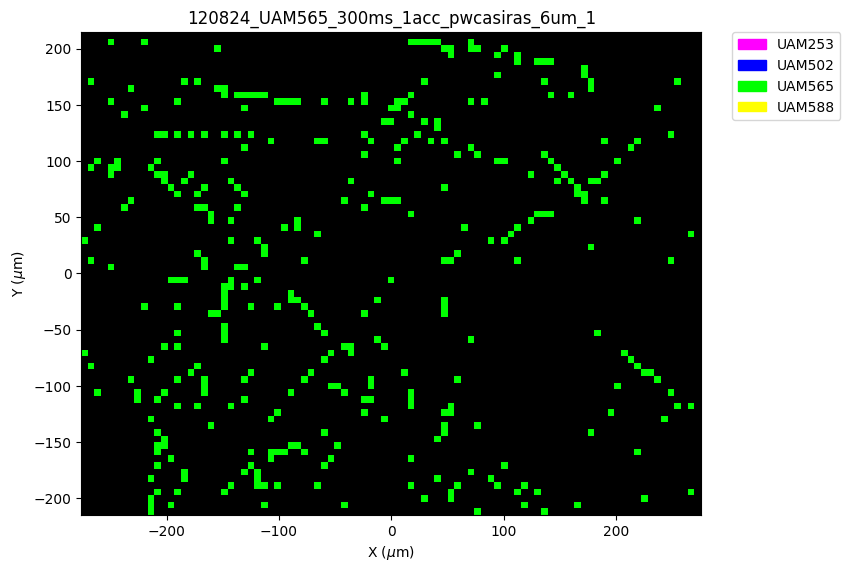

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


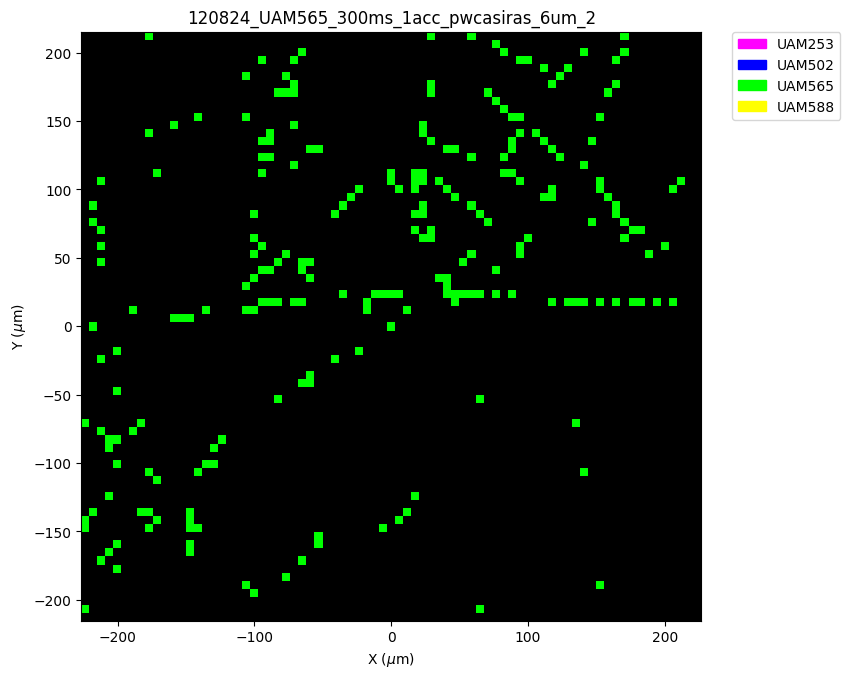

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.49%
Class 2 (UAM565): 99.51%
Class 3 (UAM588): 0.00%


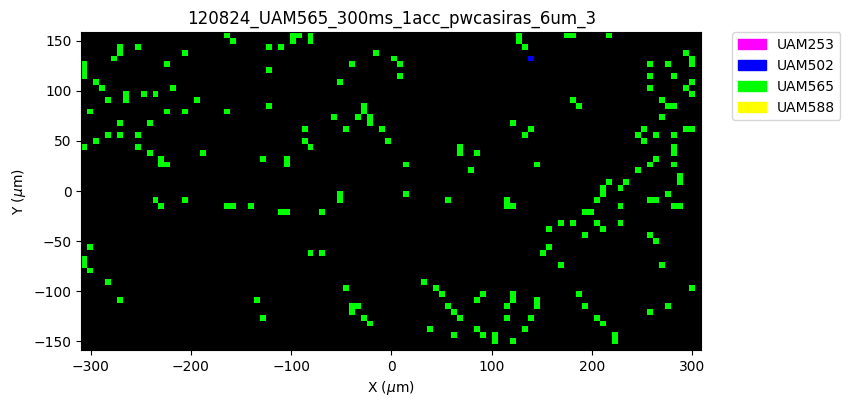

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


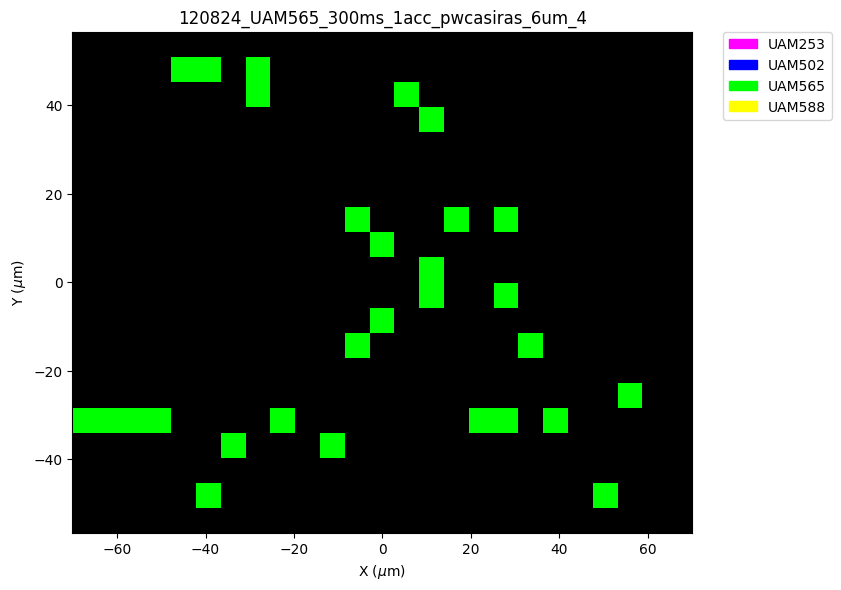

Class 0 (UAM253): 0.74%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 99.26%
Class 3 (UAM588): 0.00%


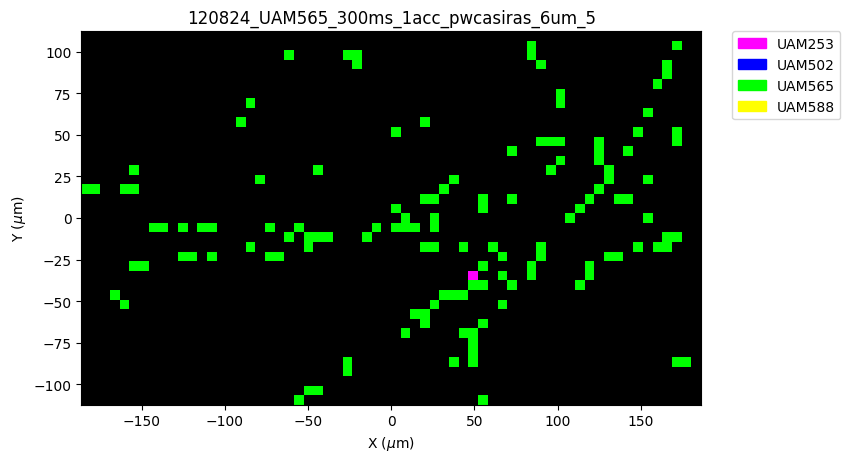

Class 0 (UAM253): 2.34%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 97.66%
Class 3 (UAM588): 0.00%


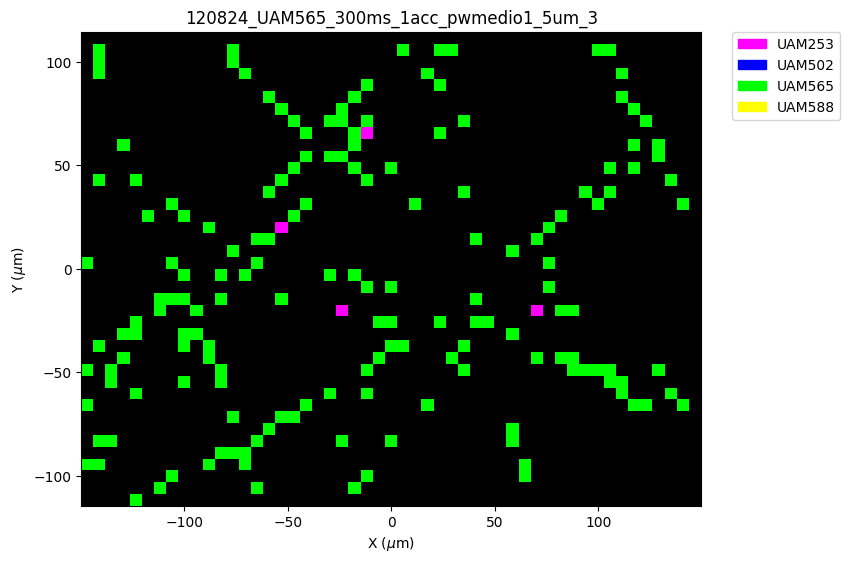

Class 0 (UAM253): 1.59%
Class 1 (UAM502): 0.80%
Class 2 (UAM565): 96.81%
Class 3 (UAM588): 0.80%


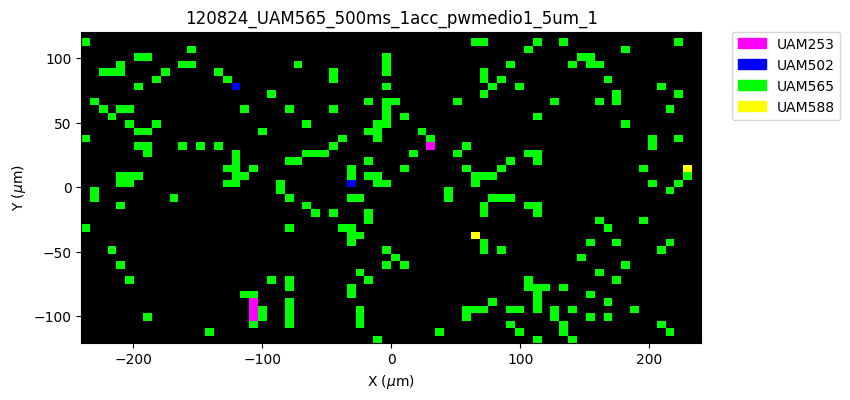

Class 0 (UAM253): 0.37%
Class 1 (UAM502): 0.37%
Class 2 (UAM565): 99.26%
Class 3 (UAM588): 0.00%


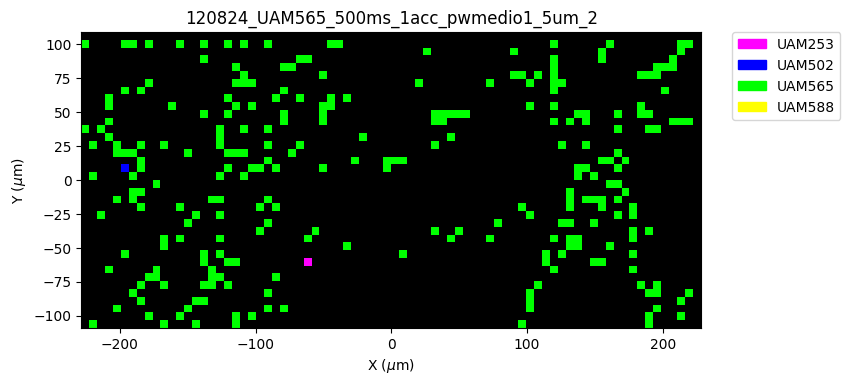

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 99.14%
Class 3 (UAM588): 0.86%


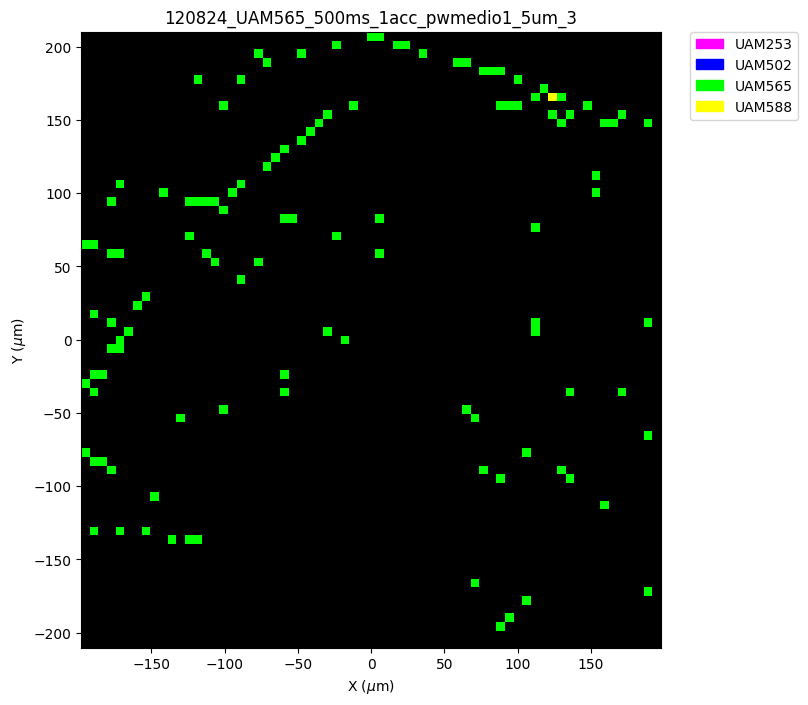

Class 0 (UAM253): 5.71%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 92.86%
Class 3 (UAM588): 1.43%


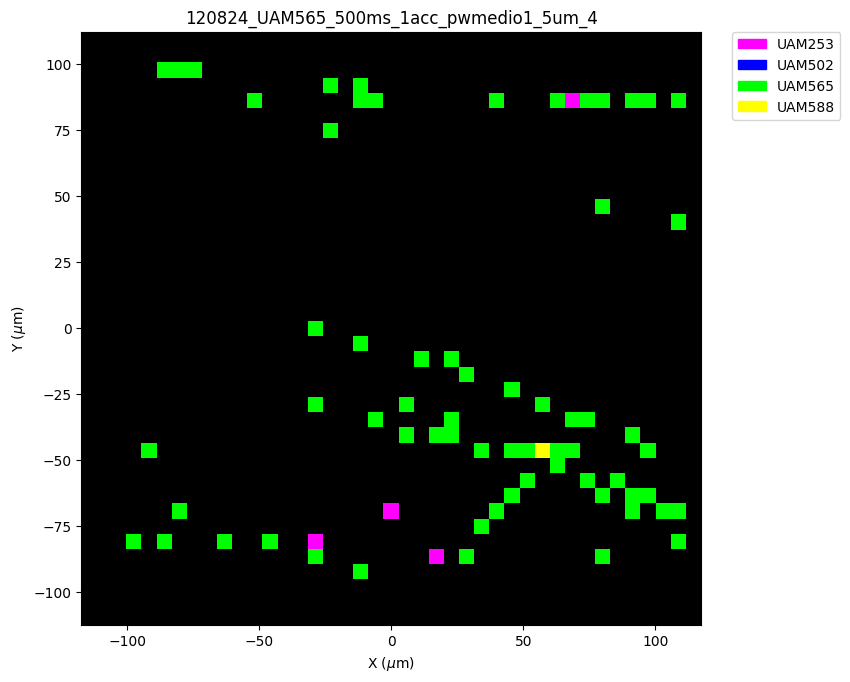

Class 0 (UAM253): 3.67%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 95.41%
Class 3 (UAM588): 0.92%


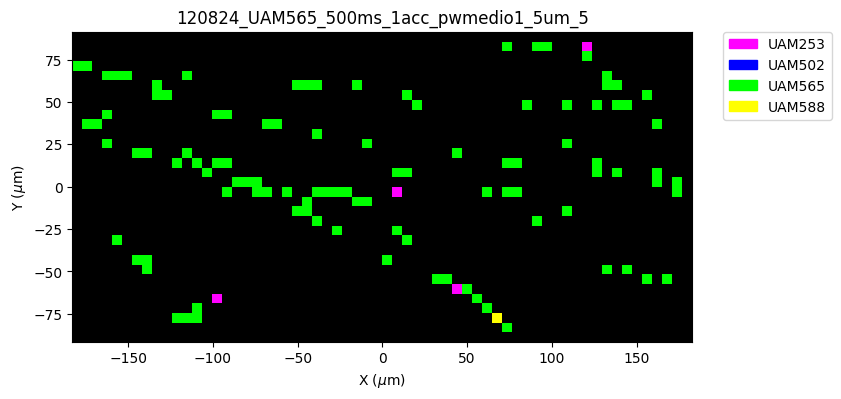

Class 0 (UAM253): 1.52%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 98.48%
Class 3 (UAM588): 0.00%


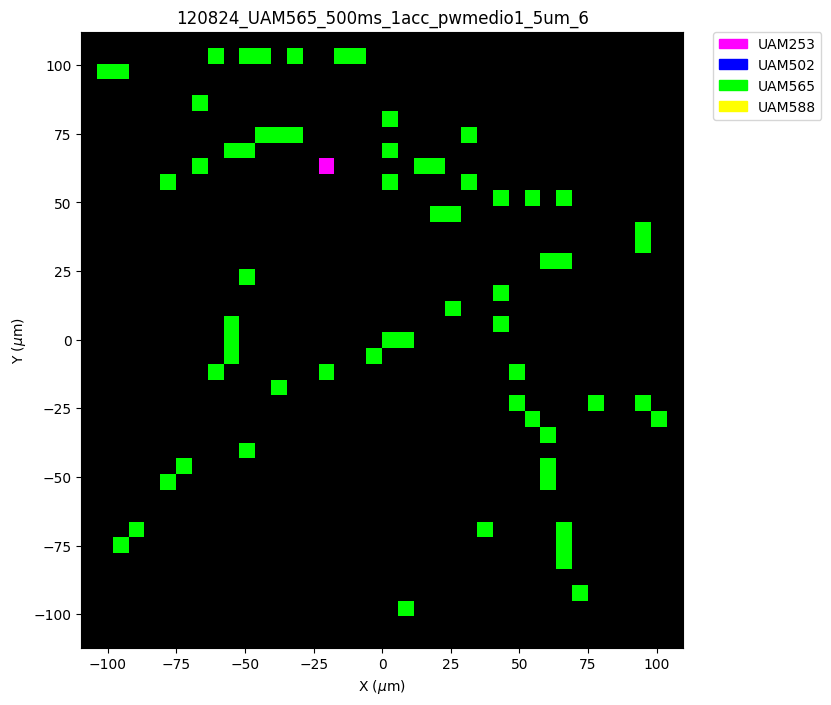

Class 0 (UAM253): 99.04%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.96%


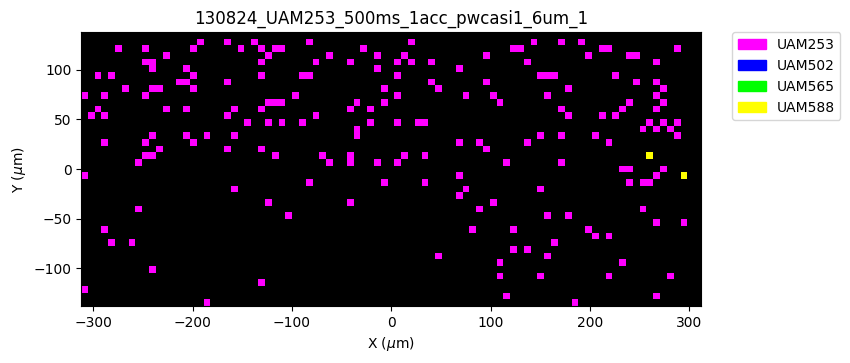

Class 0 (UAM253): 100.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


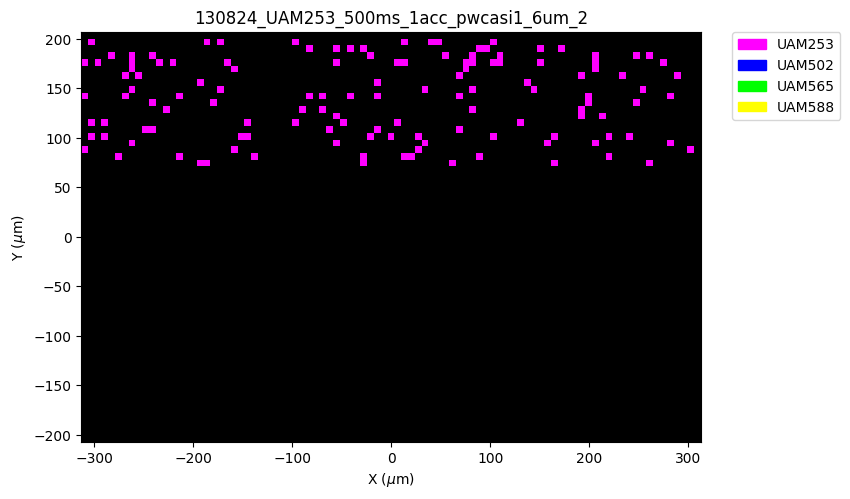

Class 0 (UAM253): 3.12%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 96.88%
Class 3 (UAM588): 0.00%


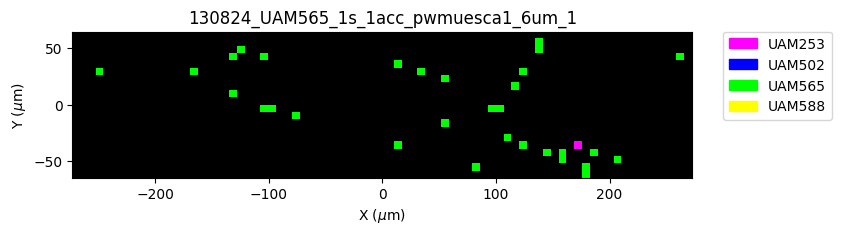

Class 0 (UAM253): 8.82%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 91.18%
Class 3 (UAM588): 0.00%


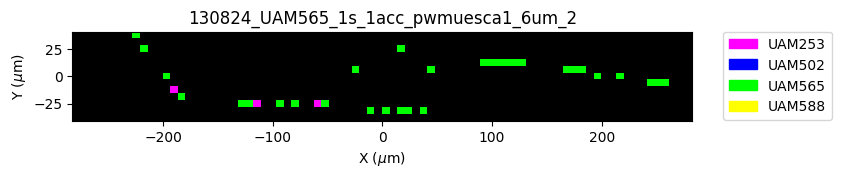

Class 0 (UAM253): 3.70%
Class 1 (UAM502): 9.26%
Class 2 (UAM565): 87.04%
Class 3 (UAM588): 0.00%


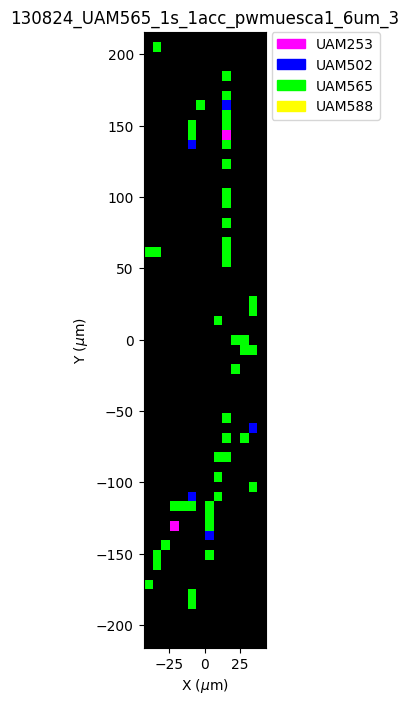

Class 0 (UAM253): 7.14%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 92.86%
Class 3 (UAM588): 0.00%


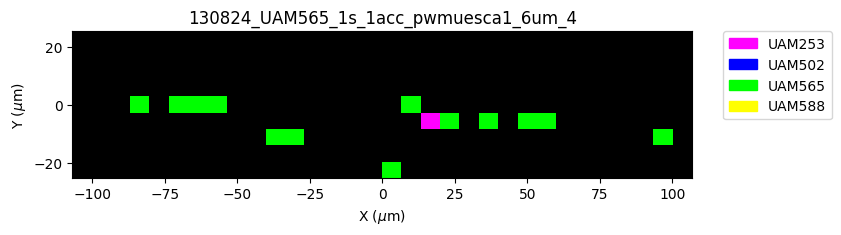

Class 0 (UAM253): 7.46%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 91.79%
Class 3 (UAM588): 0.75%


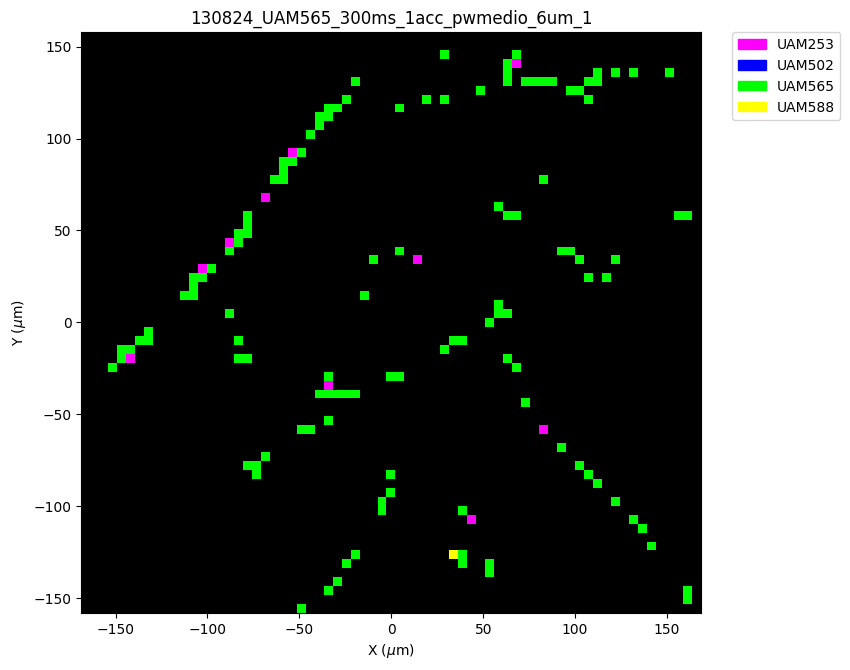

Class 0 (UAM253): 1.90%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 96.20%
Class 3 (UAM588): 1.90%


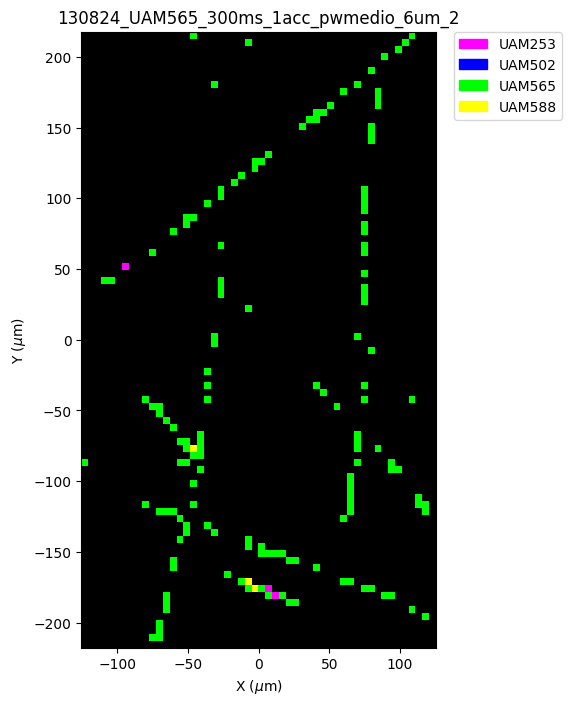

Class 0 (UAM253): 2.82%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 96.48%
Class 3 (UAM588): 0.70%


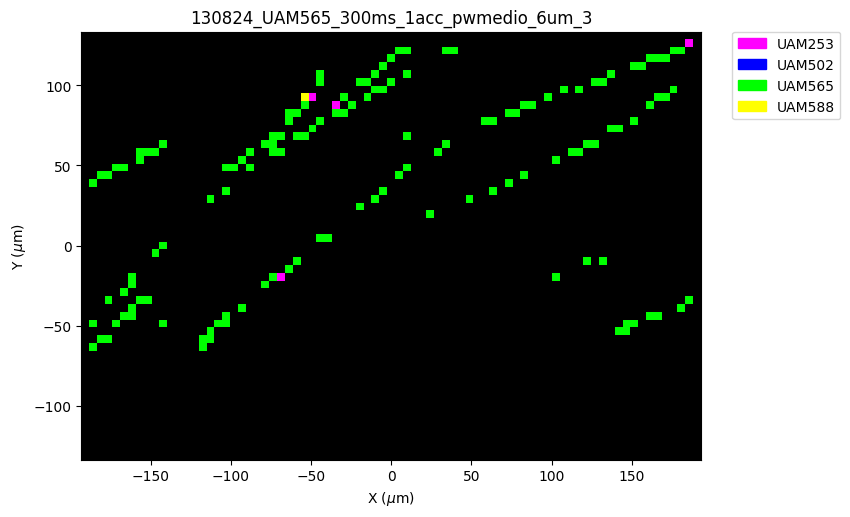

Class 0 (UAM253): 1.18%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 98.82%
Class 3 (UAM588): 0.00%


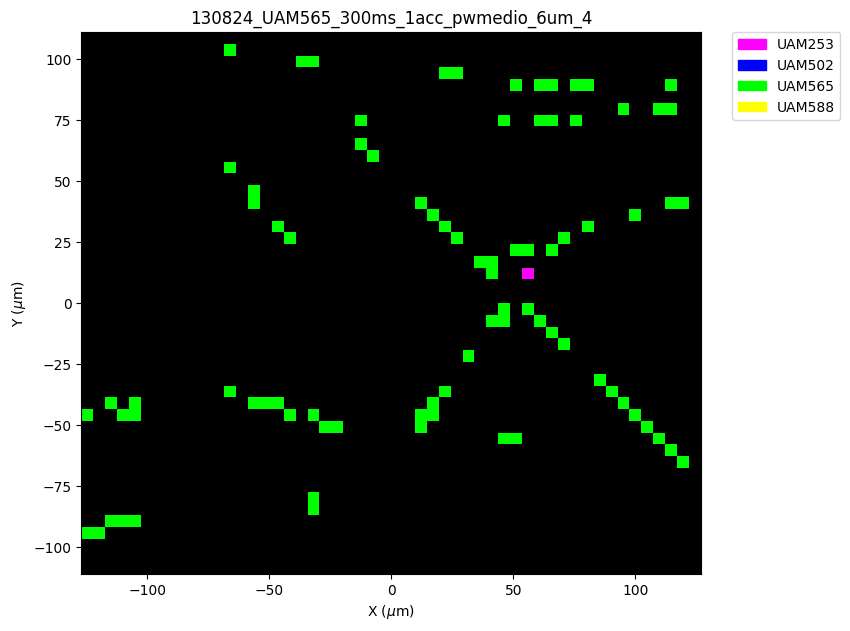

Class 0 (UAM253): 1.49%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 98.51%
Class 3 (UAM588): 0.00%


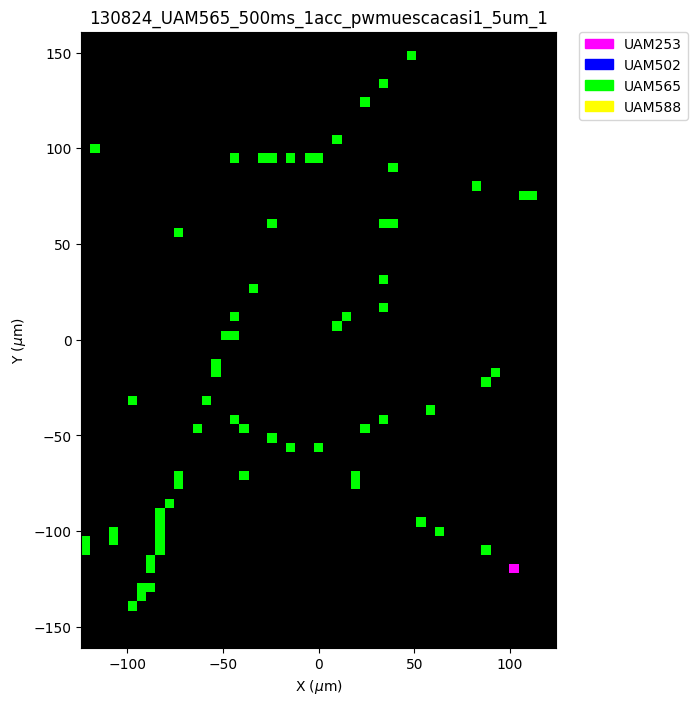

Class 0 (UAM253): 1.46%
Class 1 (UAM502): 1.46%
Class 2 (UAM565): 96.59%
Class 3 (UAM588): 0.49%


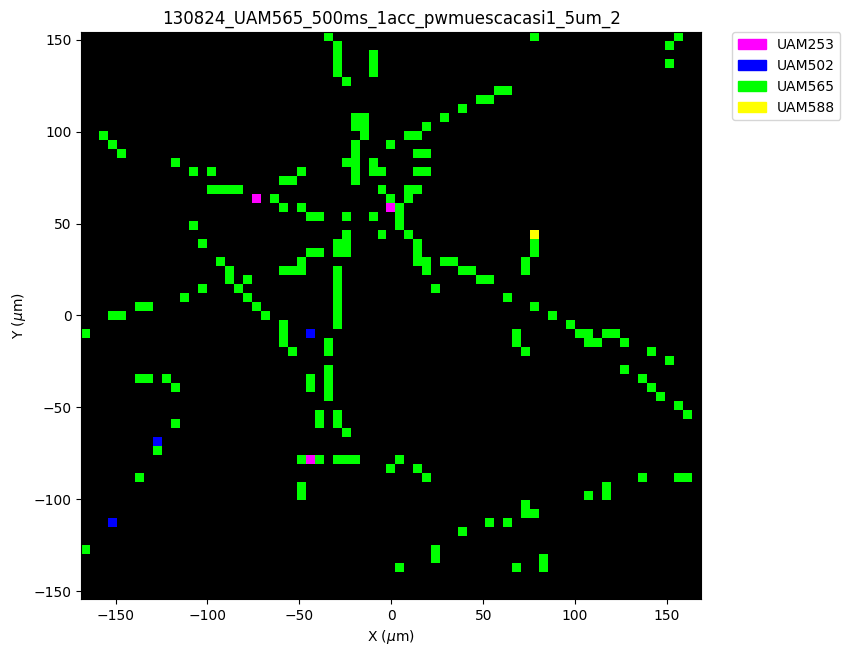

No data in infomapas for file: 140323_UAM588_2s_1acc_pwmuesca2_3um
No data in infomapas for file: 140323_UAM588_2s_1acc_pwmuesca2_4um
Class 0 (UAM253): 100.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


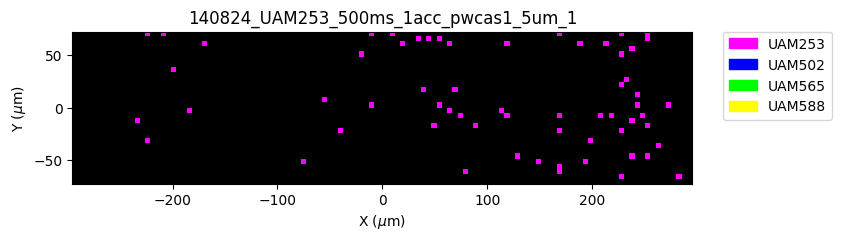

Class 0 (UAM253): 97.18%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 1.64%
Class 3 (UAM588): 1.17%


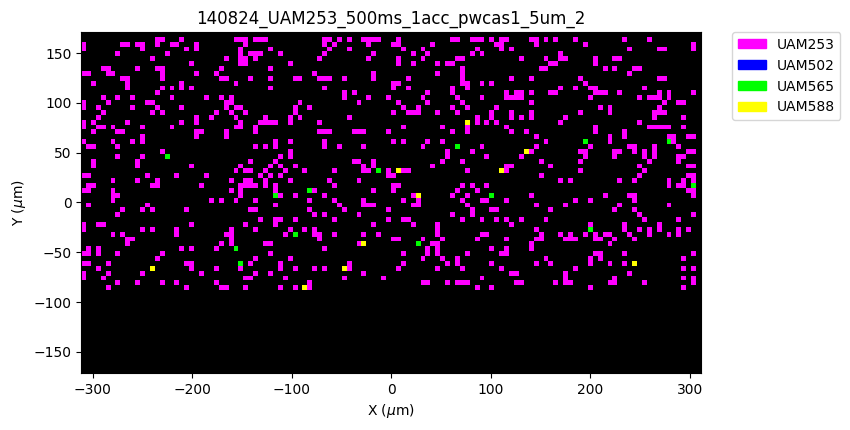

Class 0 (UAM253): 2.27%
Class 1 (UAM502): 1.27%
Class 2 (UAM565): 95.33%
Class 3 (UAM588): 1.13%


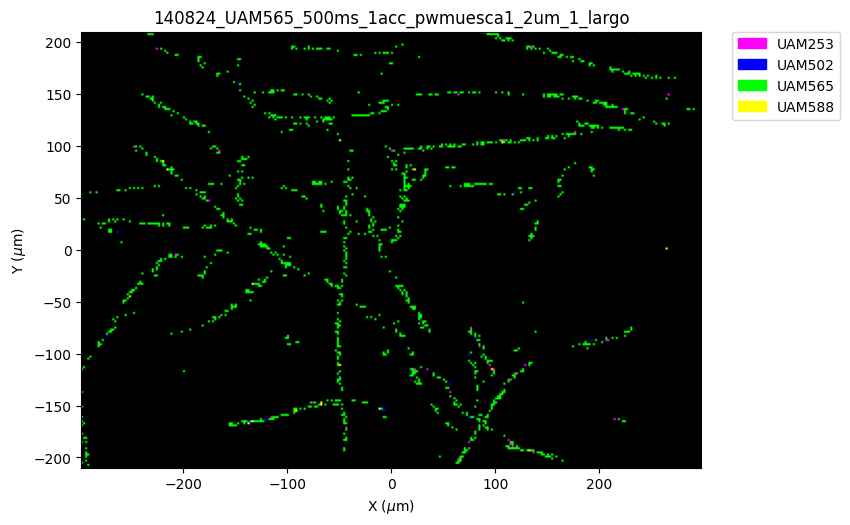

Class 0 (UAM253): 7.96%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 91.15%
Class 3 (UAM588): 0.88%


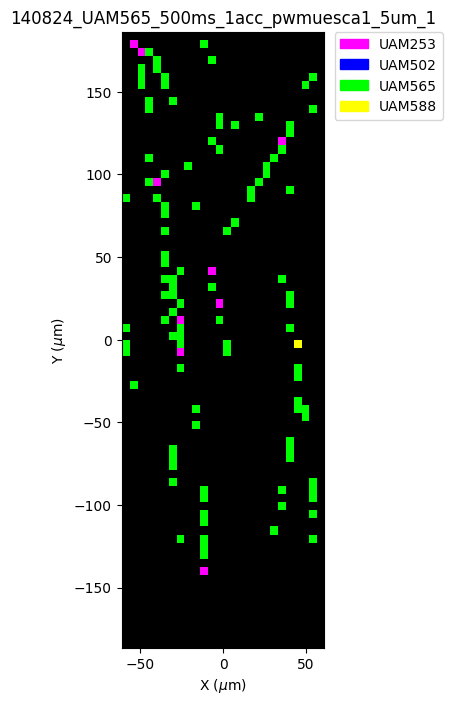

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


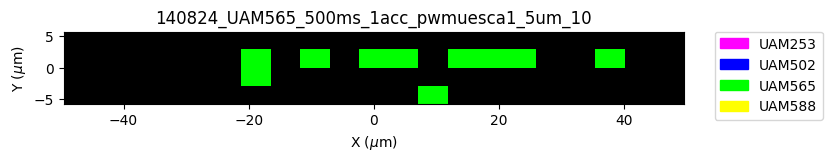

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


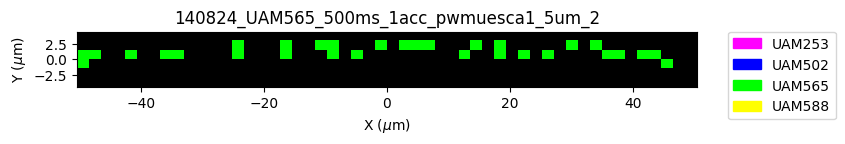

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


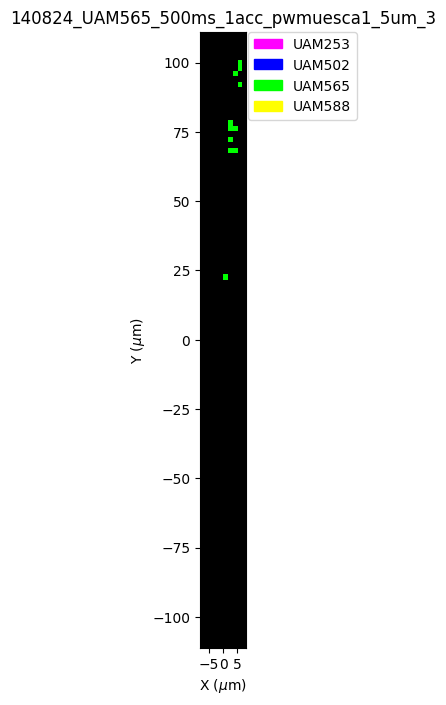

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


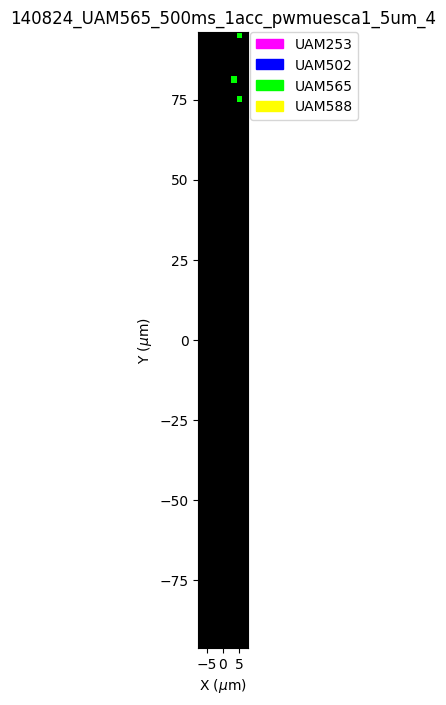

Class 0 (UAM253): 11.76%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 88.24%
Class 3 (UAM588): 0.00%


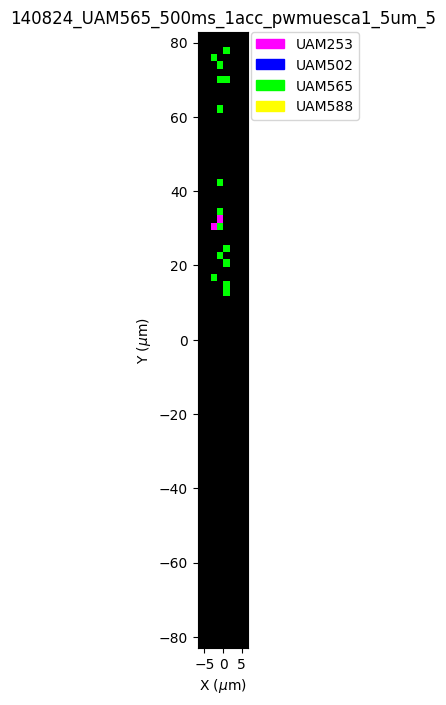

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


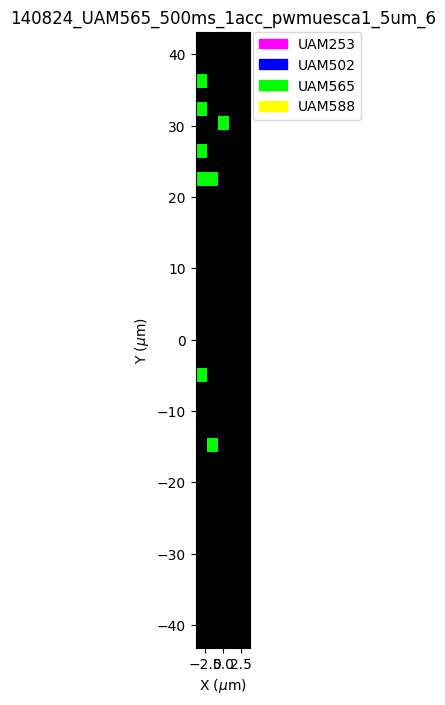

Class 0 (UAM253): 22.58%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 77.42%
Class 3 (UAM588): 0.00%


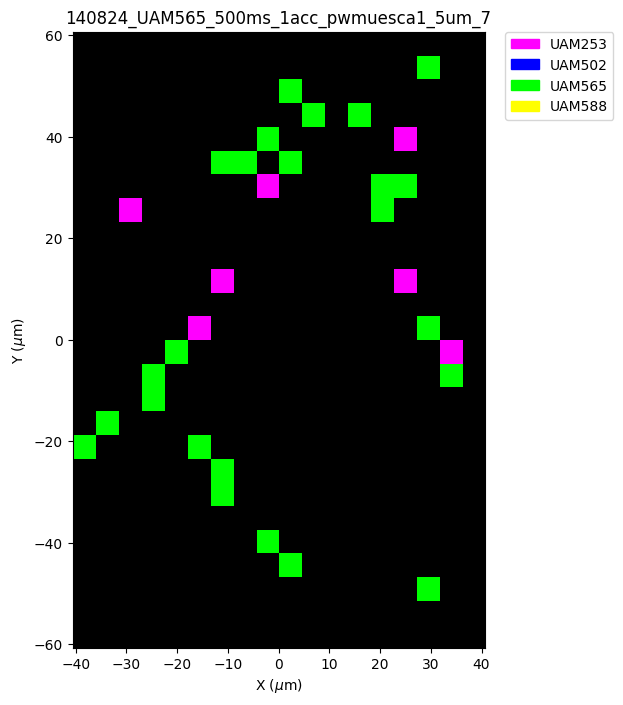

Class 0 (UAM253): 25.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 75.00%
Class 3 (UAM588): 0.00%


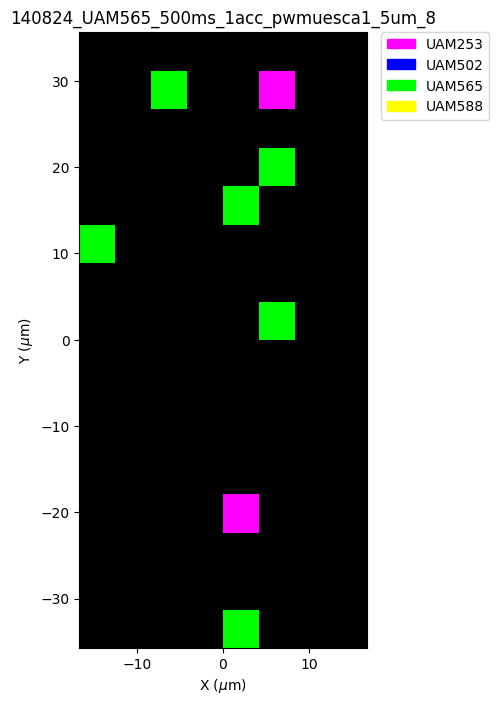

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


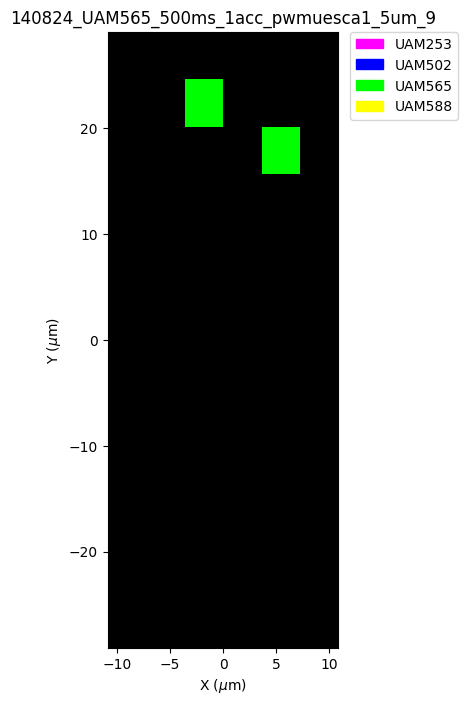

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


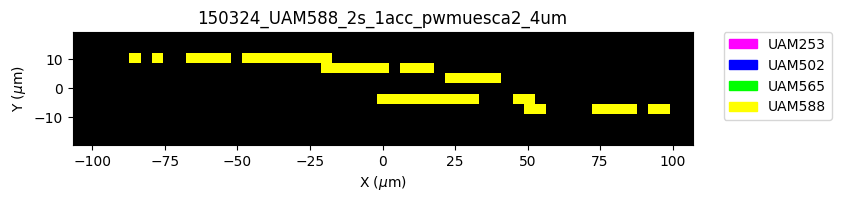

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 4.21%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 95.79%


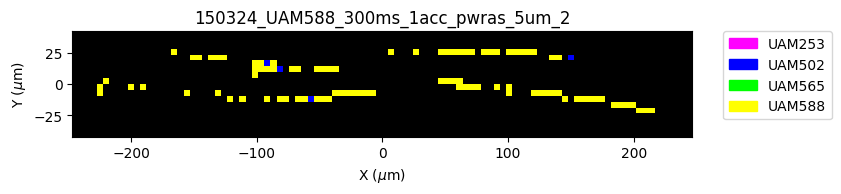

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 5.32%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 94.68%


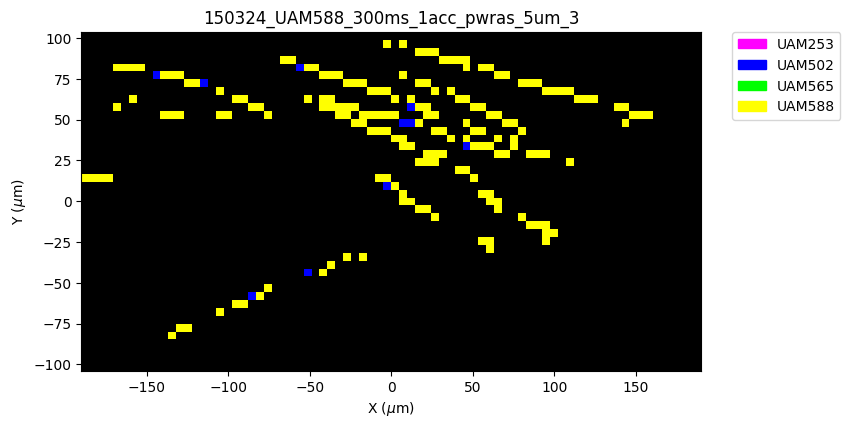

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


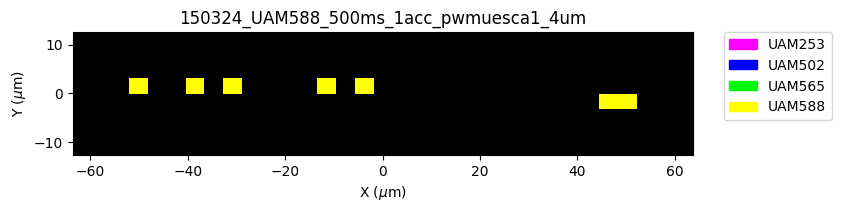

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


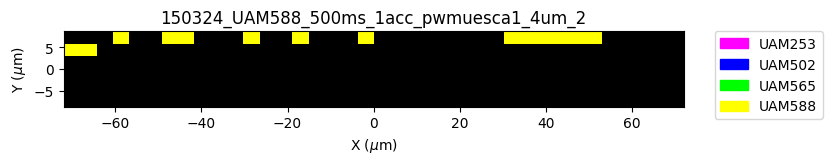

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 2.50%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 97.50%


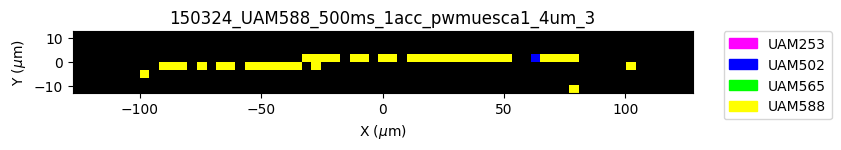

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


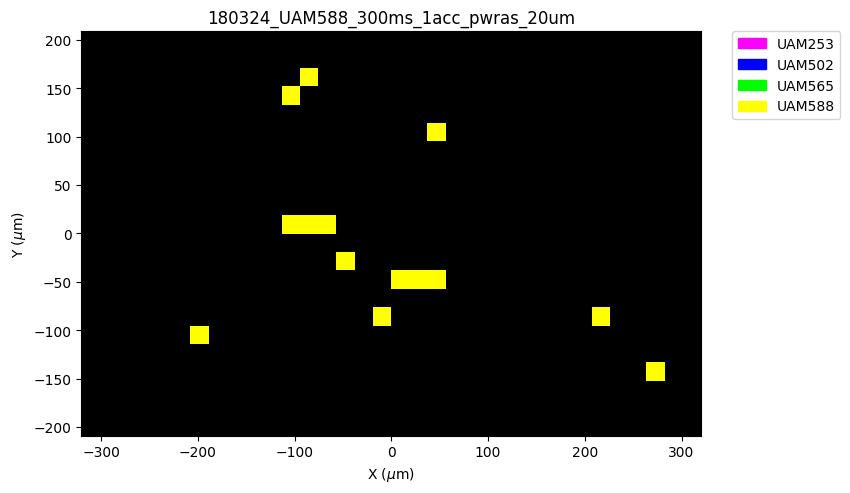

Class 0 (UAM253): 2.13%
Class 1 (UAM502): 2.13%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 95.74%


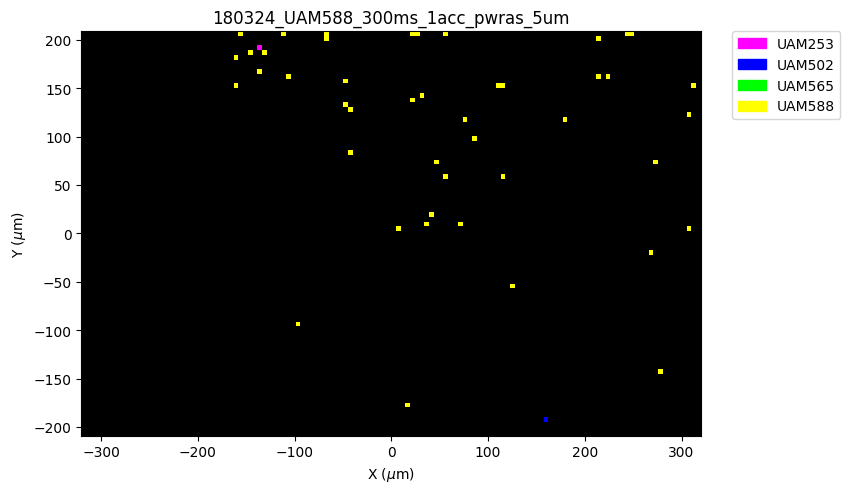

Class 0 (UAM253): 0.89%
Class 1 (UAM502): 8.89%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 90.22%


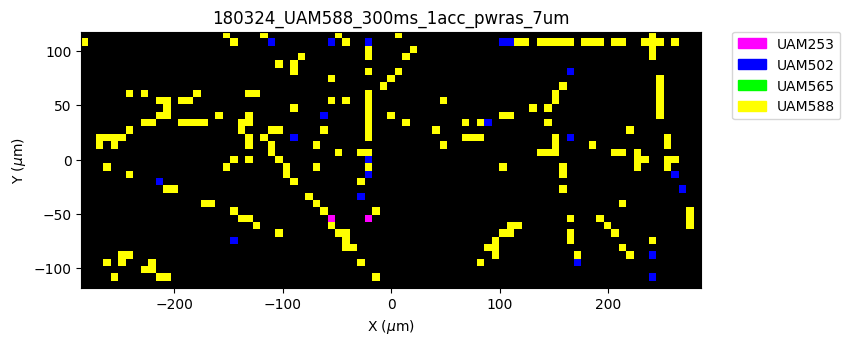

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 100.00%


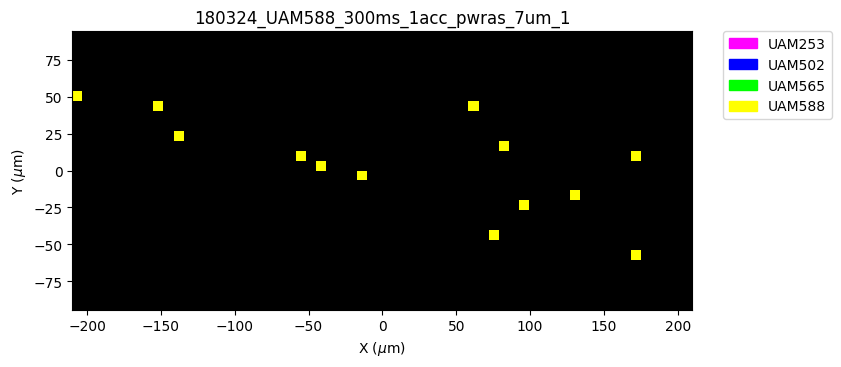

Class 0 (UAM253): 1.83%
Class 1 (UAM502): 20.12%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 78.05%


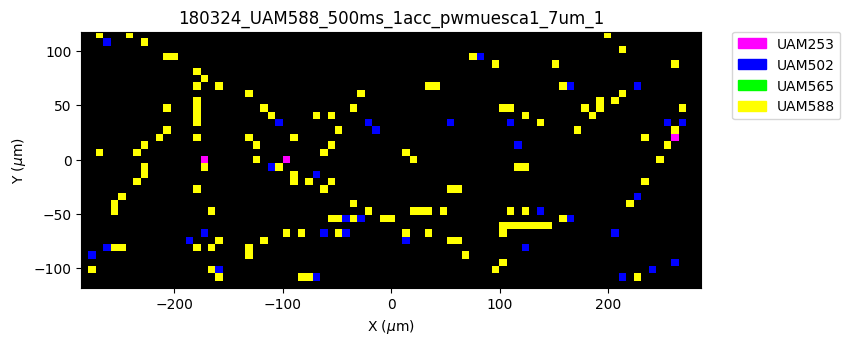

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 6.82%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 93.18%


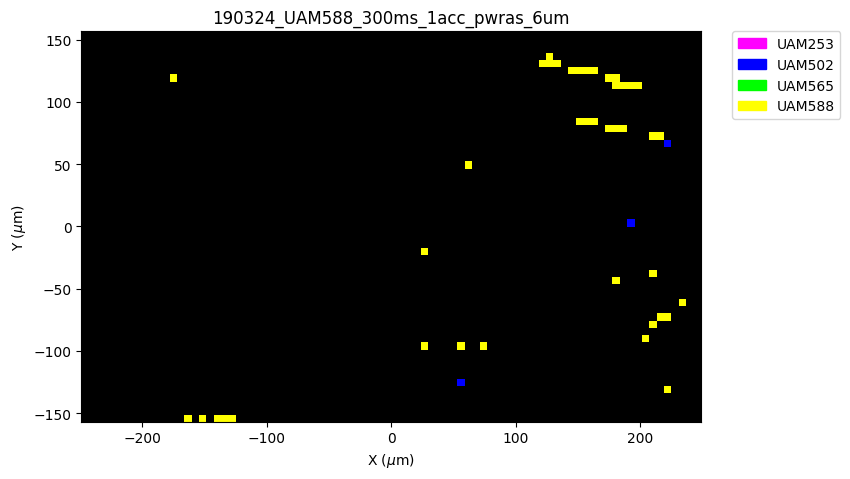

Class 0 (UAM253): 9.70%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 89.09%
Class 3 (UAM588): 1.21%


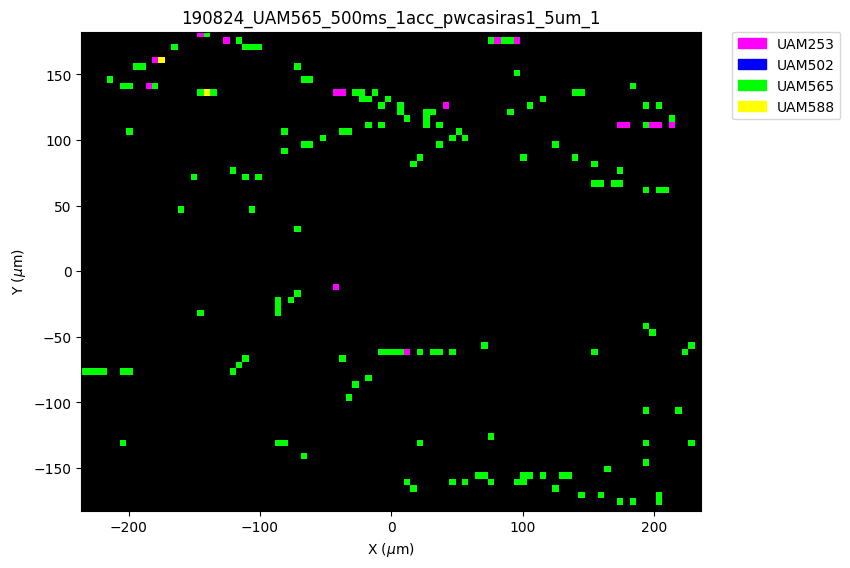

Class 0 (UAM253): 2.27%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 97.73%
Class 3 (UAM588): 0.00%


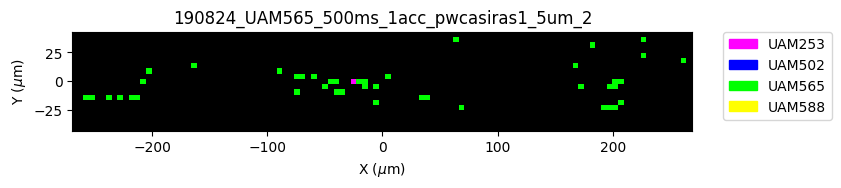

Class 0 (UAM253): 3.70%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 96.30%
Class 3 (UAM588): 0.00%


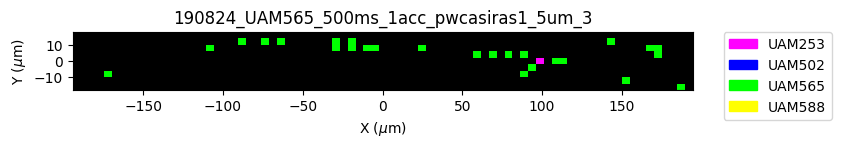

Class 0 (UAM253): 3.57%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 96.43%
Class 3 (UAM588): 0.00%


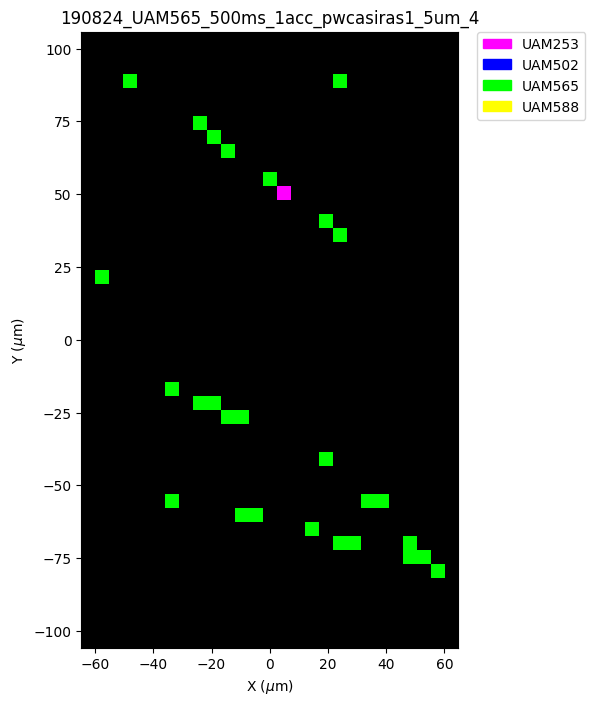

Class 0 (UAM253): 1.79%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 98.21%
Class 3 (UAM588): 0.00%


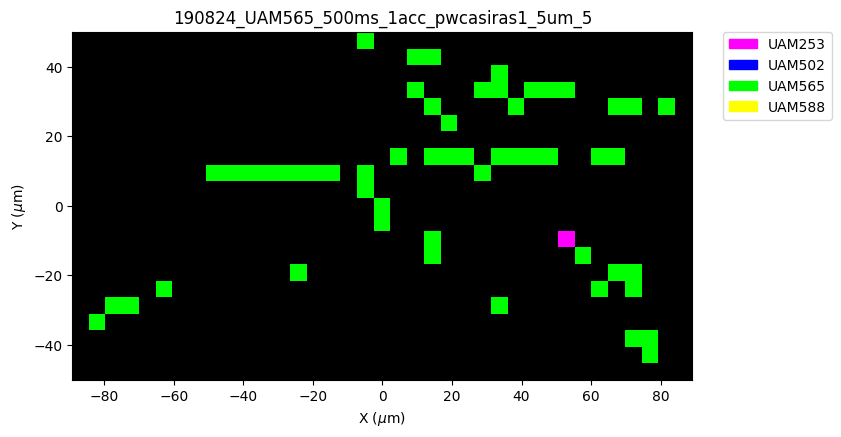

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 0.00%
Class 2 (UAM565): 100.00%
Class 3 (UAM588): 0.00%


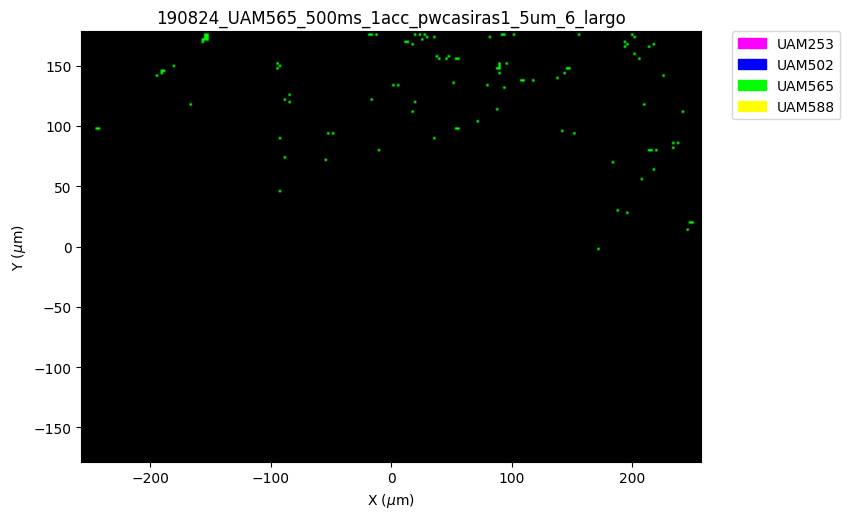

Class 0 (UAM253): 0.12%
Class 1 (UAM502): 5.07%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 94.81%


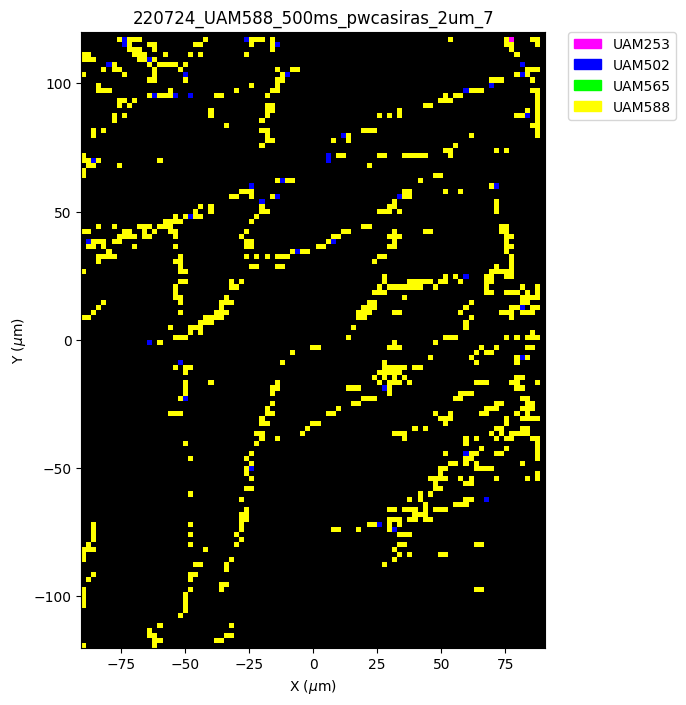

Class 0 (UAM253): 1.23%
Class 1 (UAM502): 4.32%
Class 2 (UAM565): 0.40%
Class 3 (UAM588): 94.06%


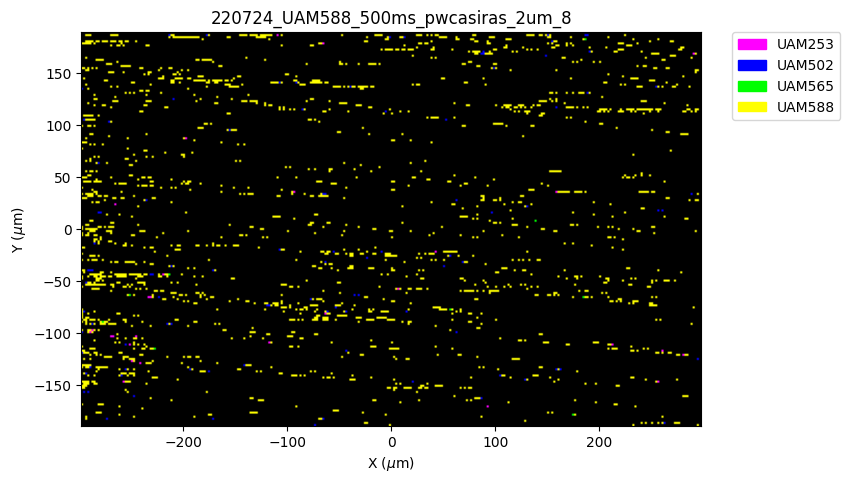

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 1.42%
Class 2 (UAM565): 0.71%
Class 3 (UAM588): 97.86%


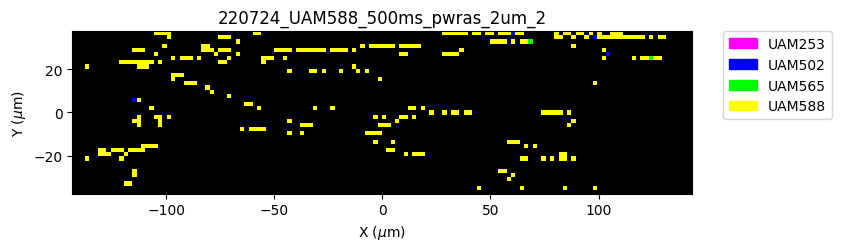

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 2.28%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 97.72%


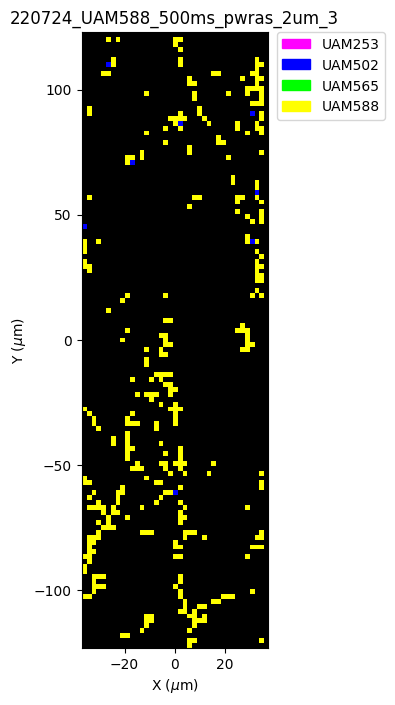

Class 0 (UAM253): 1.97%
Class 1 (UAM502): 8.99%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 89.04%


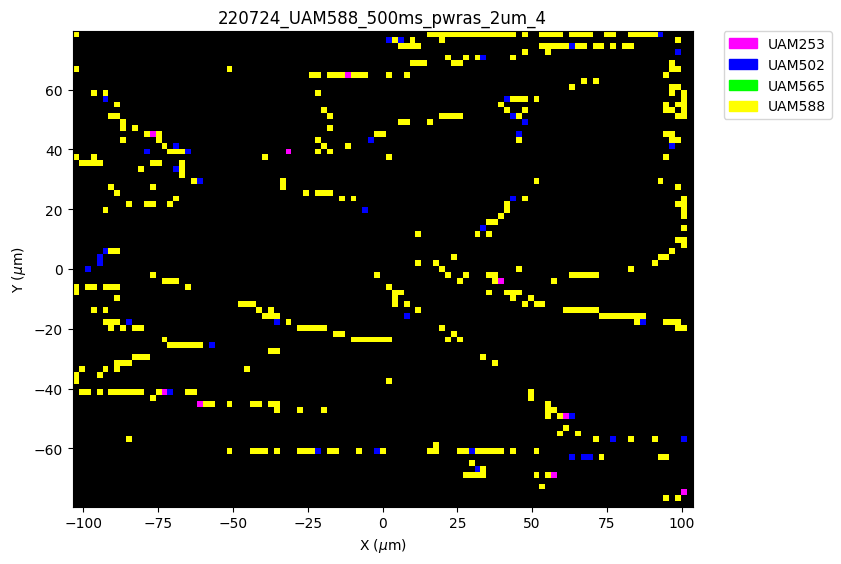

Class 0 (UAM253): 0.68%
Class 1 (UAM502): 4.45%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 94.86%


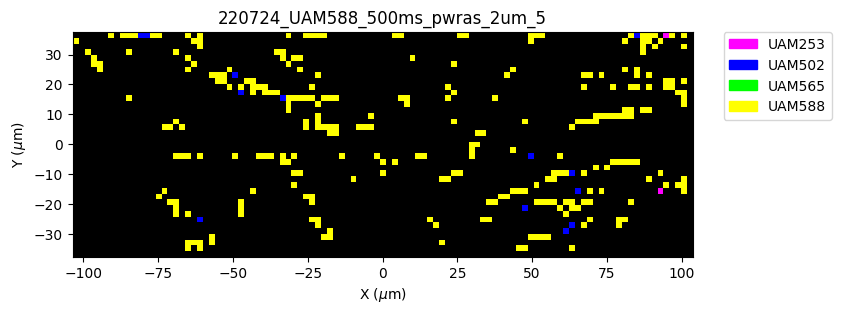

Class 0 (UAM253): 3.46%
Class 1 (UAM502): 11.15%
Class 2 (UAM565): 0.38%
Class 3 (UAM588): 85.00%


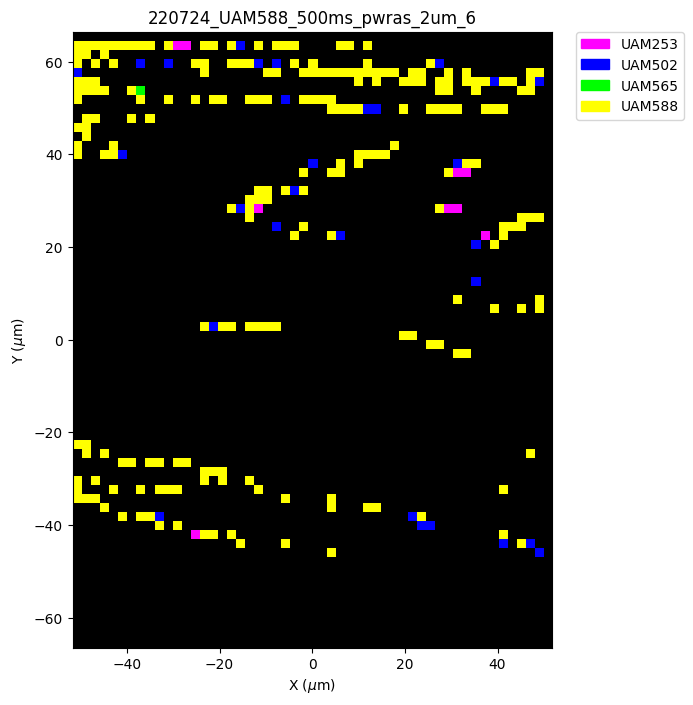

Class 0 (UAM253): 1.41%
Class 1 (UAM502): 4.40%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 94.19%


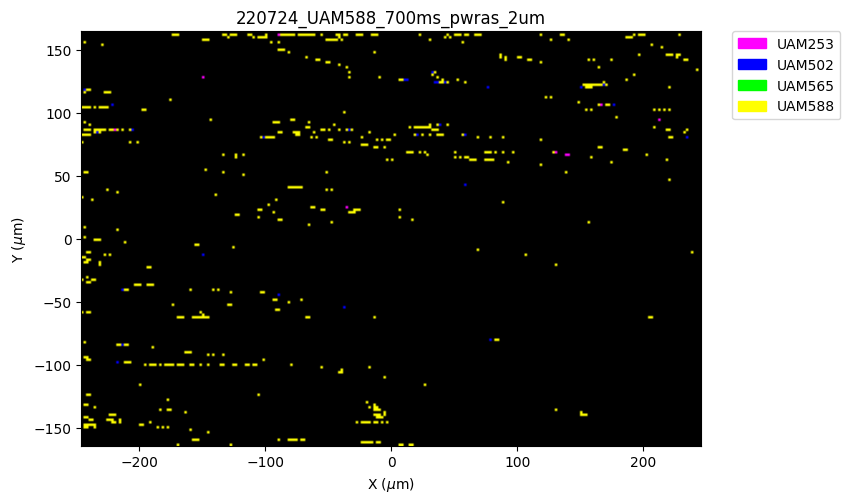

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 88.61%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 11.39%


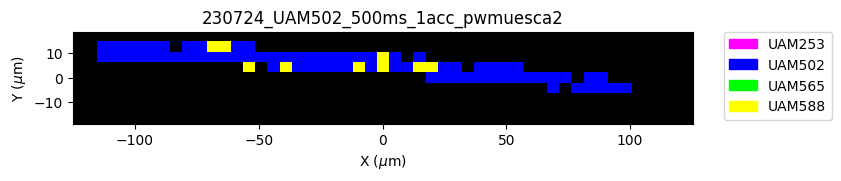

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 87.14%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 12.86%


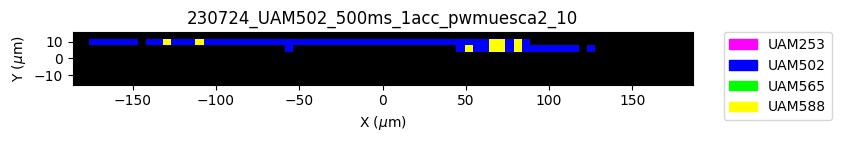

Class 0 (UAM253): 0.76%
Class 1 (UAM502): 90.08%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 9.16%


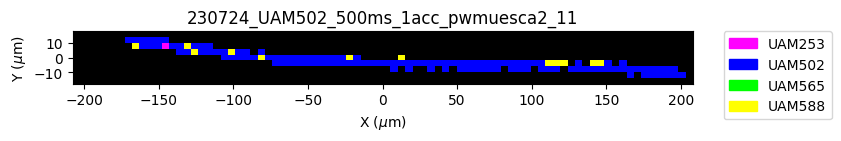

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 95.31%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 4.69%


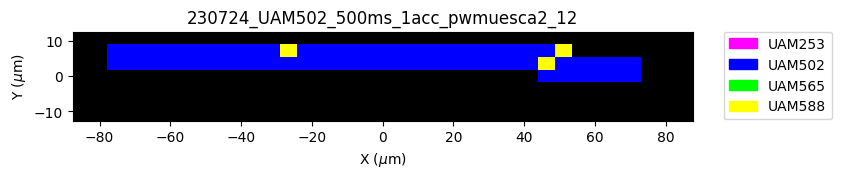

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 92.31%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 7.69%


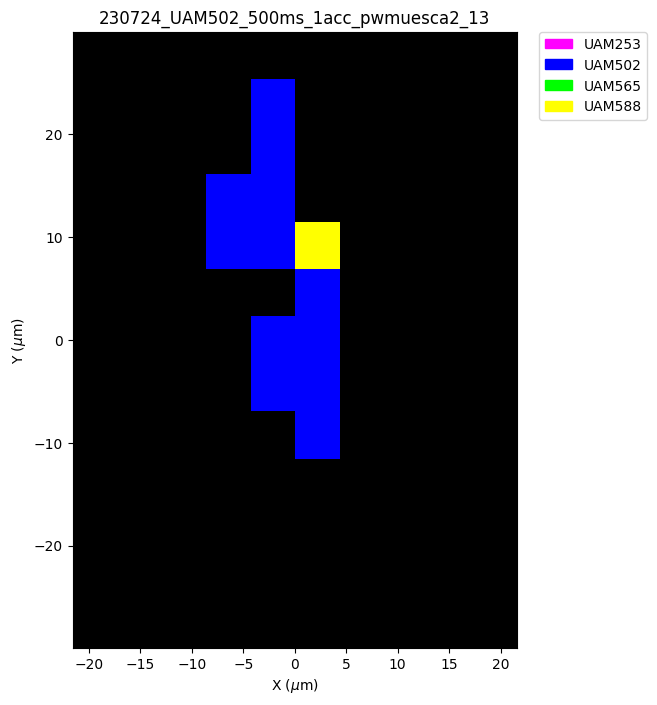

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


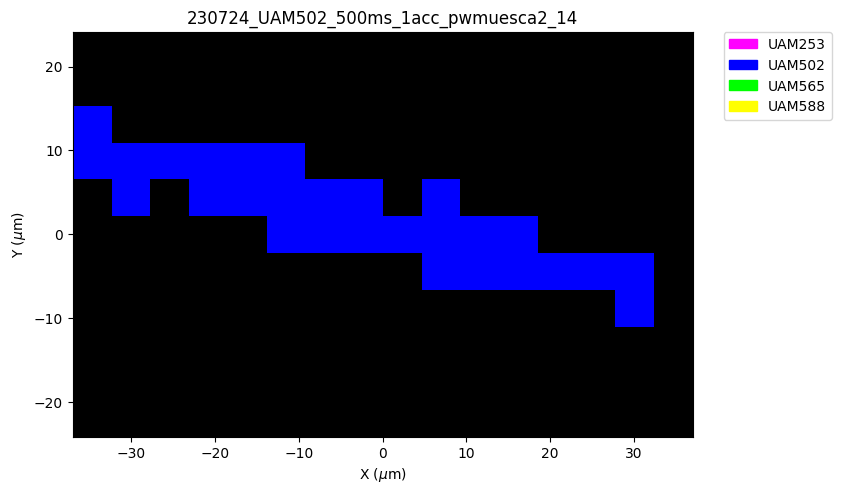

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


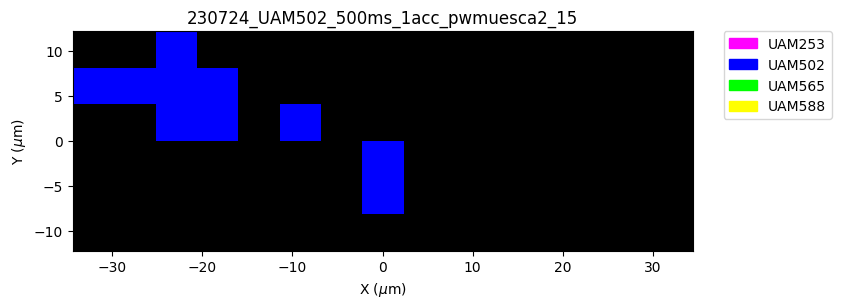

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


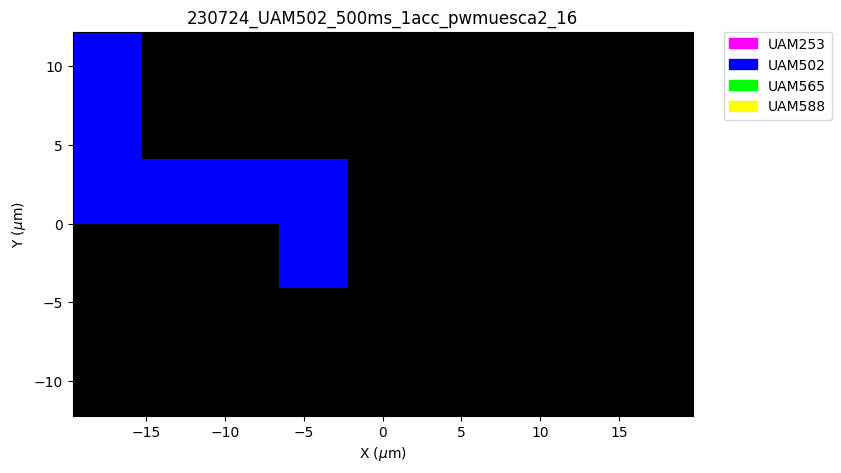

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 92.68%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 7.32%


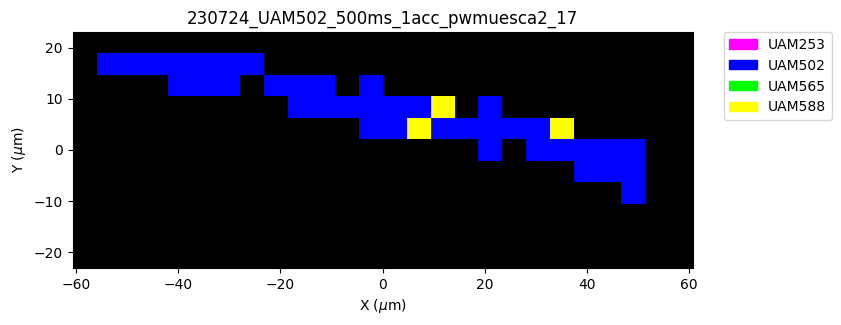

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 82.76%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 17.24%


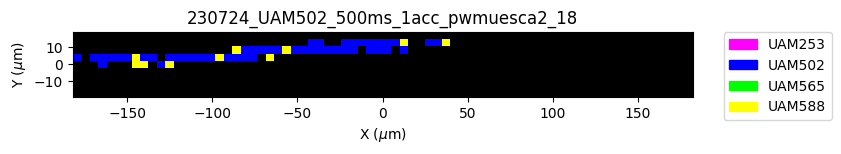

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 88.46%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 11.54%


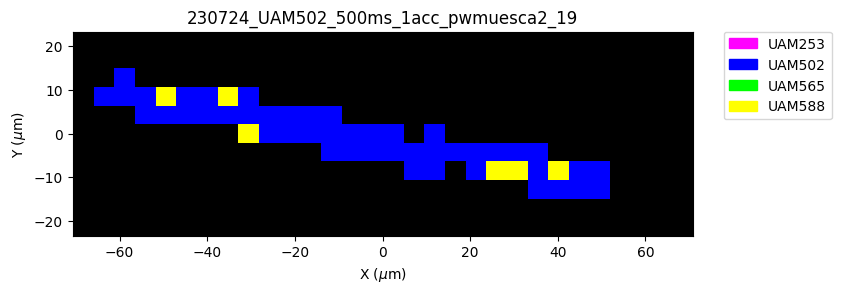

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.59%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.41%


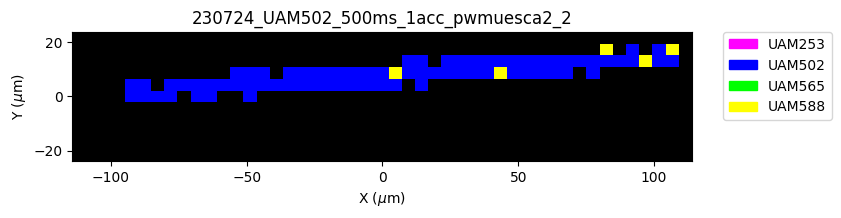

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 94.12%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 5.88%


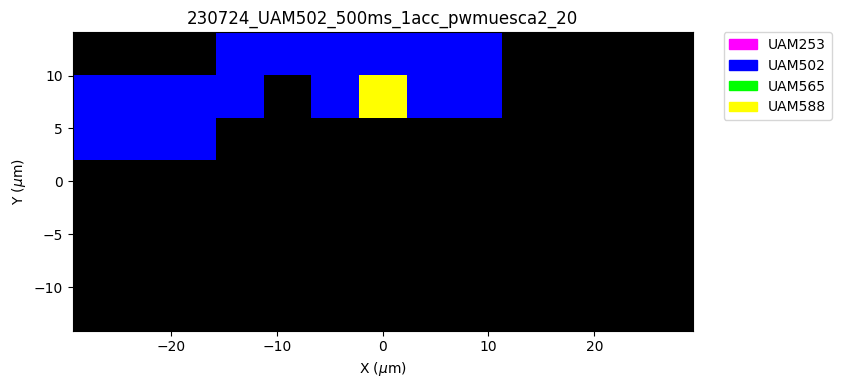

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


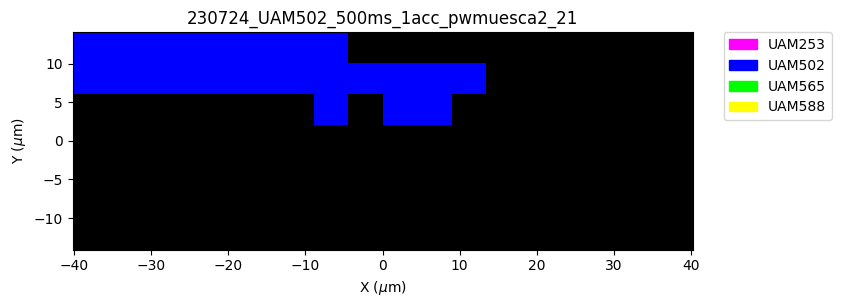

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


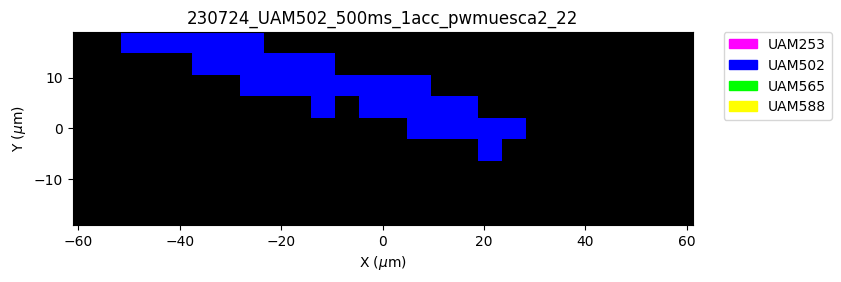

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 94.74%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 5.26%


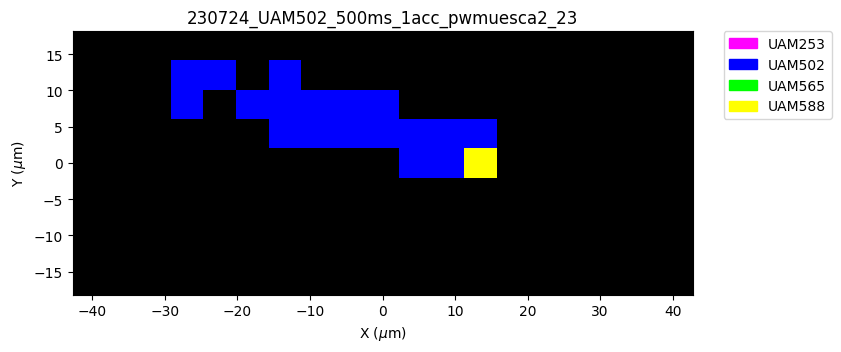

Class 0 (UAM253): 2.07%
Class 1 (UAM502): 89.26%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 8.68%


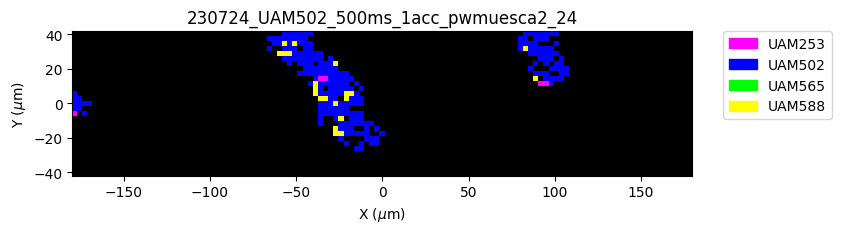

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.51%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.49%


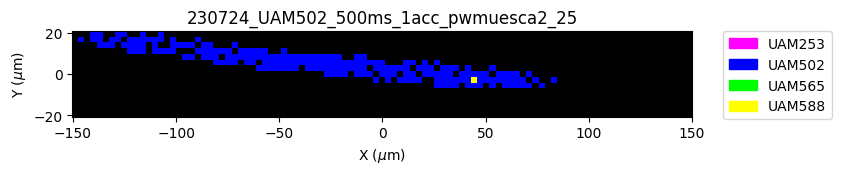

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 96.97%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 3.03%


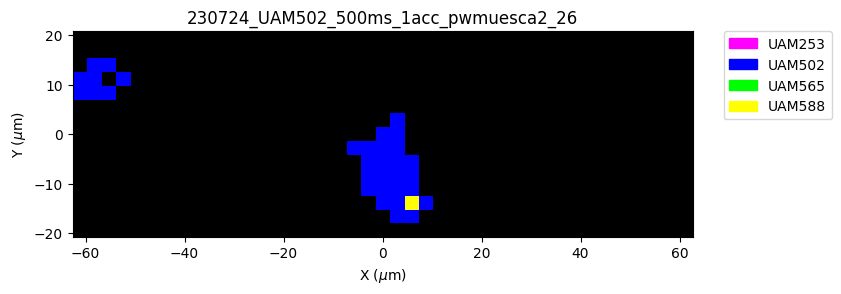

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.02%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.98%


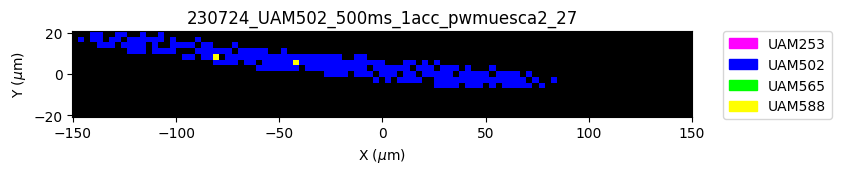

Class 0 (UAM253): 1.01%
Class 1 (UAM502): 96.46%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 2.53%


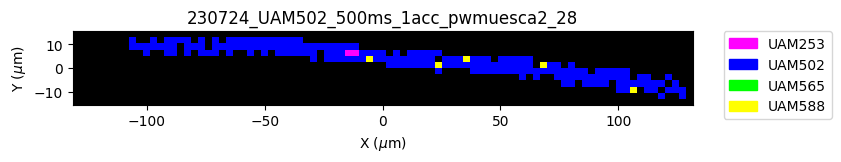

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 98.25%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 1.75%


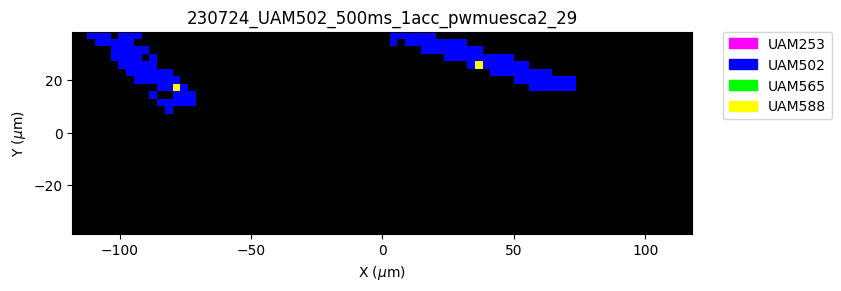

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


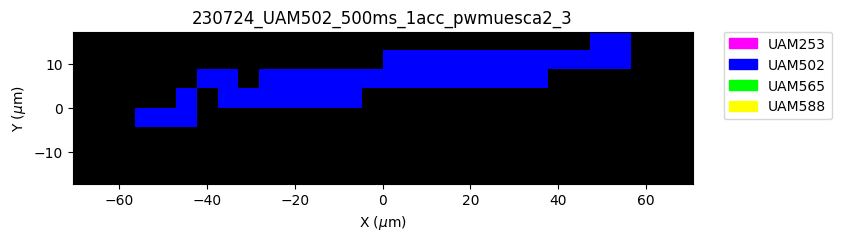

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


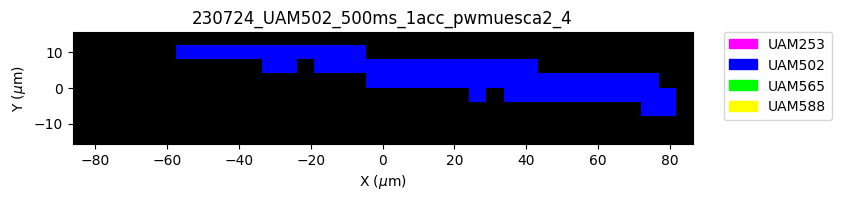

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


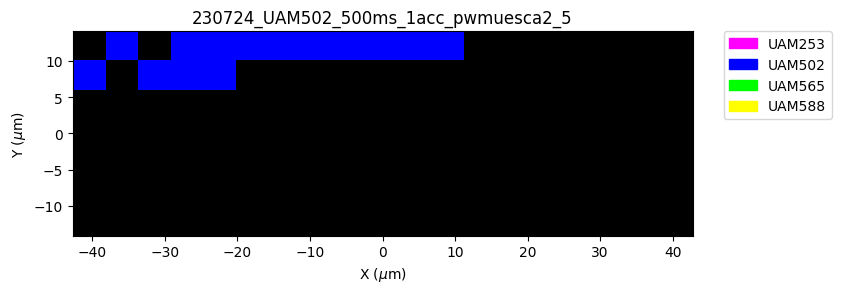

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 87.50%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 12.50%


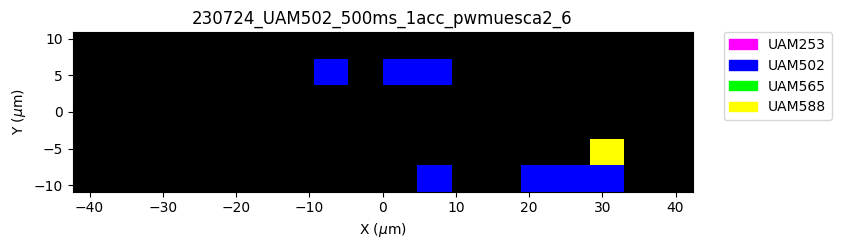

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


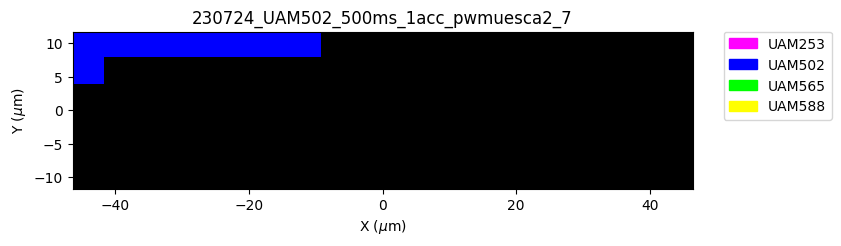

Class 0 (UAM253): 0.52%
Class 1 (UAM502): 89.58%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 9.90%


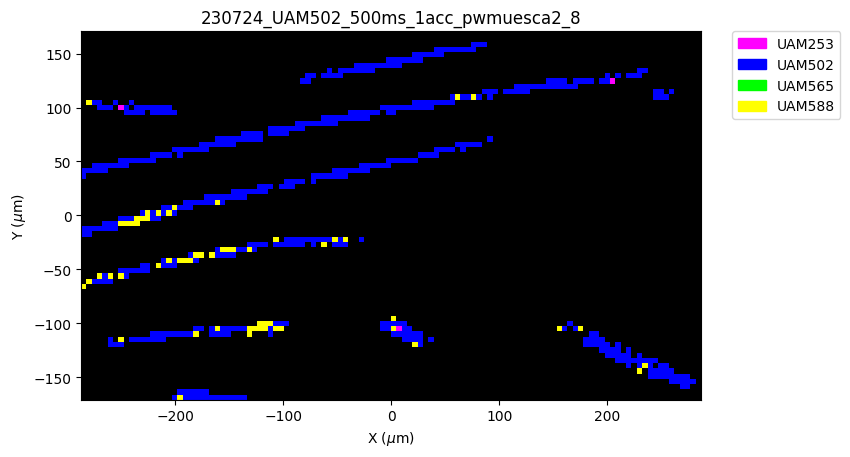

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 96.17%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 3.83%


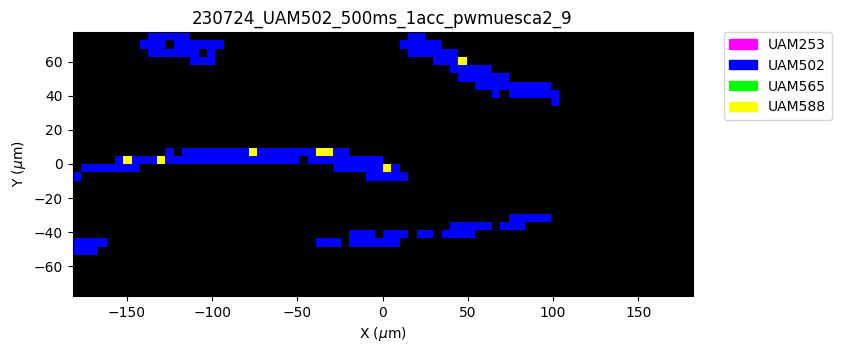

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.04%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.96%


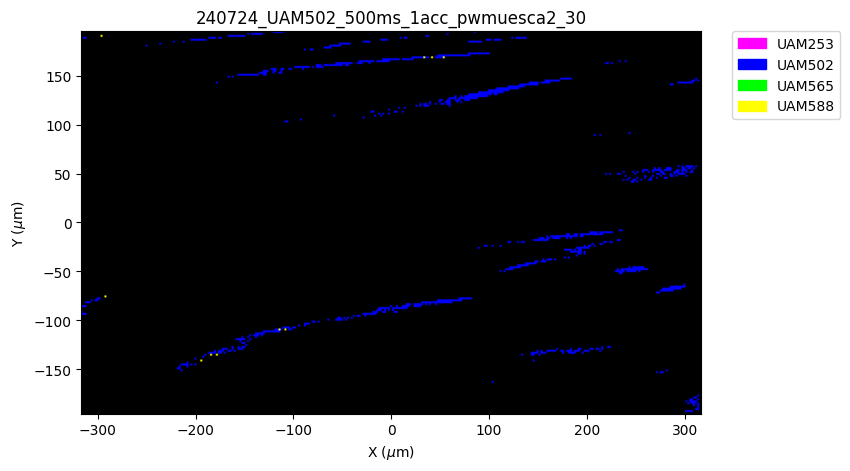

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


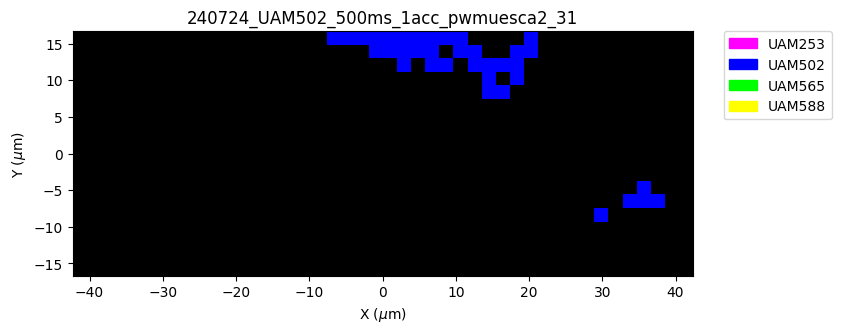

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


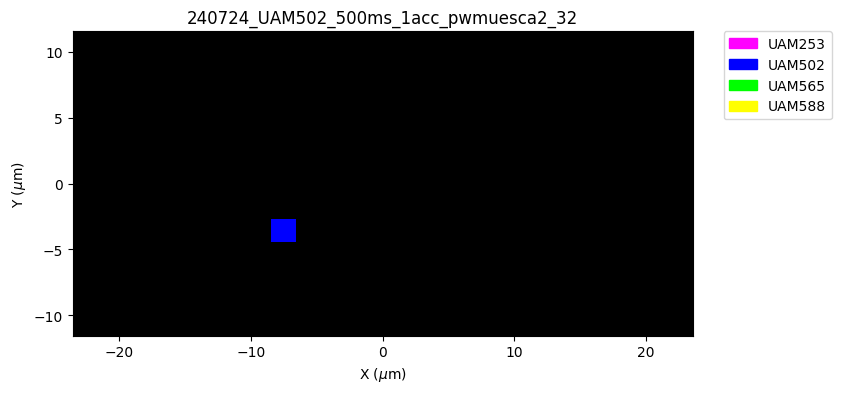

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.73%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.27%


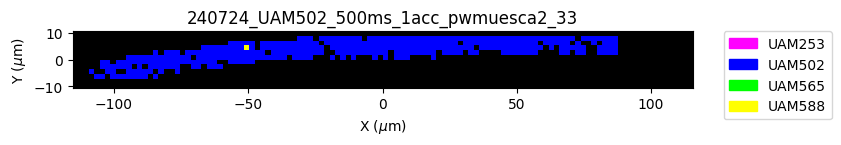

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


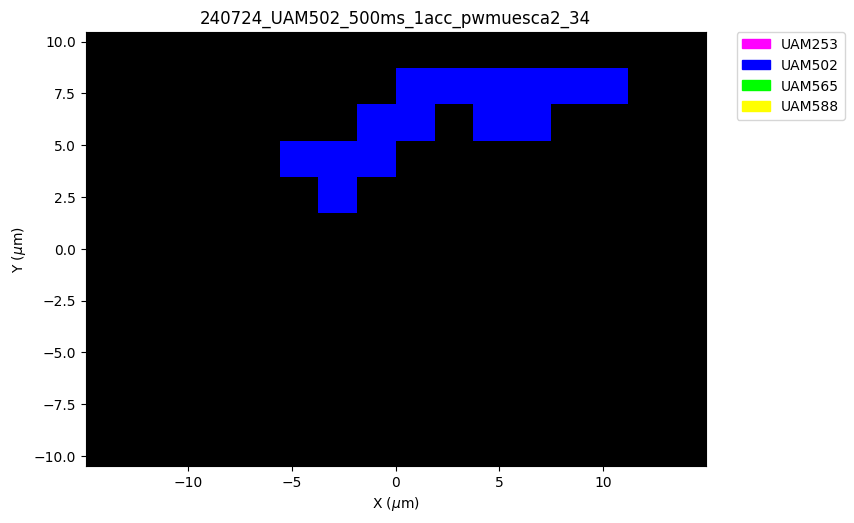

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


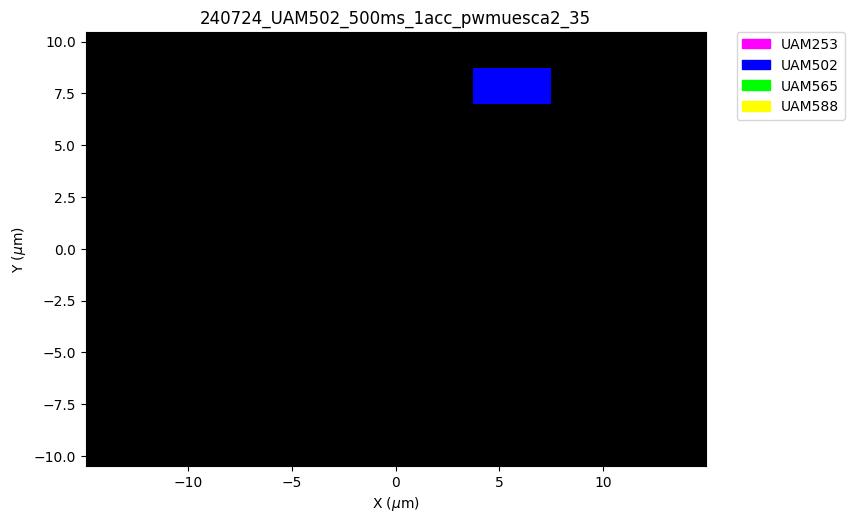

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 100.00%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.00%


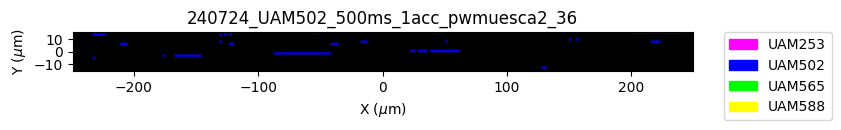

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.56%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.44%


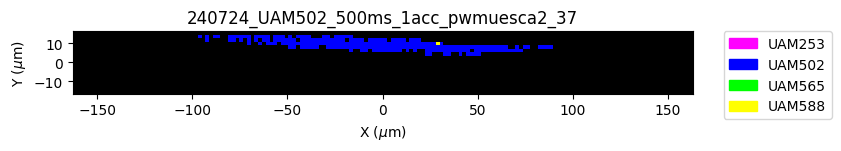

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.28%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.72%


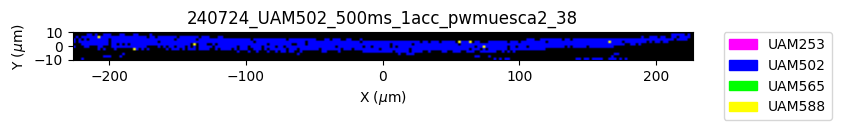

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 92.78%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 7.22%


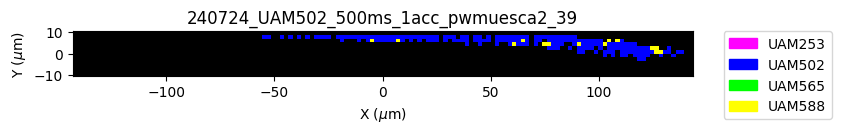

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 99.59%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 0.41%


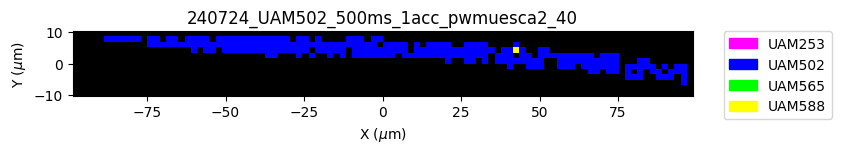

Class 0 (UAM253): 0.36%
Class 1 (UAM502): 93.84%
Class 2 (UAM565): 0.72%
Class 3 (UAM588): 5.07%


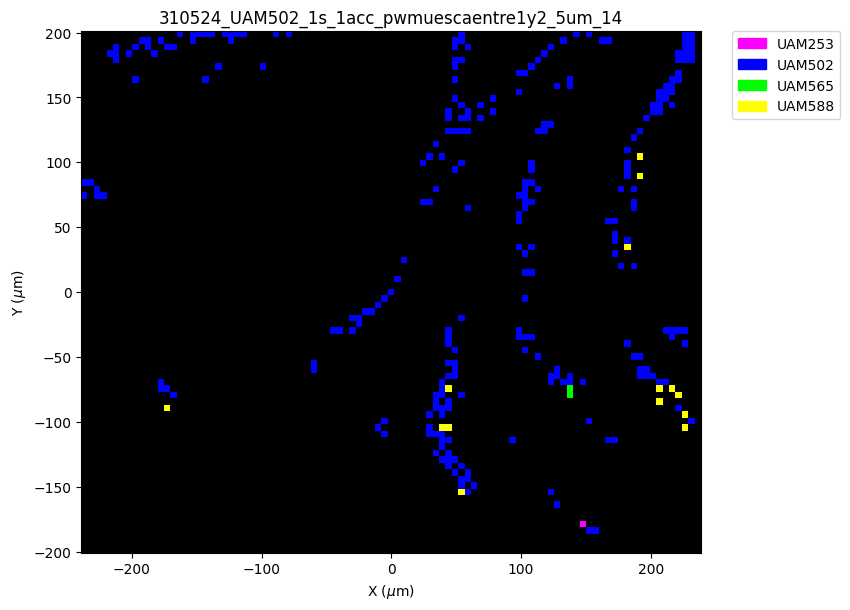

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.33%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.67%


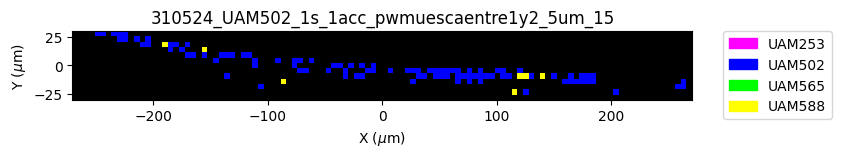

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 95.32%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 4.68%


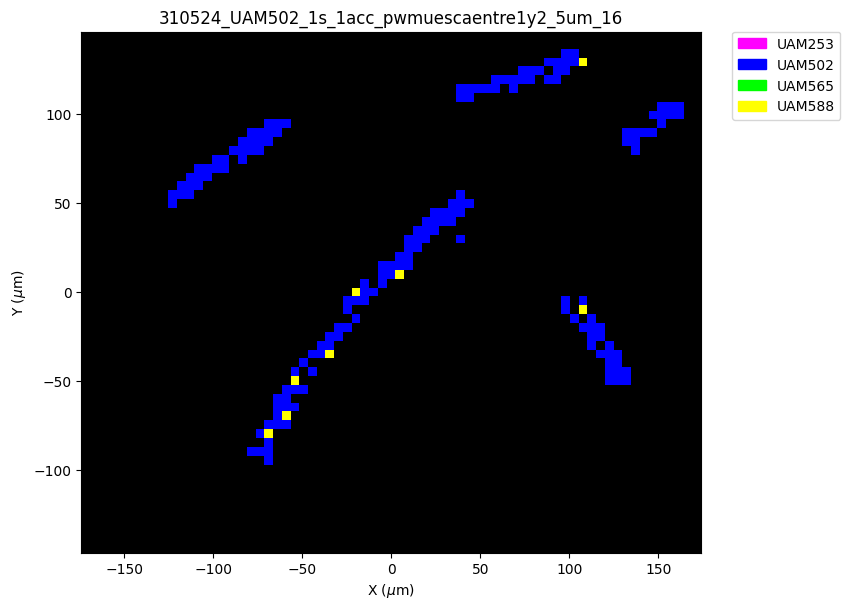

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 82.50%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 17.50%


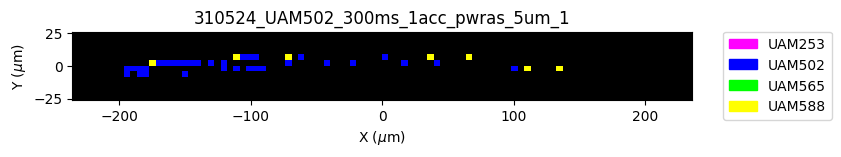

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 88.89%
Class 2 (UAM565): 8.33%
Class 3 (UAM588): 2.78%


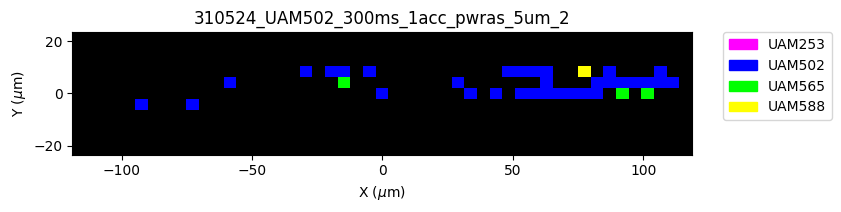

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 92.06%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 7.94%


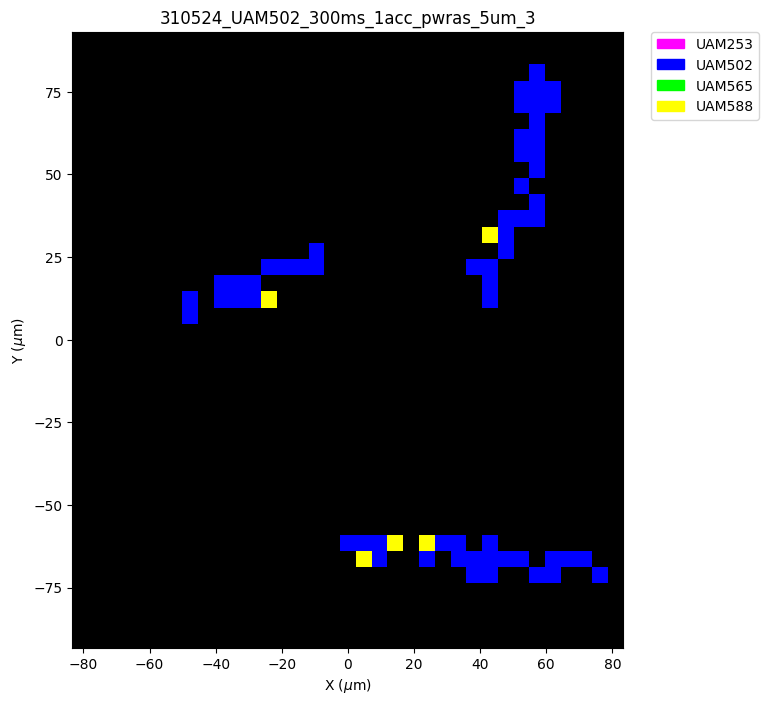

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 96.09%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 3.91%


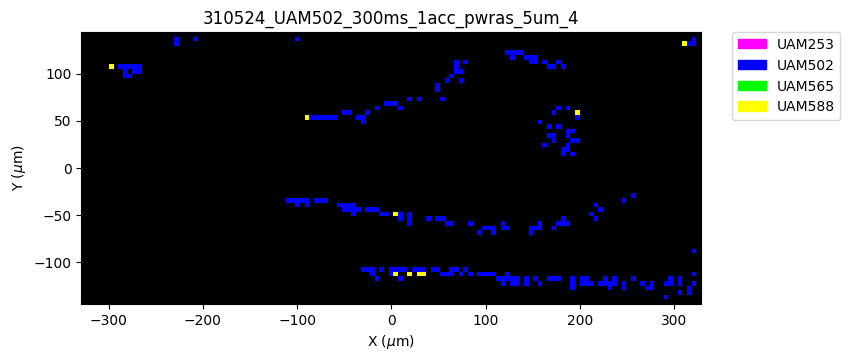

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 97.22%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 2.78%


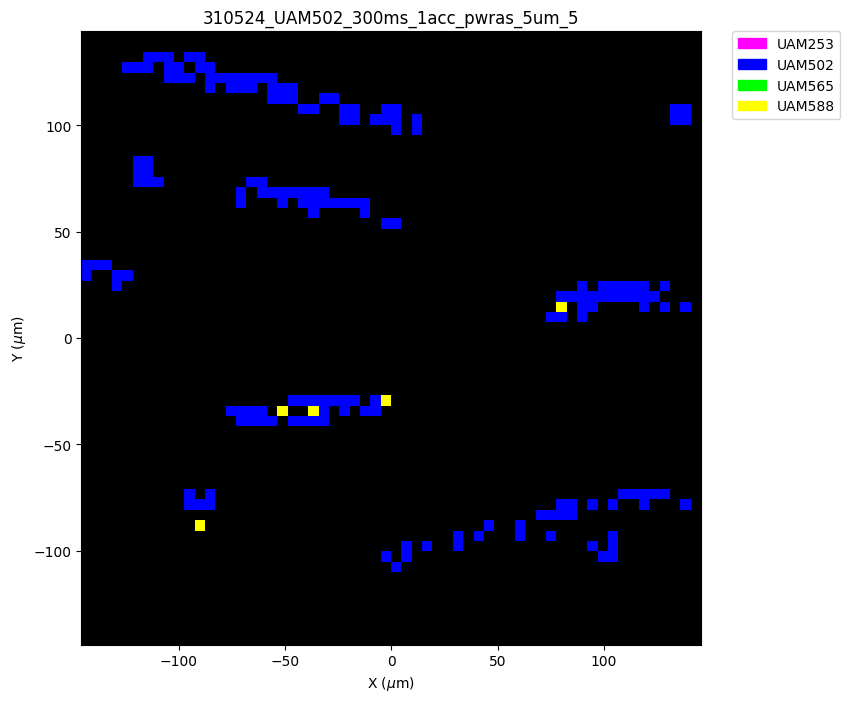

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.67%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.33%


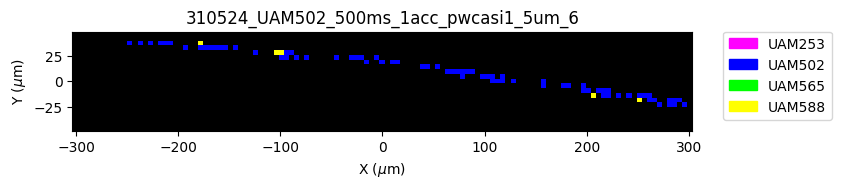

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.11%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.89%


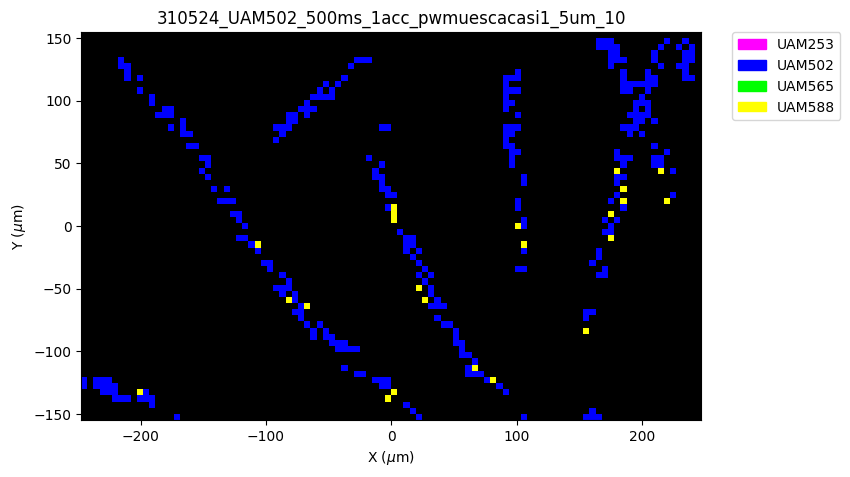

Class 0 (UAM253): 1.18%
Class 1 (UAM502): 91.96%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 6.86%


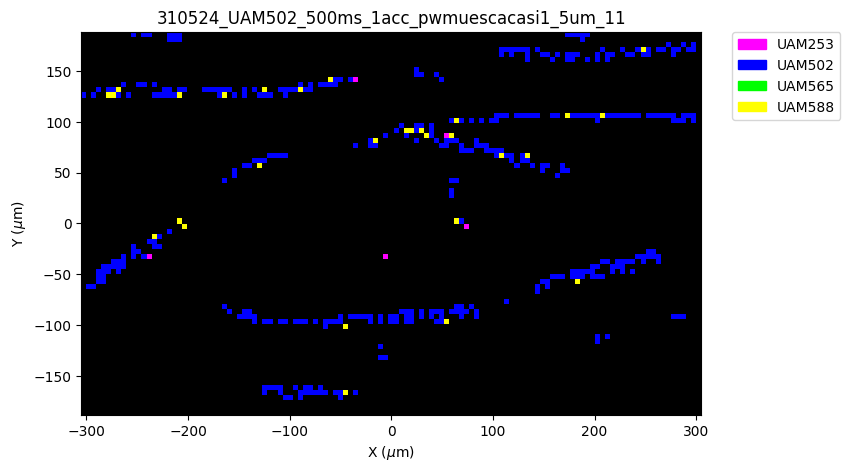

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 91.21%
Class 2 (UAM565): 1.47%
Class 3 (UAM588): 7.33%


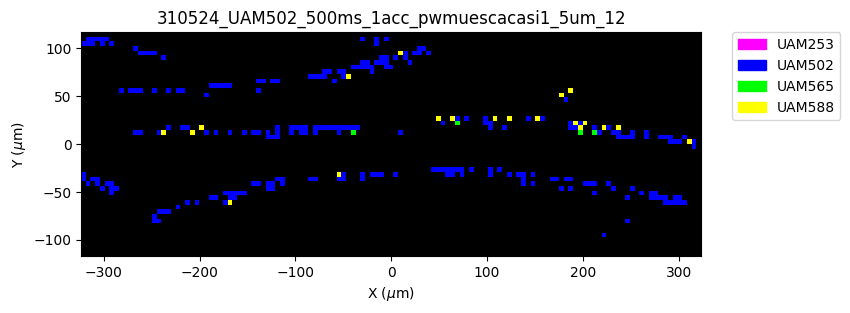

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 97.52%
Class 2 (UAM565): 0.00%
Class 3 (UAM588): 2.48%


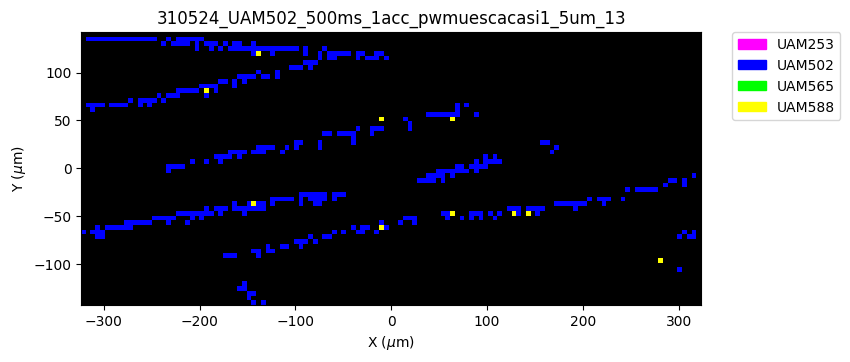

Class 0 (UAM253): 1.26%
Class 1 (UAM502): 82.66%
Class 2 (UAM565): 1.51%
Class 3 (UAM588): 14.57%


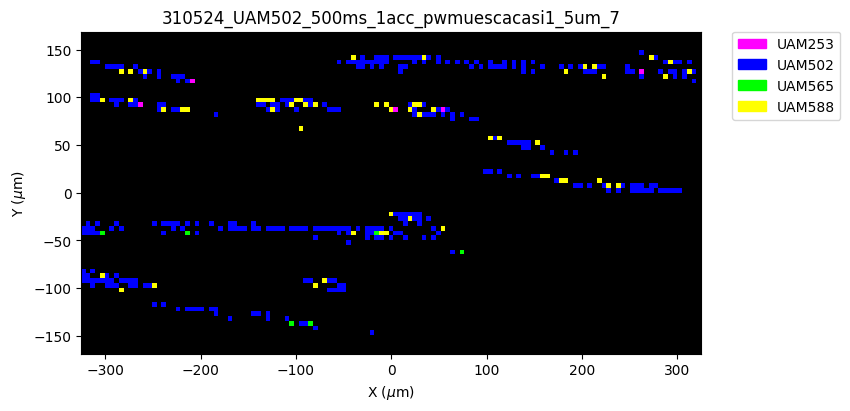

Class 0 (UAM253): 0.00%
Class 1 (UAM502): 93.67%
Class 2 (UAM565): 1.33%
Class 3 (UAM588): 5.00%


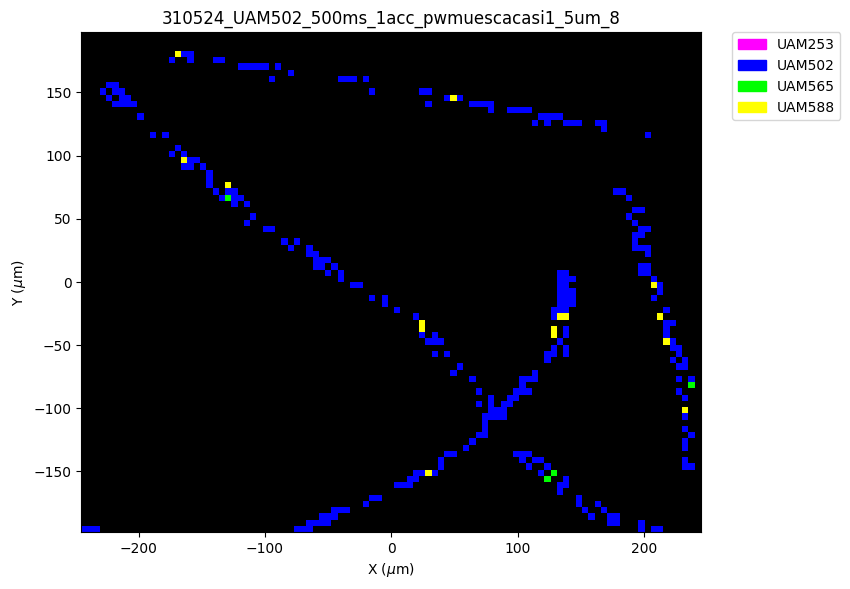

Class 0 (UAM253): 1.82%
Class 1 (UAM502): 83.33%
Class 2 (UAM565): 2.73%
Class 3 (UAM588): 12.12%


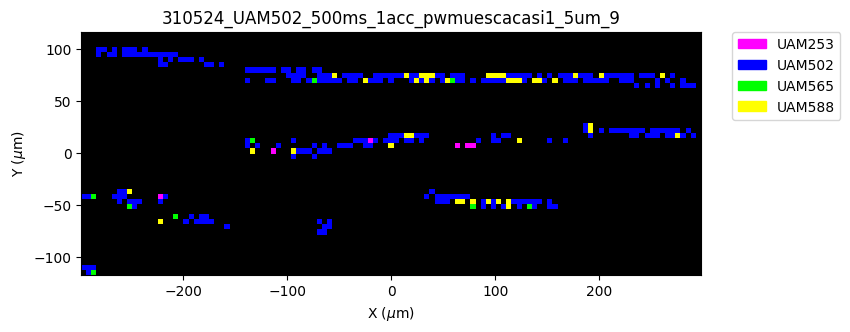

In [65]:
# Run predictions and plotting for trainval dataset
for name, group in X_Y_name_corrected_trainval.groupby('name'):
    plot_coordinate_map_with_predictions(group, predicciones_trainval[group.index], df_infomapas, name, colores)

mixed samples


Cargando modelo desde: C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\df_filtrados\trained_models\multichannel_model_3CANALS_SINCHARCO\multichannel_model_3CANALS_SINCHARCO.h5
80/80 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step
Procesando archivo: 180724_UAM253UAM502 con el modelo: multichannel_model_3CANALS_SINCHARCO


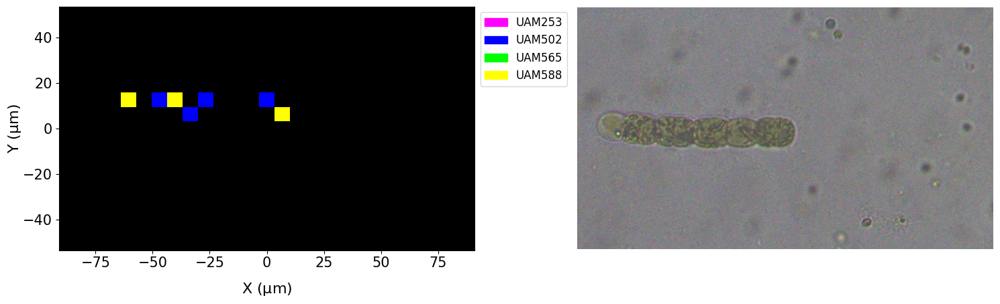

Generando espectros promedio para 180724_UAM253UAM502


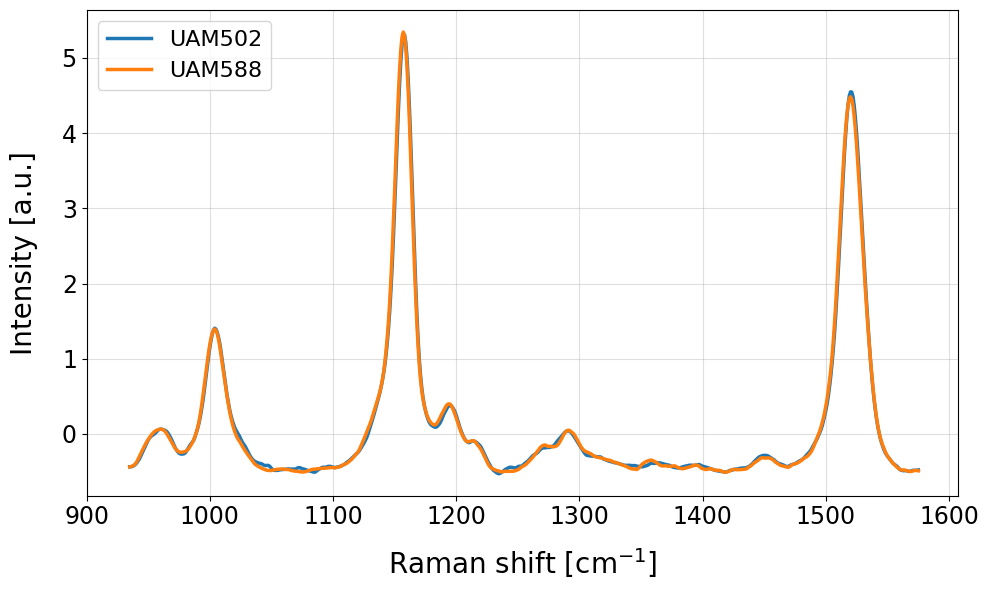

Procesando archivo: 180724_UAM253UAM502_2 con el modelo: multichannel_model_3CANALS_SINCHARCO


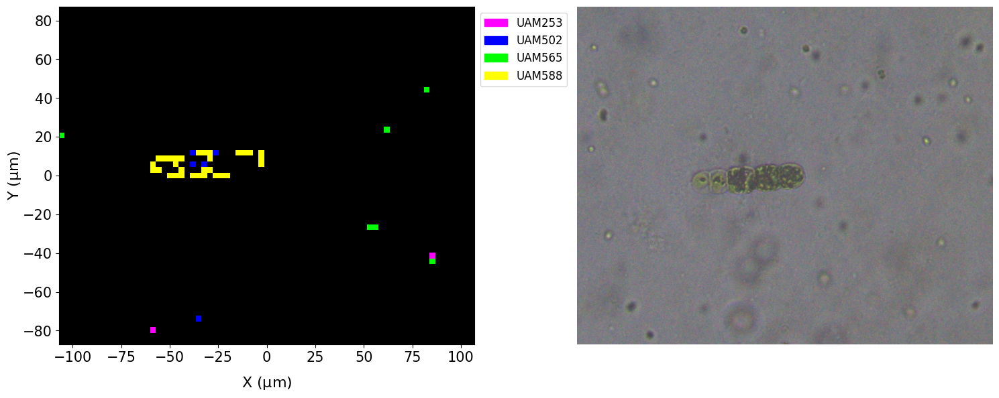

Generando espectros promedio para 180724_UAM253UAM502_2


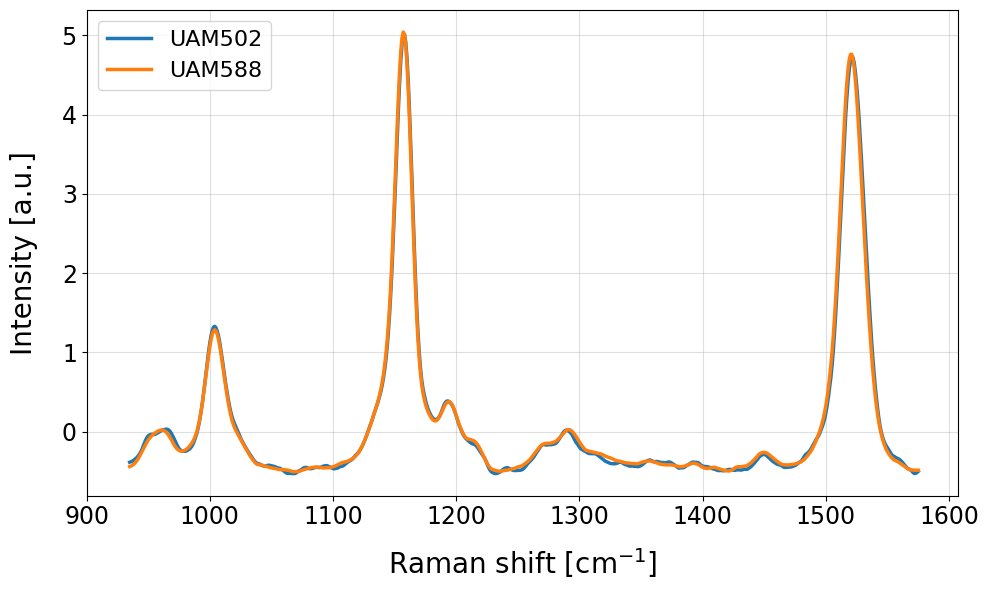

Procesando archivo: 180724_UAM253UAM502_3 con el modelo: multichannel_model_3CANALS_SINCHARCO


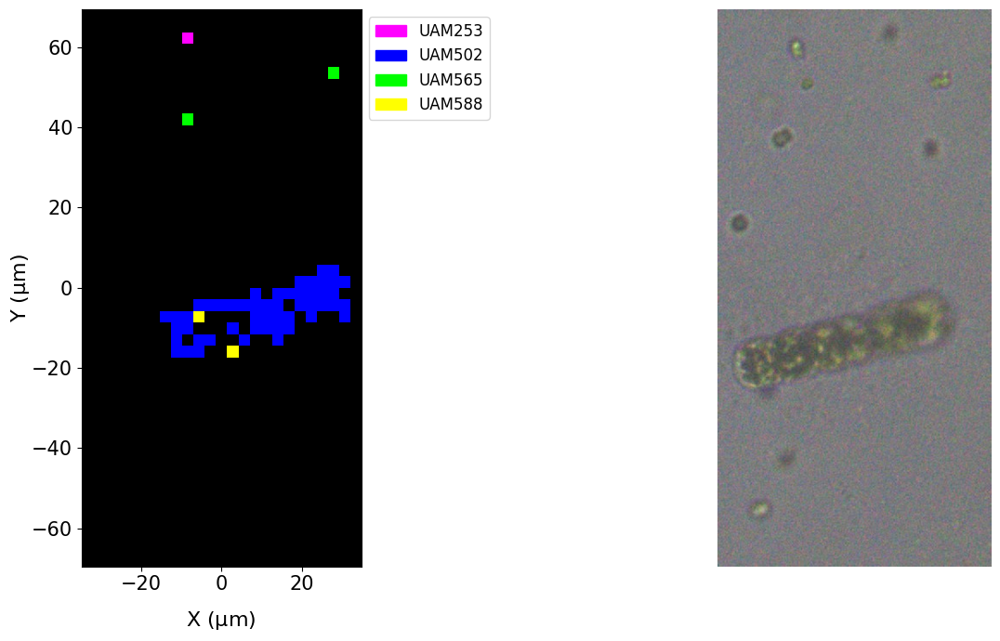

Generando espectros promedio para 180724_UAM253UAM502_3


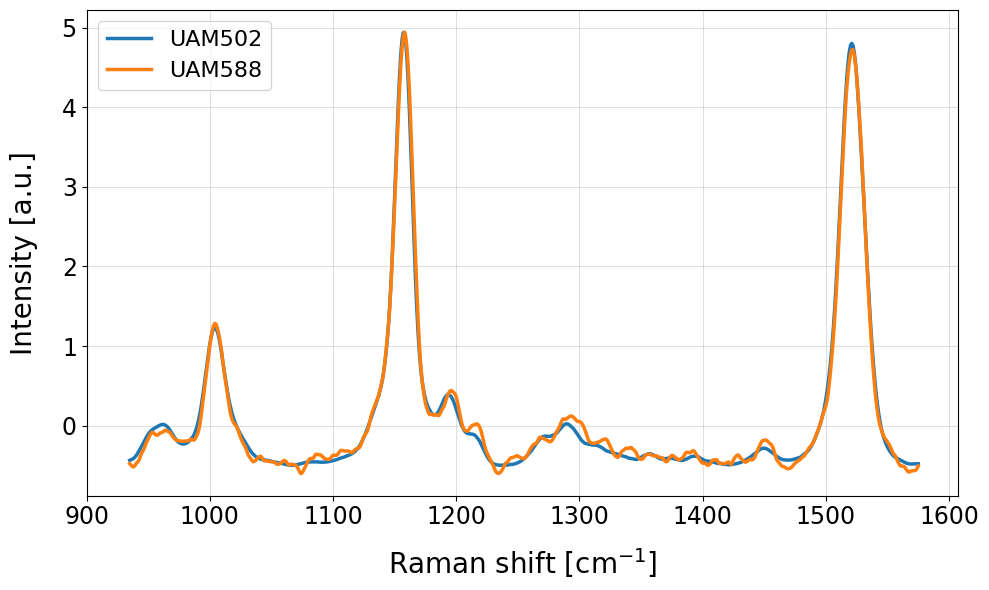

Procesando archivo: 180724_UAM253UAM502_4_larga con el modelo: multichannel_model_3CANALS_SINCHARCO


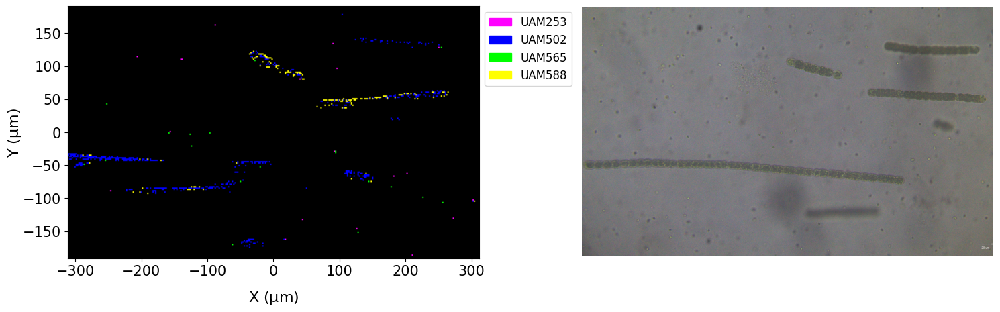

Generando espectros promedio para 180724_UAM253UAM502_4_larga


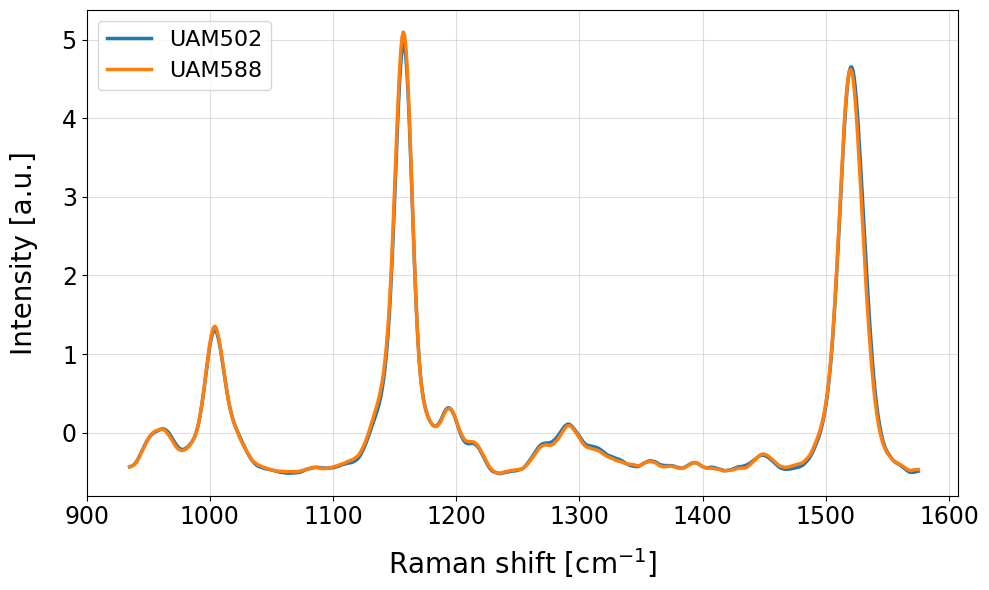

Procesando archivo: 190724_UAM253UAM502_1 con el modelo: multichannel_model_3CANALS_SINCHARCO


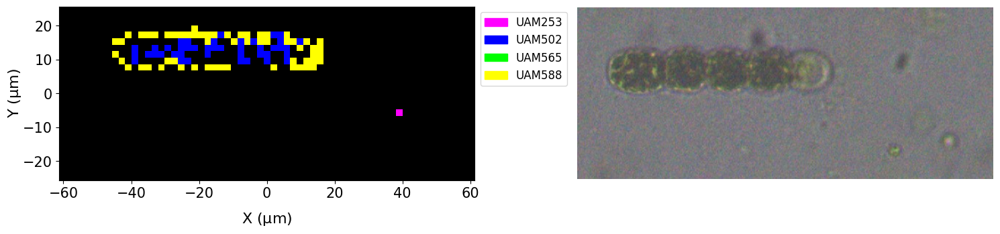

Generando espectros promedio para 190724_UAM253UAM502_1


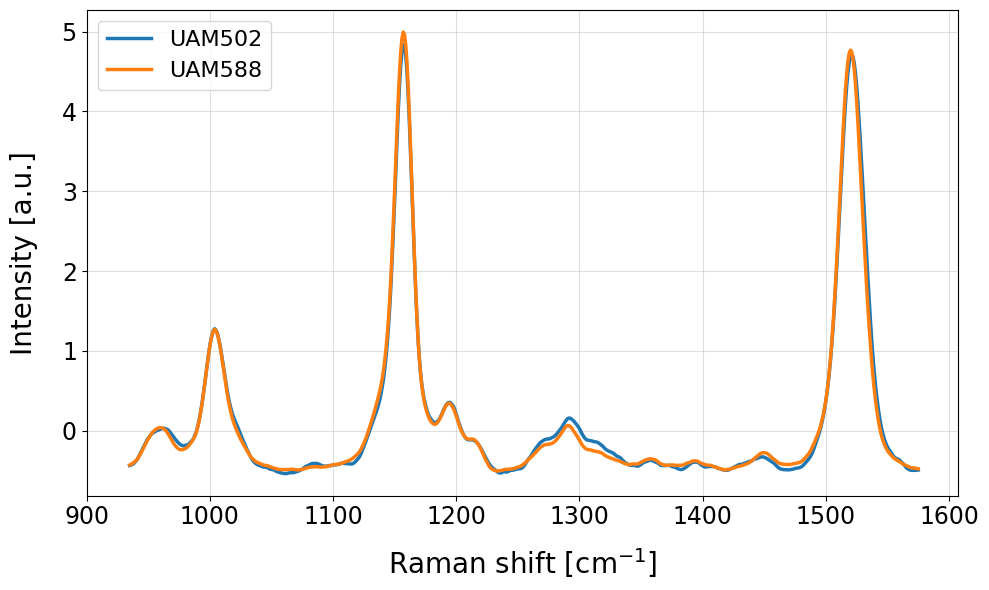

Procesando archivo: 190724_UAM253UAM502_2 con el modelo: multichannel_model_3CANALS_SINCHARCO


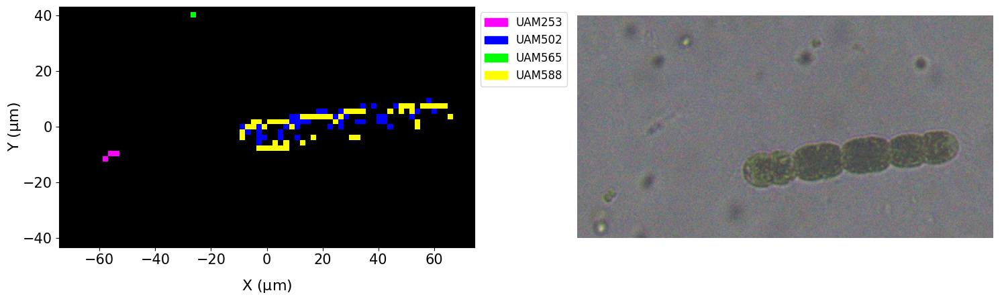

Generando espectros promedio para 190724_UAM253UAM502_2


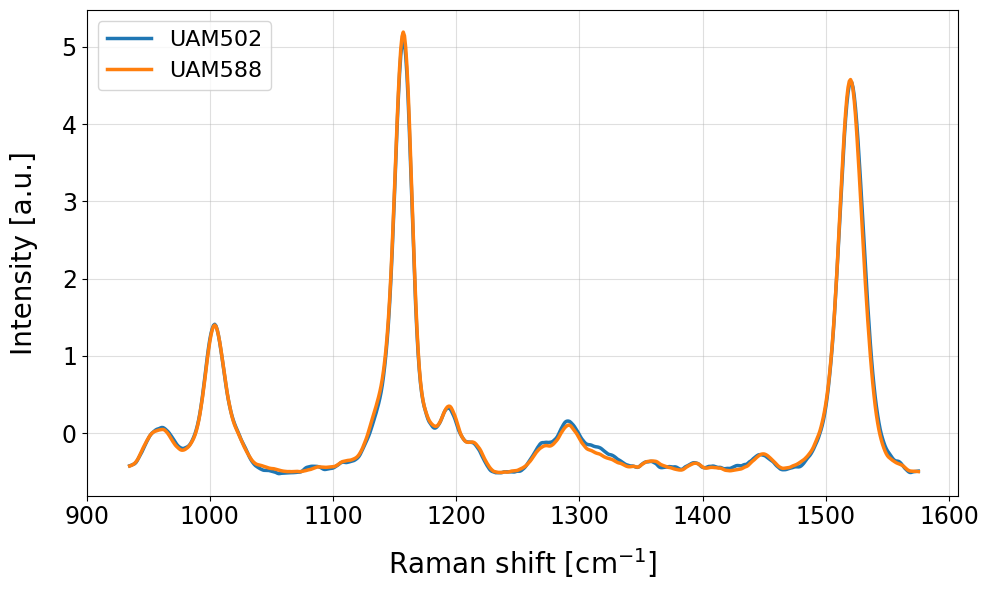

Procesando archivo: 190724_UAM253UAM502_3 con el modelo: multichannel_model_3CANALS_SINCHARCO


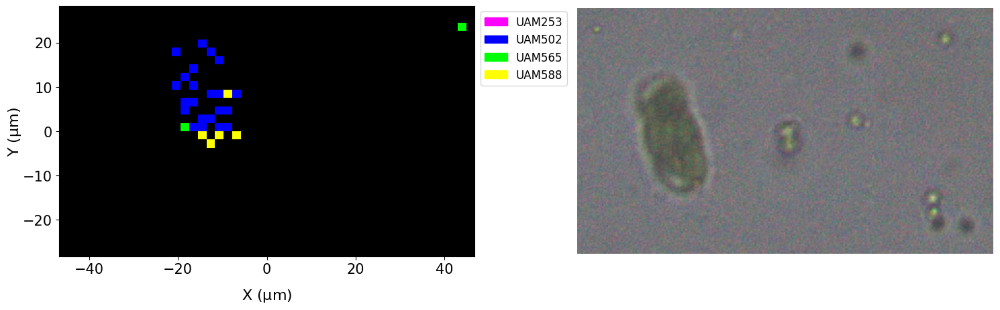

Generando espectros promedio para 190724_UAM253UAM502_3


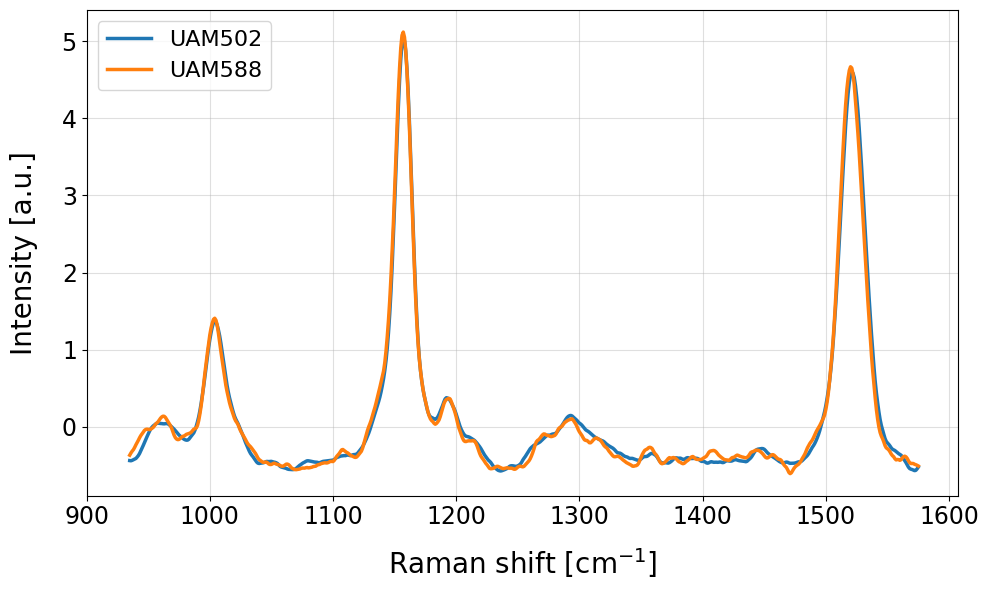

Procesando archivo: 190724_UAM253UAM502_4 con el modelo: multichannel_model_3CANALS_SINCHARCO


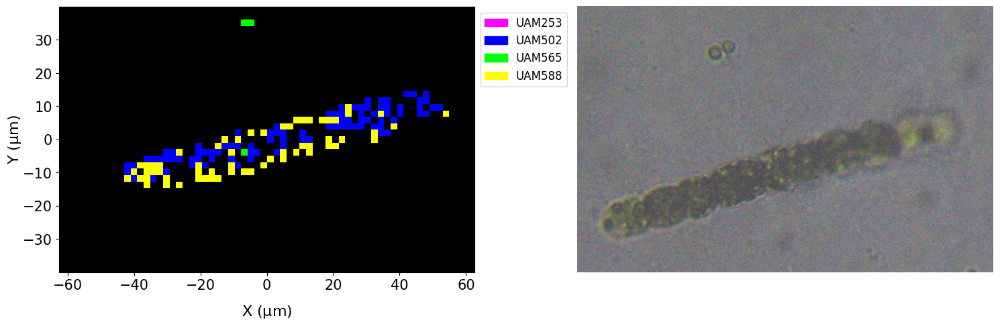

Generando espectros promedio para 190724_UAM253UAM502_4


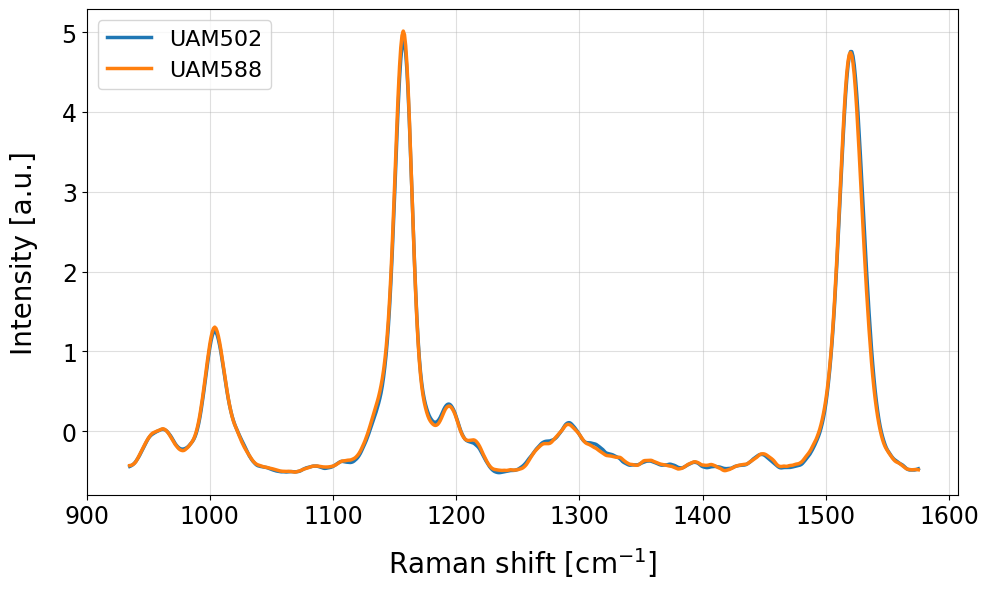

Procesando archivo: 190724_UAM253UAM502_5 con el modelo: multichannel_model_3CANALS_SINCHARCO


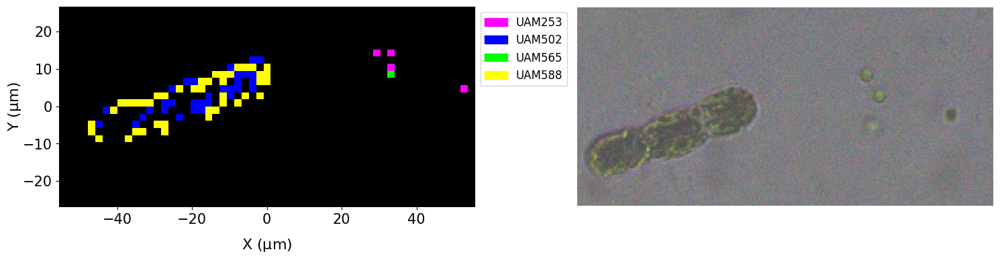

Generando espectros promedio para 190724_UAM253UAM502_5


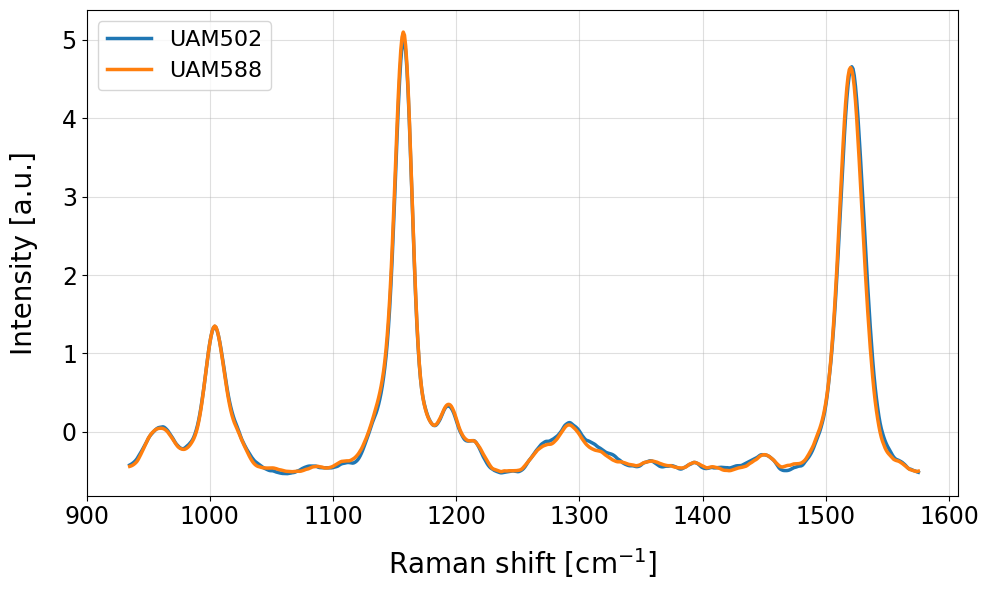

Procesando archivo: 190724_UAM253UAM502_6 con el modelo: multichannel_model_3CANALS_SINCHARCO


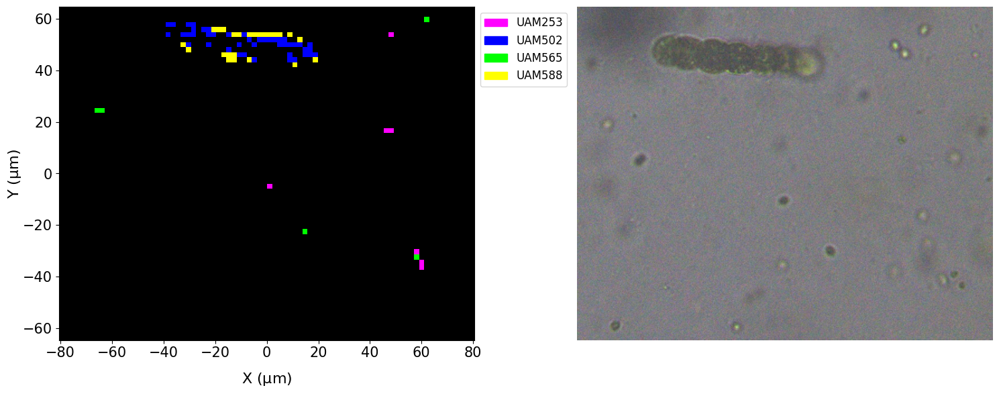

Generando espectros promedio para 190724_UAM253UAM502_6


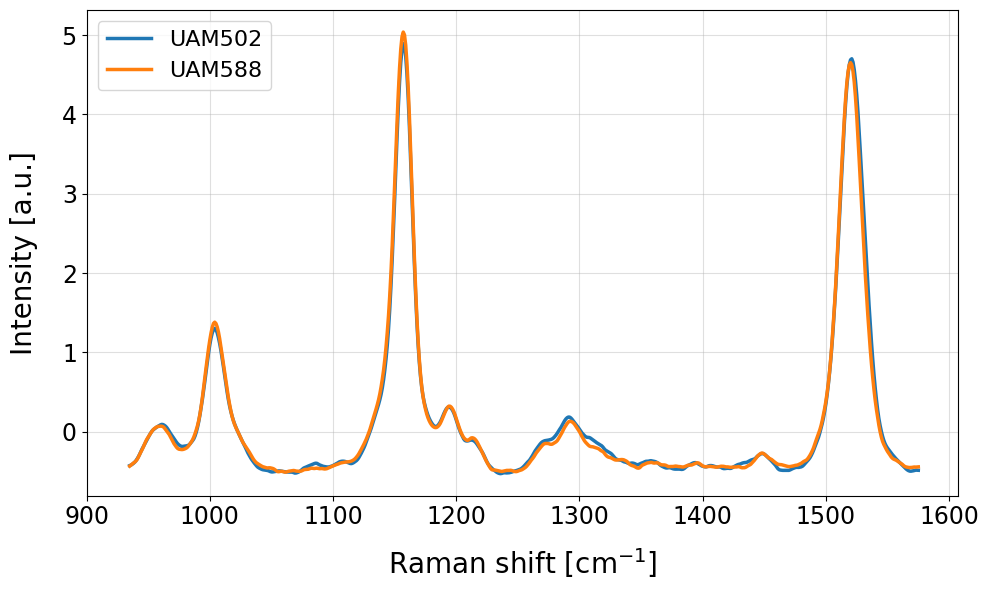

Procesando archivo: 190724_UAM253UAM588_1 con el modelo: multichannel_model_3CANALS_SINCHARCO


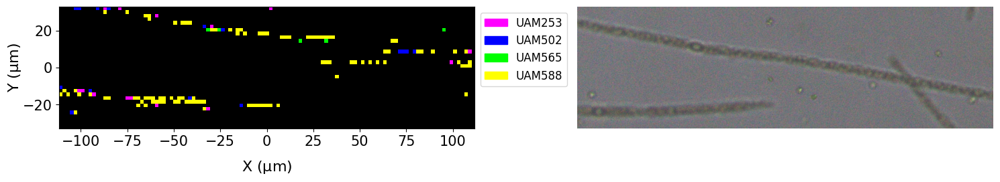

Generando espectros promedio para 190724_UAM253UAM588_1


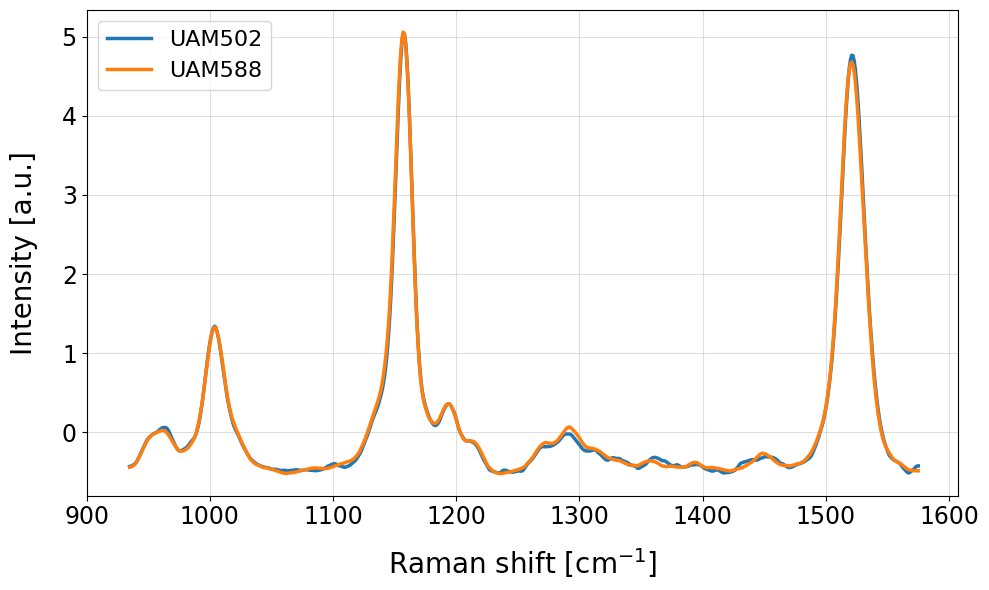

Procesando archivo: 190724_UAM253UAM588_2 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\190724_UAM253UAM588_2
No se encontró imagen JPG para 190724_UAM253UAM588_2. Mostrando solo el espectro promedio.
Error procesando 190724_UAM253UAM588_2: index 802 is out of bounds for axis 0 with size 11
Procesando archivo: 190724_UAM253UAM588_3 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\190724_UAM253UAM588_3
No se encontró imagen JPG para 190724_UAM253UAM588_3. Mostrando solo el espectro promedio.
Error procesando 190724_UAM253UAM588_3: index 818 is out of bounds for axis 0 with size 1
Procesando archivo: 190724_UAM253UAM588_4 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDri

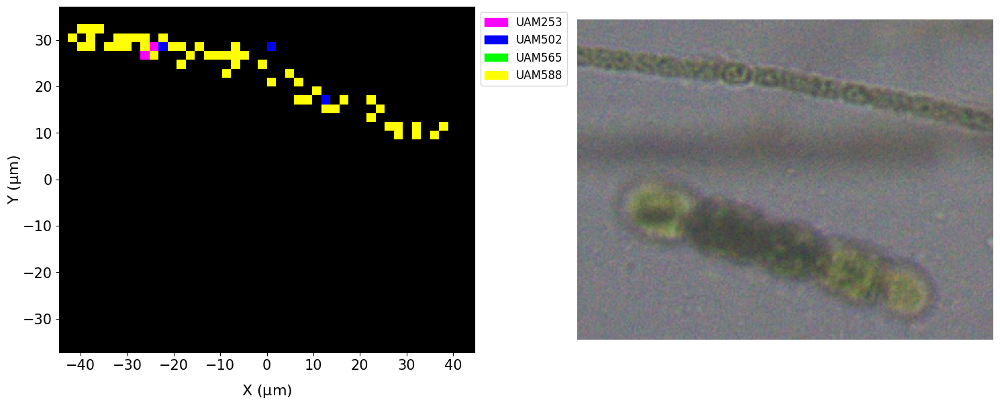

Generando espectros promedio para 200724_UAM502UAM588_10


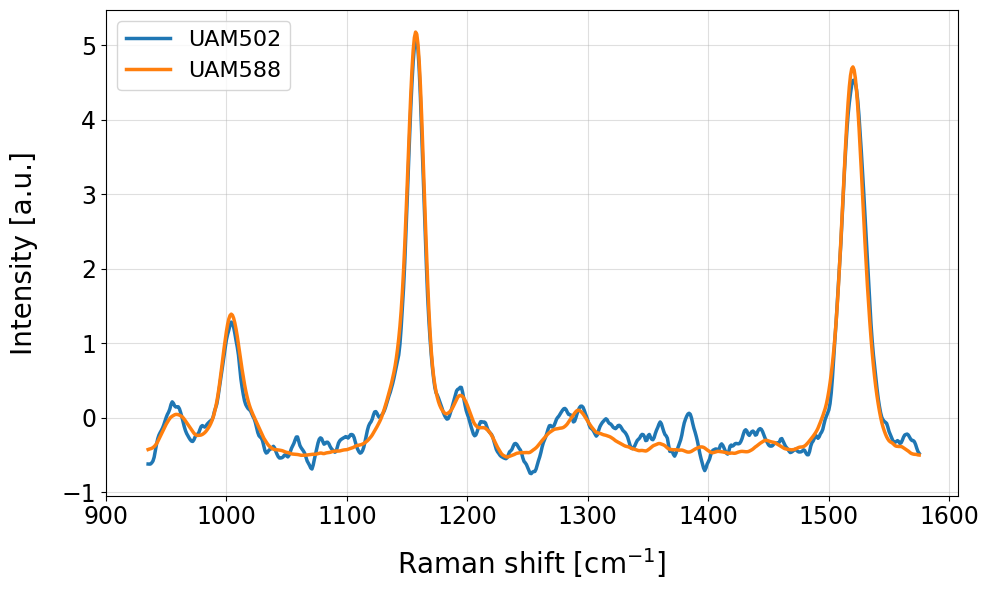

Procesando archivo: 200724_UAM502UAM588_2 con el modelo: multichannel_model_3CANALS_SINCHARCO


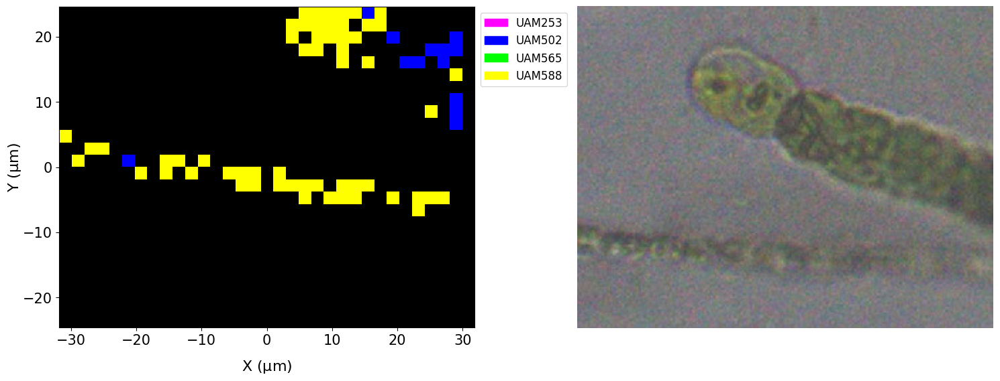

Generando espectros promedio para 200724_UAM502UAM588_2


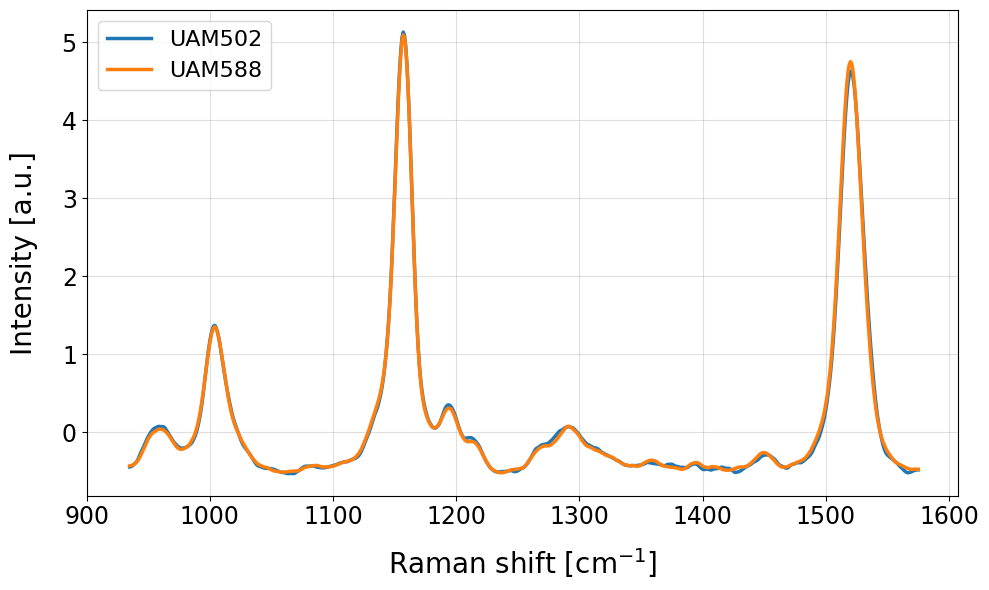

Procesando archivo: 200724_UAM502UAM588_3 con el modelo: multichannel_model_3CANALS_SINCHARCO


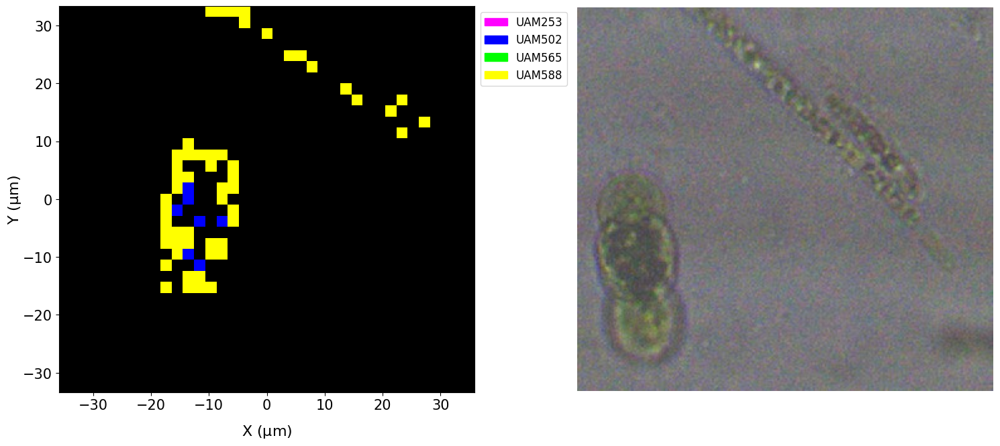

Generando espectros promedio para 200724_UAM502UAM588_3


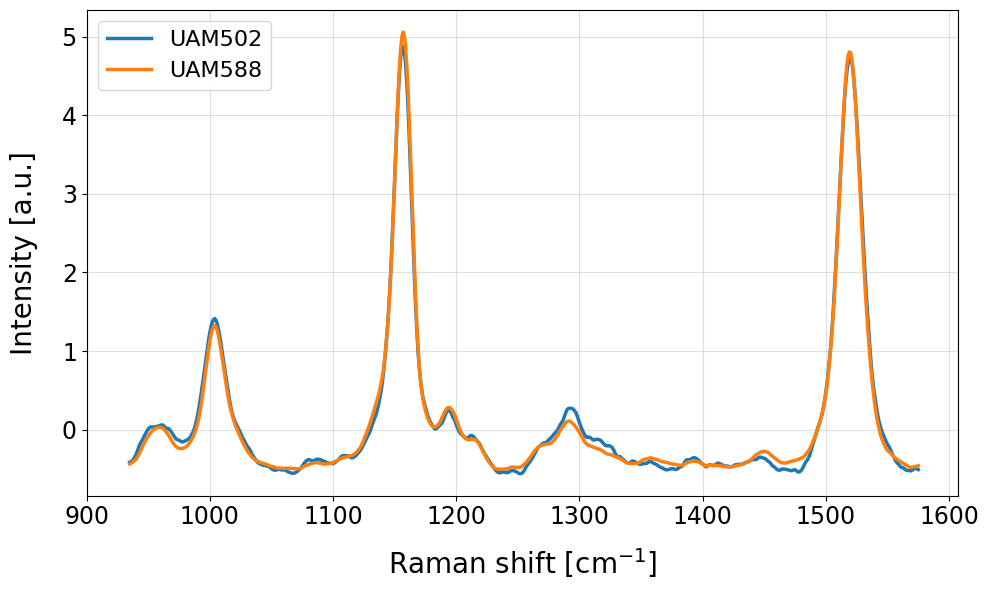

Procesando archivo: 200724_UAM502UAM588_5_larga con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\200724_UAM502UAM588_5_larga
No se encontró imagen JPG para 200724_UAM502UAM588_5_larga. Mostrando solo el espectro promedio.
Error procesando 200724_UAM502UAM588_5_larga: index 1917 is out of bounds for axis 0 with size 129
Procesando archivo: 200724_UAM502UAM588_6 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\200724_UAM502UAM588_6
No se encontró imagen JPG para 200724_UAM502UAM588_6. Mostrando solo el espectro promedio.
Error procesando 200724_UAM502UAM588_6: index 1892 is out of bounds for axis 0 with size 28
Procesando archivo: 200724_UAM502UAM588_7 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpe

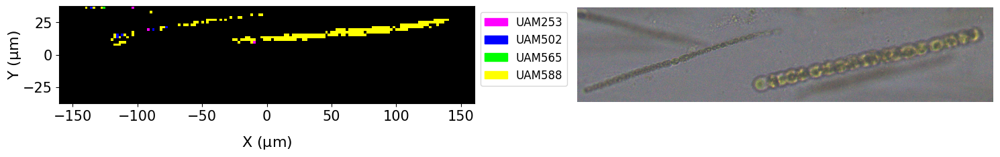

Generando espectros promedio para 200724_UAM502UAM588_8


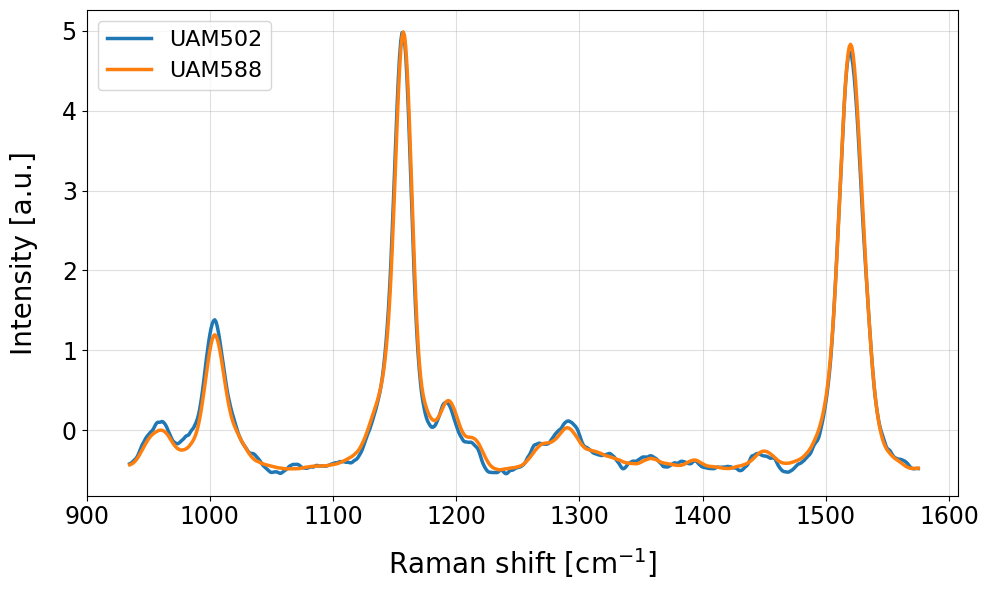

Procesando archivo: 200724_UAM502UAM588_9 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\200724_UAM502UAM588_9
No se encontró imagen JPG para 200724_UAM502UAM588_9. Mostrando solo el espectro promedio.
Error procesando 200724_UAM502UAM588_9: index 1992 is out of bounds for axis 0 with size 58
Procesando archivo: 210724_UAM253UAM588_1 con el modelo: multichannel_model_3CANALS_SINCHARCO
No se encontró la carpeta C:\Users\fmantecam\OneDrive - UNICAN\RamanNanoBase\FITOPLANCTON_ESPECIES_UAM\TFMjorge\161224_pruebasMIX\210724_UAM253UAM588_1
No se encontró imagen JPG para 210724_UAM253UAM588_1. Mostrando solo el espectro promedio.
Error procesando 210724_UAM253UAM588_1: index 2533 is out of bounds for axis 0 with size 8


In [60]:

X_test_corrected = pd.read_csv('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\MIX_CORRECTED.csv')
X_test_baselines = pd.read_csv('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\MIX_BASELINES.csv')
X_test_originals = pd.read_csv('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\MIX_ORIGINALES.csv')

# Guardar las columnas 'X', 'Y' y 'name' para usarlas después
X_Y_name_corrected = X_test_corrected[['X', 'Y', 'name']]
X_Y_name_baselines = X_test_baselines[['X', 'Y', 'name']]
X_Y_name_originals = X_test_originals[['X', 'Y', 'name']]

# Resetear los índices
X_Y_name_corrected.reset_index(drop=True, inplace=True)
X_test_corrected.reset_index(drop=True, inplace=True)

X_Y_name_baselines.reset_index(drop=True, inplace=True)
X_test_baselines.reset_index(drop=True, inplace=True)

X_Y_name_originals.reset_index(drop=True, inplace=True)
X_test_originals.reset_index(drop=True, inplace=True)

# Eliminar las columnas innecesarias para la predicción
X_test_corrected = X_test_corrected.drop(columns=['X', 'Y', 'name', 't_exp', 'date'])
X_test_baselines = X_test_baselines.drop(columns=['X', 'Y', 'name', 't_exp', 'date'])
X_test_originals = X_test_originals.drop(columns=['X', 'Y', 'name', 't_exp', 'date'])


# Cargar el archivo infomapas
ruta_infomapas = os.path.join(base_path, 'infomapas_MIX.CSV')
df_infomapas = pd.read_csv(ruta_infomapas)

# Función para buscar la imagen JPG correspondiente en la subcarpeta
def buscar_imagen_jpg(name):
    subcarpeta = os.path.join('C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\161224_pruebasMIX', name)
    if os.path.exists(subcarpeta):
        for archivo in os.listdir(subcarpeta):
            if archivo.lower().endswith(('.jpg', '.jpeg', '.png')):
                imagen_jpg = Image.open(os.path.join(subcarpeta, archivo))
                imagen_jpg.load()
                if imagen_jpg.mode != 'RGB':
                    imagen_jpg = imagen_jpg.convert('RGB')
                return imagen_jpg
    print(f"No se encontró la carpeta {subcarpeta}")
    return None

# Función para procesar y graficar el mapa de coordenadas con las predicciones y la leyenda
def plot_coordinate_map_with_predictions(group, predicciones, df_infomapas, name, colores, clases, output_path, modelo_actual):
    print(f"Procesando archivo: {name} con el modelo: {modelo_actual}")
    group_infomapas = df_infomapas[df_infomapas['filename'] == name]

    if group_infomapas.empty:
        print(f"No se encontraron datos en infomapas para el archivo: {name}")
        return

    X_min, X_max = group_infomapas['X_min'].values[0], group_infomapas['X_max'].values[0]
    Y_min, Y_max = group_infomapas['Y_min'].values[0], group_infomapas['Y_max'].values[0]
    X_step, Y_step = group_infomapas['X_step'].values[0], group_infomapas['Y_step'].values[0]

    x_range = np.arange(X_min, X_max + X_step, X_step)
    y_range = np.arange(Y_min, Y_max + Y_step, Y_step)
    mapa_clasificacion = np.full((len(y_range), len(x_range), 3), [0, 0, 0], dtype=np.uint8)

    for i, (index, row) in enumerate(group.iterrows()):
        x_idx = np.argmin(np.abs(x_range - row['X']))
        y_idx = np.argmin(np.abs(y_range - row['Y']))
        mapa_clasificacion[y_idx, x_idx] = colores[predicciones[i]]

    imagen_jpg = buscar_imagen_jpg(name)
    if not imagen_jpg:
        print(f"No se encontró imagen JPG para {name}. Mostrando solo el espectro promedio.")
        plot_average_spectra(X_test_corrected.iloc[group.index], predicciones[group.index], clases, output_path, name, modelo_actual)
        return

    fig, ax = plt.subplots(1, 2, figsize=(15, 7))
    ax[0].imshow(mapa_clasificacion, origin='upper', extent=[X_min, X_max, Y_min, Y_max])
    ax[0].set_xlabel('X ($\\mathrm{\\mu}$m)', fontsize=16, labelpad = 12)
    ax[0].set_ylabel('Y ($\\mathrm{\\mu}$m)', fontsize=16, labelpad = 0)
    ax[0].tick_params(axis='both', which='major', labelsize=15)
    patches = [mpatches.Patch(color=np.array(color)/255, label=clase) for clase, color in zip(clases.values(), colores.values())]
    ax[0].legend(handles=patches, fontsize = 12, bbox_to_anchor=(1, 1), loc='upper left')
    #ax[1].text(0.92, 0.97, '(b)', transform=ax[1].transAxes, fontsize=25, verticalalignment='top')
    ax[1].imshow(imagen_jpg)
    ax[1].axis('off')

    plt.tight_layout()

    fig.savefig(os.path.join(output_path, f"{name}_combinado.svg"), format="svg", dpi=300)
    fig.savefig(os.path.join(output_path, f"{name}_combinado.png"), format="png", dpi=300)
    plt.show()
    plt.close(fig)

def plot_average_spectra(X_test_corrected, predicciones, clases, output_path, name, modelo_actual):
    print(f"Generando espectros promedio para {name}")
    promedio_por_clase = {1: [], 3: []}
    for i, clase in enumerate(predicciones):
        if clase in promedio_por_clase:
            promedio_por_clase[clase].append(X_test_corrected.iloc[i].values)

    plt.figure(figsize=(10, 6))
    colors = {1: 'C0', 3: 'C1'}
    for clase, espectros in promedio_por_clase.items():
        if espectros:
            promedio = np.mean(espectros, axis=0)
            plt.plot(raman_shifts, promedio, label=clases[clase], color=colors[clase], linewidth=2.5)
        else:
            plt.plot([], [], label=f"Sin datos para {clases[clase]}", color=colors[clase])

    plt.xlabel('Raman shift [cm$^{-1}$]', fontsize=20, labelpad=12)
    plt.ylabel('Intensity [a.u.]', fontsize=20, labelpad=17)
    plt.xticks(np.arange(900, 1700, 100))
    plt.tick_params(axis='both', which='major', labelsize=17)
    plt.legend(fontsize=16, loc='upper left')
    plt.grid(alpha=0.4)
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, f"{name}_espectros_promedio.png"))
    plt.show()
    plt.close()


colores = {
    0: [255, 0, 255],
    1: [0, 0, 255],
    2: [0, 255, 0],
    3: [255, 255, 0]
}

clases = {
    0: 'UAM253',
    1: 'UAM502',
    2: 'UAM565',
    3: 'UAM588'
}

results_dir = 'C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\161224_pruebasMIX\\resultadosMIXimages\\'
if not os.path.exists(results_dir):
    os.makedirs(results_dir)

subdir_path = 'C:\\Users\\fmantecam\\OneDrive - UNICAN\\RamanNanoBase\\FITOPLANCTON_ESPECIES_UAM\\TFMjorge\\df_filtrados\\trained_models\\multichannel_model_3CANALS_SINCHARCO'
subdir = os.path.basename(subdir_path)

if os.path.isdir(subdir_path):
    h5_files = [f for f in os.listdir(subdir_path) if f.endswith('.h5')]
    if h5_files:
        model_path = os.path.join(subdir_path, h5_files[0])
        print(f"\nCargando modelo desde: {model_path}")
        try:
            model = load_model(model_path)
        except Exception as e:
            print(f"Error cargando el modelo: {e}")

        predicciones = model.predict([X_test_corrected, X_test_baselines, X_test_originals])
        predicciones = np.argmax(predicciones, axis=1)

        model_results_dir = os.path.join(results_dir, subdir)
        if not os.path.exists(model_results_dir):
            os.makedirs(model_results_dir)

        grouped_by_name = X_Y_name_corrected.groupby('name')

        for name, group in grouped_by_name:
            try:
                indices_filtrados = group.index.to_numpy()
                predicciones_filtradas = predicciones[indices_filtrados]
                plot_coordinate_map_with_predictions(group, predicciones_filtradas, df_infomapas, name, colores, clases, model_results_dir, subdir)
                plot_average_spectra(X_test_corrected.iloc[indices_filtrados], predicciones_filtradas, clases, model_results_dir, name, subdir)
            except Exception as e:
                print(f"Error procesando {name}: {e}")

